## Medial Axis


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from grid import create_grid
from skimage.morphology import medial_axis
from skimage.util import invert
from planning import a_star
%matplotlib inline 

In [2]:
plt.rcParams['figure.figsize'] = 12, 12

In [3]:
# This is the same obstacle data from the previous lesson.
filename = 'colliders.csv'
data = np.loadtxt(filename, delimiter=',', dtype='Float64', skiprows=2)
print(data)

[[-310.2389   -439.2315     85.5         5.          5.         85.5     ]
 [-300.2389   -439.2315     85.5         5.          5.         85.5     ]
 [-290.2389   -439.2315     85.5         5.          5.         85.5     ]
 ..., 
 [ 257.8061    425.1645      1.75852     1.292725    1.292725    1.944791]
 [ 293.9967    368.3391      3.557666    1.129456    1.129456    3.667319]
 [ 281.5162    354.4156      4.999351    1.053772    1.053772    4.950246]]


Starting and goal positions in *(north, east)*.

In [4]:
start_ne = (25,  100)
goal_ne = (650, 500)

In [5]:
# Static drone altitude (meters)
drone_altitude = 5
safety_distance = 2

In [6]:
grid = create_grid(data, drone_altitude, safety_distance)
skeleton = medial_axis(invert(grid))


Plot the edges on top of the grid along with start and goal locations.

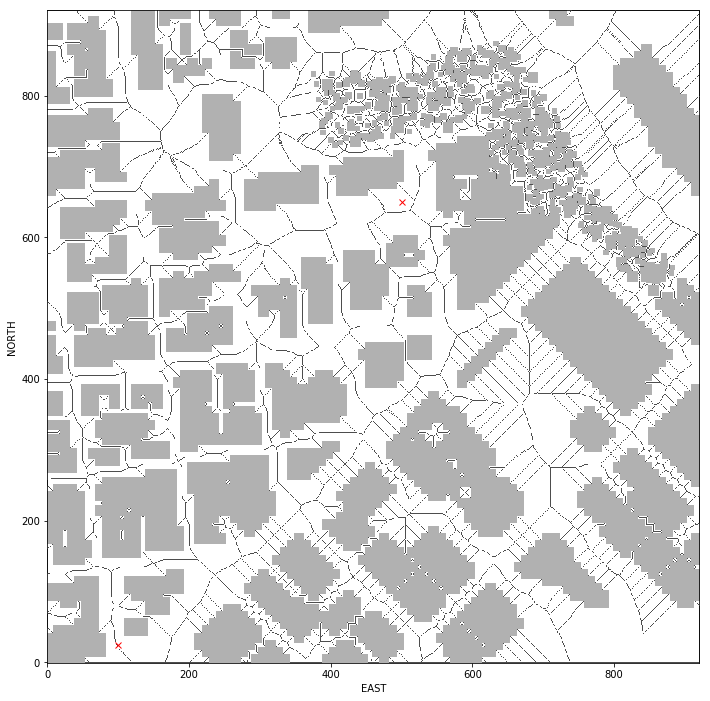

In [7]:
# equivalent to
# plt.imshow(np.flip(grid, 0))

plt.imshow(grid, cmap='Greys', origin='lower')
plt.imshow(skeleton, cmap='Greys', origin='lower', alpha=0.7)
    
plt.plot(start_ne[1], start_ne[0], 'rx')
plt.plot(goal_ne[1], goal_ne[0], 'rx')

plt.xlabel('EAST')
plt.ylabel('NORTH')
plt.show()

In [23]:
# The start and goal location defined above
# will not necessarily be on the skeleton so we
# must first identify the nearest cell on the 
# skeleton to start and goal

def find_start_goal(skel, start, goal):
    # Find the nearest point on the skeleton to the
    # start and goal positions
    
    # Find all non-zero elements of the skeleton array
    nz = np.transpose(np.nonzero(skel))
    # Calculate the distance of all non-zero elements to the start
    start_dist = np.linalg.norm(nz - np.array(start), axis=1)
    # Find the index of the minimum distance element and get the
    # skeleton coordinates
    near_start = nz[start_dist.argmin()]

    # Calculate the distance of all non-zero elements to the goal
    goal_dist = np.linalg.norm(nz - np.array(goal), axis=1)
    # Find the index of the minimum distance element and get the
    # skeleton coordinates
    near_goal = nz[goal_dist.argmin()]
    
    return tuple(near_start), tuple(near_goal)

skel_start, skel_goal = find_start_goal(skeleton, start_ne, goal_ne)

print(start_ne, goal_ne)
print(skel_start, skel_goal)


(25, 100) (650, 500)
(24, 99) (636, 501)


In [9]:
def heuristic_func(position, goal_position):
    # Use euclidean distance as the heuristic for now
    return np.sqrt((goal_position[0] - position[0])**2 +
                   (goal_position[1] - position[1])**2)


### TODO: Run A* on the skeleton
see [planning.py](/edit/planning.py) for a reminder on how to run the imported A* implementation (or rewrite it!)

In [24]:
# The skeleton array has 'True' for all pixels corresponding to the
# skeleton lines, but true in our map means that an obstacle exists
# in that cell. We need to invert the skeleton map so everywhere
# looks like an obstacle except the skeleton lines.
path, cost = a_star(invert(skeleton).astype(np.int), 
                    heuristic_func, skel_start, skel_goal)



(24, 99)
(0, (24, 99))
(24, 99)
(23, 99)
(25, 98)
(733.35000309585394, (25, 98))
(25, 98)
(26, 98)
(24, 99)
(733.51543774408651, (26, 98))
(26, 98)
(25, 98)
(27, 97)
(734.0572965328154, (23, 99))
(23, 99)
(24, 99)
(22, 100)
(734.64783026070563, (27, 97))
(27, 97)
(28, 97)
(26, 98)
(734.8147283660777, (28, 97))
(28, 97)
(27, 97)
(29, 97)
(734.98204605562694, (29, 97))
(29, 97)
(28, 97)
(30, 96)
(735.04970515482364, (24, 99))
(24, 99)
(23, 99)
(25, 98)
(735.76065283919945, (22, 100))
(22, 100)
(21, 101)
(23, 99)
(736.11917344146718, (30, 96))
(30, 96)
(31, 96)
(29, 97)
(736.28796894628749, (31, 96))
(31, 96)
(30, 96)
(32, 96)
(736.45718949647858, (32, 96))
(32, 96)
(31, 96)
(33, 96)
(736.62683655043793, (33, 96))
(33, 96)
(32, 96)
(34, 95)
(737.46662133221798, (21, 101))
(21, 101)
(20, 101)
(22, 100)
(737.76979312332901, (34, 95))
(34, 95)
(35, 95)
(33, 96)
(737.94093652346601, (35, 95))
(35, 95)
(34, 95)
(36, 95)
(738.1125119677547, (36, 95))
(36, 95)
(35, 95)
(37, 95)
(738.284520940035

(92, 219)
(806.74085743951775, (187, 135))
(187, 135)
(186, 135)
(188, 135)
(806.74967019579992, (94, 220))
(94, 220)
(93, 220)
(95, 221)
(806.77880288999813, (128, 162))
(128, 162)
(127, 163)
(129, 161)
(806.81598509708817, (95, 221))
(95, 221)
(96, 221)
(94, 220)
(806.89053921971083, (176, 69))
(176, 69)
(177, 69)
(175, 70)
(806.92805664543141, (96, 221))
(96, 221)
(95, 221)
(97, 222)
(806.96492760696128, (145, 201))
(145, 201)
(145, 200)
(145, 202)
(806.96609274373805, (188, 135))
(188, 135)
(187, 135)
(189, 135)
(806.99434902615053, (97, 222))
(97, 222)
(97, 223)
(98, 222)
(96, 221)
(807.0388242744624, (74, 196))
(74, 196)
(73, 197)
(75, 195)
(807.04430455404486, (0, 182))
(0, 182)
(0, 181)
(0, 183)
(807.10644487237323, (98, 222))
(98, 222)
(97, 222)
(97, 223)
(99, 223)
(807.15822332081348, (74, 206))
(74, 206)
(73, 207)
(75, 205)
(807.16196704971856, (177, 69))
(177, 69)
(176, 69)
(178, 69)
(807.16513967917956, (0, 97))
(0, 97)
(0, 96)
(0, 98)
(807.17271456994649, (99, 223))
(99, 

(170, 310)
(172, 308)
(830.43939257530906, (178, 318))
(178, 318)
(177, 317)
(179, 319)
(830.44621607859983, (222, 60))
(222, 60)
(221, 60)
(223, 60)
(830.45579263674665, (95, 174))
(95, 174)
(95, 173)
(94, 175)
(830.48884510371738, (130, 54))
(130, 54)
(130, 53)
(130, 55)
(830.55426461374088, (179, 319))
(179, 319)
(178, 318)
(180, 320)
(830.62362901611368, (196, 199))
(196, 199)
(197, 199)
(195, 200)
(830.66977200930978, (180, 320))
(180, 320)
(179, 319)
(179, 321)
(181, 319)
(181, 321)
(830.76222005204636, (223, 60))
(223, 60)
(222, 60)
(224, 60)
(830.78591982102307, (181, 321))
(181, 321)
(180, 320)
(182, 322)
(830.79945044229089, (197, 199))
(197, 199)
(196, 199)
(198, 199)
(830.90271315920609, (182, 322))
(182, 322)
(181, 321)
(183, 323)
(830.92396110359721, (178, 263))
(178, 263)
(179, 263)
(177, 264)
(830.97587471858515, (198, 199))
(198, 199)
(197, 199)
(199, 198)
(831.02015718611869, (183, 323))
(183, 323)
(182, 322)
(184, 324)
(831.03682377544806, (179, 263))
(179, 263)
(178

(852.12665571601383, (273, 413))
(273, 413)
(272, 412)
(274, 414)
(852.1650641844559, (130, 41))
(130, 41)
(130, 40)
(130, 42)
(852.17470896178247, (256, 384))
(256, 384)
(255, 385)
(257, 383)
(852.17587822284418, (258, 190))
(258, 190)
(257, 190)
(259, 190)
(852.19983125560157, (271, 409))
(271, 409)
(270, 410)
(272, 408)
(852.28279391866704, (253, 53))
(253, 53)
(252, 52)
(254, 54)
(852.33414712658964, (274, 414))
(274, 414)
(273, 413)
(275, 415)
(852.33614511375208, (195, 246))
(195, 246)
(195, 245)
(195, 247)
(852.33926311094683, (268, 71))
(268, 71)
(268, 70)
(269, 72)
(852.34352288677178, (269, 72))
(269, 72)
(269, 73)
(268, 71)
(852.40406619862824, (259, 190))
(259, 190)
(258, 190)
(260, 190)
(852.41894691927314, (264, 396))
(264, 396)
(263, 397)
(265, 395)
(852.45345071041811, (227, 383))
(227, 383)
(226, 384)
(228, 382)
(852.47132854085601, (242, 338))
(242, 338)
(241, 339)
(243, 337)
(852.54310396208575, (275, 415))
(275, 415)
(274, 414)
(276, 416)
(852.57928261003985, (101, 

(358, 452)
(360, 450)
(870.94806887581922, (304, 324))
(304, 324)
(303, 323)
(305, 325)
(870.95126795816941, (250, 410))
(250, 410)
(249, 411)
(251, 409)
(870.95819827014225, (261, 419))
(261, 419)
(260, 420)
(262, 418)
(870.96358071614236, (220, 395))
(220, 395)
(220, 394)
(220, 396)
(871.00444080867214, (339, 461))
(339, 461)
(338, 462)
(340, 460)
(871.0096320268558, (305, 325))
(305, 325)
(305, 326)
(304, 324)
(871.05573520713324, (290, 212))
(290, 212)
(290, 211)
(290, 213)
(871.06308957406918, (292, 181))
(292, 181)
(293, 181)
(291, 182)
(871.07146646812271, (292, 50))
(292, 50)
(291, 50)
(293, 50)
(871.07336414884958, (272, 428))
(272, 428)
(271, 429)
(273, 427)
(871.08664016552018, (197, 233))
(197, 233)
(196, 234)
(871.1035182718706, (280, 150))
(280, 150)
(280, 149)
(280, 151)
(871.13337727114765, (92, 270))
(92, 270)
(92, 271)
(93, 269)
(871.18807360149526, (288, 110))
(288, 110)
(287, 110)
(289, 110)
(871.22657949603058, (128, 31))
(128, 31)
(128, 30)
(129, 32)
(871.30818150

(338, 58)
(887.87718921442797, (332, 310))
(332, 310)
(331, 310)
(333, 310)
(887.87866708661727, (416, 436))
(416, 436)
(415, 435)
(417, 437)
(887.89849870813077, (338, 58))
(338, 58)
(337, 57)
(339, 59)
(887.92489039576412, (339, 59))
(339, 59)
(338, 58)
(340, 60)
(887.94754383749989, (344, 476))
(344, 476)
(343, 477)
(345, 475)
(887.95142131621424, (340, 60))
(340, 60)
(339, 59)
(341, 61)
(887.97809256366372, (341, 61))
(341, 61)
(340, 60)
(342, 62)
(887.979287293879, (300, 265))
(300, 265)
(300, 264)
(300, 266)
(887.98968265251494, (354, 485))
(354, 485)
(353, 486)
(355, 484)
(888.00490524367797, (342, 62))
(342, 62)
(341, 61)
(343, 63)
(888.02894671554395, (370, 499))
(370, 499)
(370, 500)
(369, 498)
(888.03084020673521, (333, 310))
(333, 310)
(332, 310)
(334, 310)
(888.03186047335225, (343, 63))
(343, 63)
(343, 64)
(342, 62)
(888.0465420573579, (322, 348))
(322, 348)
(321, 349)
(323, 347)
(888.05151726670124, (417, 437))
(417, 437)
(416, 436)
(418, 438)
(888.11207679553263, (307, 

(296, 463)
(903.3286182245821, (83, 293))
(83, 293)
(82, 292)
(84, 294)
(903.36354163251031, (361, 175))
(361, 175)
(360, 175)
(362, 175)
(903.40779634069202, (183, 373))
(183, 373)
(182, 372)
(184, 374)
(903.40932725484481, (411, 519))
(411, 519)
(410, 520)
(412, 518)
(903.42564135522059, (300, 299))
(300, 299)
(300, 298)
(300, 300)
(903.45508934727854, (84, 294))
(84, 294)
(83, 293)
(85, 295)
(903.47490740890157, (325, 394))
(325, 394)
(325, 393)
(325, 395)
(903.54487329907499, (361, 110))
(361, 110)
(360, 110)
(362, 110)
(903.55266139981109, (364, 506))
(364, 506)
(363, 507)
(365, 505)
(903.56625098439144, (373, 77))
(373, 77)
(372, 78)
(374, 76)
(903.58214137962636, (85, 295))
(85, 295)
(84, 294)
(86, 296)
(903.62083729321125, (204, 406))
(204, 406)
(203, 407)
(205, 405)
(903.70977814328967, (86, 296))
(86, 296)
(85, 295)
(87, 297)
(903.7194422752624, (362, 175))
(362, 175)
(361, 175)
(363, 175)
(903.74885221233558, (412, 518))
(412, 518)
(411, 519)
(413, 517)
(903.75790614155289, 

(350, 152)
(921.70822672605846, (401, 110))
(401, 110)
(400, 110)
(402, 110)
(921.72025508140109, (445, 396))
(445, 396)
(445, 395)
(445, 397)
(921.7494827313767, (507, 493))
(507, 493)
(508, 493)
(506, 492)
(921.75141510021945, (508, 493))
(508, 493)
(507, 493)
(509, 493)
(921.75337781053122, (509, 493))
(509, 493)
(508, 493)
(510, 494)
(921.77254936201064, (405, 545))
(405, 545)
(405, 544)
(405, 546)
(921.79615231187518, (365, 290))
(365, 290)
(365, 289)
(365, 291)
(921.84259877897375, (187, 397))
(187, 397)
(186, 396)
(921.88123950276895, (350, 152))
(350, 152)
(350, 151)
(350, 153)
(921.89972762723289, (70, 296))
(70, 296)
(70, 295)
(69, 297)
(921.90918262057528, (410, 410))
(410, 410)
(409, 409)
(411, 411)
(921.93698415570236, (504, 486))
(504, 486)
(503, 487)
(505, 485)
(921.94307499054139, (317, 483))
(317, 483)
(316, 484)
(318, 482)
(921.96656153448976, (394, 170))
(394, 170)
(393, 170)
(395, 170)
(921.97130203655706, (176, 366))
(176, 366)
(175, 365)
(177, 367)
(921.9731422718

(936.29250304460516, (475, 468))
(475, 468)
(475, 467)
(475, 469)
(936.29485779735569, (160, 0))
(160, 0)
(159, 0)
(161, 1)
(936.29532151347553, (161, 1))
(161, 1)
(160, 0)
(162, 2)
(936.29578713498961, (162, 2))
(162, 2)
(161, 1)
(163, 3)
(936.29625467366384, (163, 3))
(163, 3)
(162, 2)
(164, 4)
(936.29672414136132, (164, 4))
(164, 4)
(163, 3)
(165, 5)
(936.29719555004328, (165, 5))
(165, 5)
(164, 4)
(166, 6)
(936.29766891176996, (166, 6))
(166, 6)
(165, 5)
(167, 7)
(936.29814423870152, (167, 7))
(167, 7)
(166, 6)
(936.39748904377393, (365, 281))
(365, 281)
(365, 280)
(365, 282)
(936.42563035850935, (489, 320))
(489, 320)
(488, 320)
(490, 320)
(936.43543741637711, (425, 196))
(425, 196)
(425, 195)
(425, 197)
(936.43885380765096, (416, 174))
(416, 174)
(415, 175)
(417, 173)
(936.47683033272892, (63, 301))
(63, 301)
(62, 301)
(64, 300)
(936.49128718275165, (458, 293))
(458, 293)
(457, 294)
(459, 292)
(936.49386607200563, (260, 6))
(260, 6)
(260, 5)
(260, 7)
(936.50288077869686, (452, 43

(952.1581501331674, (467, 573))
(467, 573)
(466, 574)
(468, 572)
(952.26119305483871, (468, 572))
(468, 572)
(467, 573)
(469, 571)
(952.28055047330304, (424, 96))
(424, 96)
(423, 97)
(425, 95)
(952.28811546905968, (441, 318))
(441, 318)
(441, 319)
(442, 317)
(952.33760391455883, (417, 232))
(417, 232)
(418, 232)
(416, 233)
(952.36578687606868, (469, 571))
(469, 571)
(468, 572)
(470, 570)
(952.37889982073466, (441, 239))
(441, 239)
(440, 240)
(442, 238)
(952.45472375897043, (472, 284))
(472, 284)
(471, 284)
(473, 283)
(952.47196549178125, (470, 570))
(470, 570)
(469, 571)
(471, 569)
(952.48615694018144, (462, 579))
(462, 579)
(462, 578)
(461, 579)
(461, 578)
(463, 580)
(952.56618533928884, (445, 575))
(445, 575)
(444, 576)
(446, 574)
(952.57976374900056, (471, 569))
(471, 569)
(470, 570)
(472, 568)
(952.57986925196997, (475, 524))
(475, 524)
(475, 523)
(475, 525)
(952.60106838783827, (95, 345))
(95, 345)
(94, 344)
(96, 346)
(952.60479796514255, (441, 319))
(441, 319)
(441, 318)
(441, 32

(588, 544)
(590, 544)
(971.153098168822, (435, 351))
(435, 351)
(435, 350)
(434, 352)
(971.21669986269103, (432, 30))
(432, 30)
(431, 30)
(433, 30)
(971.27609852836429, (47, 314))
(47, 314)
(46, 315)
(48, 313)
(971.30978126607511, (479, 360))
(479, 360)
(478, 360)
(480, 360)
(971.4110302278475, (590, 544))
(590, 544)
(589, 544)
(591, 543)
(971.41185141054552, (591, 543))
(591, 543)
(592, 543)
(590, 544)
(971.48549964005861, (275, 495))
(275, 495)
(274, 494)
(276, 496)
(971.49779699825001, (389, 564))
(389, 564)
(388, 564)
(390, 564)
(971.53882833864725, (570, 400))
(570, 400)
(569, 399)
(571, 401)
(971.55915891216409, (438, 582))
(438, 582)
(437, 583)
(439, 581)
(971.56684223607238, (480, 360))
(480, 360)
(479, 360)
(481, 360)
(971.57463408168928, (151, 409))
(151, 409)
(150, 410)
(152, 408)
(971.62242015346601, (266, 476))
(266, 476)
(265, 475)
(267, 477)
(971.64593536152142, (573, 553))
(573, 553)
(572, 552)
(574, 554)
(971.68462312747806, (592, 543))
(592, 543)
(591, 543)
(593, 543)

In [13]:
# Compare to regular A* on the grid
path2, cost2 = a_star(grid, heuristic_func, start_ne, goal_ne)


(25, 100)
(0, (25, 100))
(25, 100)
(25, 99)
(25, 101)
(24, 100)
(26, 100)
(24, 99)
(24, 101)
(26, 99)
(26, 101)
(742.07405451501984, (26, 101))
(26, 101)
(26, 100)
(26, 102)
(25, 101)
(27, 101)
(25, 100)
(25, 102)
(27, 100)
(27, 102)
(742.10712964497975, (27, 102))
(27, 102)
(27, 101)
(27, 103)
(26, 102)
(28, 102)
(26, 101)
(26, 103)
(28, 101)
(28, 103)
(742.14033007230773, (28, 103))
(28, 103)
(28, 102)
(28, 104)
(27, 103)
(29, 103)
(27, 102)
(27, 104)
(29, 102)
(29, 104)
(742.17365650182398, (29, 104))
(29, 104)
(29, 103)
(29, 105)
(28, 104)
(30, 104)
(28, 103)
(28, 105)
(30, 103)
(30, 105)
(742.1990286016301, (26, 100))
(26, 100)
(26, 99)
(26, 101)
(25, 100)
(27, 100)
(25, 99)
(25, 101)
(27, 99)
(27, 101)
(742.20710964357977, (30, 105))
(30, 105)
(30, 104)
(30, 106)
(29, 105)
(31, 105)
(29, 104)
(29, 106)
(31, 104)
(31, 106)
(742.23175863683264, (27, 101))
(27, 101)
(27, 100)
(27, 102)
(26, 101)
(28, 101)
(26, 100)
(26, 102)
(28, 100)
(28, 102)
(742.24069021290597, (31, 106))
(31, 1

(47, 105)
(45, 104)
(45, 106)
(47, 104)
(47, 106)
(748.91749598217677, (32, 94))
(32, 94)
(32, 93)
(32, 95)
(31, 94)
(33, 94)
(31, 93)
(31, 95)
(33, 93)
(33, 95)
(748.9274699660067, (52, 106))
(52, 106)
(52, 105)
(52, 107)
(51, 106)
(53, 106)
(51, 105)
(51, 107)
(53, 105)
(53, 107)
(748.93136612246121, (21, 104))
(21, 104)
(21, 103)
(21, 105)
(20, 104)
(22, 104)
(20, 103)
(20, 105)
(22, 103)
(22, 105)
(748.93299347836103, (37, 100))
(37, 100)
(37, 99)
(37, 101)
(36, 100)
(38, 100)
(36, 99)
(36, 101)
(38, 99)
(38, 101)
(748.9469188871326, (33, 95))
(33, 95)
(33, 94)
(33, 96)
(32, 95)
(34, 95)
(32, 94)
(32, 96)
(34, 94)
(34, 96)
(748.9570808654255, (58, 107))
(58, 107)
(58, 106)
(57, 107)
(59, 107)
(57, 106)
(59, 106)
(748.96331418340503, (38, 101))
(38, 101)
(38, 100)
(38, 102)
(37, 101)
(39, 101)
(37, 100)
(37, 102)
(39, 100)
(39, 102)
(748.9666130202188, (22, 105))
(22, 105)
(22, 104)
(22, 106)
(21, 105)
(23, 105)
(21, 104)
(21, 106)
(23, 104)
(23, 106)
(748.97645358658588, (34, 96))


(37, 128)
(750.80447635637131, (24, 109))
(24, 109)
(24, 108)
(24, 110)
(23, 109)
(25, 109)
(23, 108)
(23, 110)
(25, 108)
(25, 110)
(750.82128235040204, (65, 108))
(65, 108)
(65, 107)
(65, 109)
(64, 108)
(66, 108)
(64, 107)
(64, 109)
(66, 107)
(66, 109)
(750.83136485379532, (46, 103))
(46, 103)
(46, 102)
(46, 104)
(45, 103)
(47, 103)
(45, 102)
(45, 104)
(47, 102)
(47, 104)
(750.84085287522714, (25, 110))
(25, 110)
(25, 109)
(25, 111)
(24, 110)
(26, 110)
(24, 109)
(24, 111)
(26, 109)
(26, 111)
(750.84814732011193, (66, 109))
(66, 109)
(66, 108)
(66, 110)
(65, 109)
(67, 109)
(65, 108)
(65, 110)
(67, 108)
(67, 110)
(750.84963508477767, (28, 94))
(28, 94)
(28, 93)
(28, 95)
(27, 94)
(29, 94)
(27, 93)
(27, 95)
(29, 93)
(29, 95)
(750.85820272875503, (52, 104))
(52, 104)
(52, 103)
(52, 105)
(51, 104)
(53, 104)
(51, 103)
(51, 105)
(53, 103)
(53, 105)
(750.87511959210281, (67, 110))
(67, 110)
(67, 109)
(67, 111)
(66, 110)
(68, 110)
(66, 109)
(66, 111)
(68, 109)
(68, 111)
(750.87736751755358, (26

(20, 102)
(19, 101)
(21, 101)
(19, 100)
(19, 102)
(21, 100)
(21, 102)
(752.80016395806547, (30, 117))
(30, 117)
(30, 116)
(30, 118)
(29, 117)
(31, 117)
(29, 116)
(29, 118)
(31, 116)
(31, 118)
(752.83402670384805, (58, 103))
(58, 103)
(58, 102)
(58, 104)
(57, 103)
(59, 103)
(57, 102)
(57, 104)
(59, 102)
(59, 104)
(752.83813700590099, (31, 118))
(31, 118)
(31, 117)
(31, 119)
(30, 118)
(32, 118)
(30, 117)
(30, 119)
(32, 117)
(32, 119)
(752.86013501860123, (34, 126))
(34, 126)
(34, 125)
(34, 127)
(33, 126)
(35, 126)
(33, 125)
(33, 127)
(35, 125)
(35, 127)
(752.86270906491029, (19, 107))
(19, 107)
(19, 106)
(19, 108)
(18, 107)
(20, 107)
(18, 106)
(18, 108)
(20, 106)
(20, 108)
(752.88408893539281, (64, 104))
(64, 104)
(64, 103)
(64, 105)
(63, 104)
(65, 104)
(63, 103)
(63, 105)
(65, 103)
(65, 105)
(752.89949493661163, (20, 108))
(20, 108)
(20, 107)
(20, 109)
(19, 108)
(21, 108)
(19, 107)
(19, 109)
(21, 107)
(21, 109)
(752.91418252171786, (20, 100))
(20, 100)
(20, 99)
(20, 101)
(19, 100)
(21, 

(57, 101)
(59, 101)
(57, 100)
(57, 102)
(59, 100)
(59, 102)
(754.7866863505601, (23, 113))
(23, 113)
(23, 112)
(23, 114)
(22, 113)
(24, 113)
(22, 112)
(22, 114)
(24, 112)
(24, 114)
(754.78689976245403, (83, 119))
(83, 119)
(83, 118)
(83, 120)
(82, 119)
(84, 119)
(82, 118)
(82, 120)
(84, 118)
(84, 120)
(754.79235704360372, (34, 130))
(34, 130)
(34, 129)
(34, 131)
(33, 130)
(35, 130)
(33, 129)
(33, 131)
(35, 129)
(35, 131)
(754.80471774746331, (45, 97))
(45, 97)
(45, 96)
(45, 98)
(44, 97)
(46, 97)
(44, 96)
(44, 98)
(46, 96)
(46, 98)
(754.81341301364637, (84, 120))
(84, 120)
(84, 119)
(84, 121)
(83, 120)
(85, 120)
(83, 119)
(83, 121)
(85, 119)
(85, 121)
(754.82478066198701, (24, 114))
(24, 114)
(24, 113)
(24, 115)
(23, 114)
(25, 114)
(23, 113)
(23, 115)
(25, 113)
(25, 115)
(754.82608494967849, (63, 114))
(63, 114)
(63, 113)
(63, 115)
(64, 114)
(64, 113)
(64, 115)
(754.83233995139005, (46, 98))
(46, 98)
(46, 97)
(46, 99)
(45, 98)
(47, 98)
(45, 97)
(45, 99)
(47, 97)
(47, 99)
(754.8342740597

(28, 118)
(28, 120)
(756.72645629067154, (58, 99))
(58, 99)
(58, 98)
(58, 100)
(57, 99)
(59, 99)
(57, 98)
(57, 100)
(59, 98)
(59, 100)
(756.72783770958472, (77, 110))
(77, 110)
(77, 109)
(77, 111)
(76, 110)
(78, 110)
(76, 109)
(76, 111)
(78, 109)
(78, 111)
(756.7284301862021, (39, 88))
(39, 88)
(39, 87)
(39, 89)
(38, 88)
(40, 88)
(38, 87)
(38, 89)
(40, 87)
(40, 89)
(756.73124757806931, (71, 103))
(71, 103)
(71, 102)
(71, 104)
(70, 103)
(72, 103)
(70, 102)
(70, 104)
(72, 102)
(72, 104)
(756.73937946226215, (69, 122))
(69, 122)
(69, 121)
(69, 123)
(68, 122)
(70, 122)
(68, 121)
(68, 123)
(70, 121)
(70, 123)
(756.7409419077369, (34, 134))
(34, 134)
(34, 133)
(34, 135)
(33, 134)
(35, 134)
(33, 133)
(33, 135)
(35, 133)
(35, 135)
(756.75275161084676, (78, 111))
(78, 111)
(78, 110)
(78, 112)
(77, 111)
(79, 111)
(77, 110)
(77, 112)
(79, 110)
(79, 112)
(756.75450071264265, (40, 89))
(40, 89)
(40, 88)
(40, 90)
(39, 89)
(41, 89)
(39, 88)
(39, 90)
(41, 88)
(41, 90)
(756.75526059634251, (72, 104))
(

(65, 169)
(63, 168)
(63, 170)
(65, 168)
(65, 170)
(758.17595557888762, (84, 114))
(84, 114)
(84, 113)
(84, 115)
(83, 114)
(85, 114)
(83, 113)
(83, 115)
(85, 113)
(85, 115)
(758.18401515031098, (42, 144))
(42, 144)
(42, 143)
(42, 145)
(41, 144)
(43, 144)
(41, 143)
(41, 145)
(43, 143)
(43, 145)
(758.18667662406699, (44, 147))
(44, 147)
(44, 146)
(44, 148)
(43, 147)
(45, 147)
(43, 146)
(43, 148)
(45, 146)
(45, 148)
(758.1935021390367, (19, 113))
(19, 113)
(19, 112)
(19, 114)
(18, 113)
(20, 113)
(18, 112)
(18, 114)
(20, 112)
(20, 114)
(758.19968755798163, (47, 93))
(47, 93)
(47, 92)
(47, 94)
(46, 93)
(48, 93)
(46, 92)
(46, 94)
(48, 92)
(48, 94)
(758.20062664302986, (85, 115))
(85, 115)
(85, 114)
(85, 116)
(84, 115)
(86, 115)
(84, 114)
(84, 116)
(86, 114)
(86, 116)
(758.20218676675904, (63, 167))
(63, 167)
(63, 166)
(63, 168)
(62, 167)
(64, 167)
(62, 166)
(62, 168)
(64, 166)
(64, 168)
(758.21320343559637, (34, 137))
(34, 137)
(34, 136)
(34, 138)
(33, 137)
(35, 137)
(33, 136)
(33, 138)
(35, 

(83, 189)
(85, 187)
(85, 189)
(759.32608034194448, (76, 182))
(76, 182)
(76, 181)
(76, 183)
(75, 182)
(77, 182)
(75, 181)
(75, 183)
(77, 181)
(77, 183)
(759.32659558077705, (81, 137))
(81, 137)
(81, 136)
(80, 137)
(82, 137)
(80, 136)
(82, 136)
(759.32884078715256, (85, 113))
(85, 113)
(85, 112)
(85, 114)
(84, 113)
(86, 113)
(84, 112)
(84, 114)
(86, 112)
(86, 114)
(759.33281507139509, (45, 145))
(45, 145)
(45, 144)
(45, 146)
(44, 145)
(46, 145)
(44, 144)
(44, 146)
(46, 144)
(46, 146)
(759.33400999195521, (47, 148))
(47, 148)
(47, 147)
(47, 149)
(46, 148)
(48, 148)
(46, 147)
(46, 149)
(48, 147)
(48, 149)
(759.34231393885261, (66, 168))
(66, 168)
(66, 167)
(66, 169)
(65, 168)
(67, 168)
(65, 167)
(65, 169)
(67, 167)
(67, 169)
(759.34345070576967, (15, 110))
(15, 110)
(15, 109)
(15, 111)
(14, 110)
(16, 110)
(14, 109)
(14, 111)
(16, 109)
(16, 111)
(759.34581092966039, (48, 92))
(48, 92)
(48, 91)
(48, 93)
(47, 92)
(49, 92)
(47, 91)
(47, 93)
(49, 91)
(49, 93)
(759.3529805302918, (86, 114))
(86

(87, 189)
(85, 188)
(85, 190)
(87, 188)
(87, 190)
(760.33248072353388, (86, 113))
(86, 113)
(86, 112)
(86, 114)
(85, 113)
(87, 113)
(85, 112)
(85, 114)
(87, 112)
(87, 114)
(760.3329886423104, (66, 166))
(66, 166)
(66, 165)
(66, 167)
(65, 166)
(67, 166)
(65, 165)
(65, 167)
(67, 165)
(67, 167)
(760.34227250923436, (70, 177))
(70, 177)
(70, 176)
(70, 178)
(69, 177)
(71, 177)
(69, 176)
(69, 178)
(71, 176)
(71, 178)
(760.34416603310217, (85, 187))
(85, 187)
(85, 186)
(85, 188)
(84, 187)
(86, 187)
(84, 186)
(84, 188)
(86, 186)
(86, 188)
(760.34441962060805, (47, 146))
(47, 146)
(47, 145)
(47, 147)
(46, 146)
(48, 146)
(46, 145)
(46, 147)
(48, 145)
(48, 147)
(760.34487249323126, (80, 106))
(80, 106)
(80, 105)
(80, 107)
(79, 106)
(81, 106)
(79, 105)
(79, 107)
(81, 105)
(81, 107)
(760.34665961684243, (49, 92))
(49, 92)
(49, 91)
(49, 93)
(48, 92)
(50, 92)
(48, 91)
(48, 93)
(50, 91)
(50, 93)
(760.34700929763972, (43, 85))
(43, 85)
(43, 84)
(43, 86)
(42, 85)
(44, 85)
(42, 84)
(42, 86)
(44, 84)
(44,

(100, 205)
(102, 203)
(102, 205)
(761.19363952461254, (74, 99))
(74, 99)
(74, 98)
(74, 100)
(73, 99)
(75, 99)
(73, 98)
(73, 100)
(75, 98)
(75, 100)
(761.19414711459308, (51, 160))
(51, 160)
(51, 159)
(51, 161)
(50, 160)
(52, 160)
(50, 159)
(50, 161)
(52, 159)
(52, 161)
(761.19476776755278, (100, 202))
(100, 202)
(100, 201)
(100, 203)
(99, 202)
(101, 202)
(99, 201)
(99, 203)
(101, 201)
(101, 203)
(761.19510586165029, (65, 164))
(65, 164)
(65, 163)
(65, 165)
(64, 164)
(66, 164)
(64, 163)
(64, 165)
(66, 163)
(66, 165)
(761.1957529998549, (14, 110))
(14, 110)
(14, 109)
(14, 111)
(13, 110)
(15, 110)
(13, 109)
(13, 111)
(15, 109)
(15, 111)
(761.19737128193196, (41, 151))
(41, 151)
(41, 150)
(41, 152)
(40, 151)
(42, 151)
(40, 150)
(40, 152)
(42, 150)
(42, 152)
(761.2064352094568, (17, 114))
(17, 114)
(17, 113)
(17, 115)
(16, 114)
(18, 114)
(16, 113)
(16, 115)
(18, 113)
(18, 115)
(761.20851049156238, (83, 183))
(83, 183)
(83, 182)
(83, 184)
(82, 183)
(84, 183)
(82, 182)
(82, 184)
(84, 182)
(84

(95, 195)
(95, 197)
(97, 195)
(97, 197)
(761.9250727797338, (113, 216))
(113, 216)
(113, 215)
(113, 217)
(112, 216)
(114, 216)
(112, 215)
(112, 217)
(114, 215)
(114, 217)
(761.92756935549551, (65, 174))
(65, 174)
(65, 173)
(65, 175)
(64, 174)
(66, 174)
(64, 173)
(64, 175)
(66, 173)
(66, 175)
(761.92787910556535, (78, 176))
(78, 176)
(78, 175)
(78, 177)
(77, 176)
(79, 176)
(77, 175)
(77, 177)
(79, 175)
(79, 177)
(761.93016115608623, (23, 121))
(23, 121)
(23, 120)
(23, 122)
(22, 121)
(24, 121)
(22, 120)
(22, 122)
(24, 120)
(24, 122)
(761.93514655271724, (89, 197))
(89, 197)
(89, 196)
(89, 198)
(88, 197)
(90, 197)
(88, 196)
(88, 198)
(90, 196)
(90, 198)
(761.93817025944929, (68, 127))
(68, 127)
(68, 126)
(68, 128)
(67, 127)
(69, 127)
(67, 126)
(67, 128)
(69, 126)
(69, 128)
(761.93946680408806, (28, 129))
(28, 129)
(28, 128)
(28, 130)
(27, 129)
(29, 129)
(27, 128)
(27, 130)
(29, 128)
(29, 130)
(761.94859402447014, (98, 205))
(98, 205)
(98, 204)
(98, 206)
(97, 205)
(99, 205)
(97, 204)
(97, 

(44, 82)
(44, 84)
(46, 82)
(46, 84)
(762.66082853313571, (69, 179))
(69, 179)
(69, 178)
(69, 180)
(68, 179)
(70, 179)
(68, 178)
(68, 180)
(70, 178)
(70, 180)
(762.66362887603646, (101, 209))
(101, 209)
(101, 208)
(101, 210)
(100, 209)
(102, 209)
(100, 208)
(100, 210)
(102, 208)
(102, 210)
(762.66716385781808, (92, 190))
(92, 190)
(92, 189)
(92, 191)
(91, 190)
(93, 190)
(91, 189)
(91, 191)
(93, 189)
(93, 191)
(762.6679773178447, (76, 136))
(76, 136)
(76, 135)
(76, 137)
(75, 136)
(77, 136)
(75, 135)
(75, 137)
(77, 135)
(77, 137)
(762.66992704461836, (130, 236))
(130, 236)
(130, 235)
(130, 237)
(129, 236)
(131, 236)
(129, 235)
(129, 237)
(131, 235)
(131, 237)
(762.67089389056616, (82, 104))
(82, 104)
(82, 103)
(82, 105)
(81, 104)
(83, 104)
(81, 103)
(81, 105)
(83, 103)
(83, 105)
(762.67190709592023, (89, 112))
(89, 112)
(89, 111)
(89, 113)
(88, 112)
(90, 112)
(88, 111)
(88, 113)
(90, 111)
(90, 113)
(762.673241607975, (52, 91))
(52, 91)
(52, 90)
(52, 92)
(51, 91)
(53, 91)
(51, 90)
(51, 92)

(22, 122)
(24, 122)
(22, 121)
(22, 123)
(24, 121)
(24, 123)
(763.24344645767837, (66, 161))
(66, 161)
(66, 160)
(66, 162)
(65, 161)
(67, 161)
(65, 160)
(65, 162)
(67, 160)
(67, 162)
(763.24608308076756, (32, 142))
(32, 142)
(32, 141)
(32, 143)
(31, 142)
(33, 142)
(31, 141)
(31, 143)
(33, 141)
(33, 143)
(763.24664997610512, (55, 166))
(55, 166)
(55, 165)
(55, 167)
(54, 166)
(56, 166)
(54, 165)
(54, 167)
(56, 165)
(56, 167)
(763.2484798982623, (86, 183))
(86, 183)
(86, 182)
(86, 184)
(85, 183)
(87, 183)
(85, 182)
(85, 184)
(87, 182)
(87, 184)
(763.25145915194742, (94, 114))
(94, 114)
(94, 113)
(94, 115)
(93, 114)
(95, 114)
(93, 113)
(93, 115)
(95, 113)
(95, 115)
(763.2729395918534, (85, 181))
(85, 181)
(85, 180)
(85, 182)
(84, 181)
(86, 181)
(84, 180)
(84, 182)
(86, 180)
(86, 182)
(763.27335208049431, (104, 203))
(104, 203)
(104, 202)
(104, 204)
(103, 203)
(105, 203)
(103, 202)
(103, 204)
(105, 202)
(105, 204)
(763.27373456741577, (146, 251))
(146, 251)
(146, 250)
(146, 252)
(145, 251)
(

(56, 169)
(58, 169)
(56, 168)
(56, 170)
(58, 168)
(58, 170)
(763.86510766138133, (128, 228))
(128, 228)
(128, 227)
(128, 229)
(127, 228)
(129, 228)
(127, 227)
(127, 229)
(129, 227)
(129, 229)
(763.86582941907045, (114, 213))
(114, 213)
(114, 212)
(114, 214)
(113, 213)
(115, 213)
(113, 212)
(113, 214)
(115, 212)
(115, 214)
(763.86810970939712, (36, 84))
(36, 84)
(36, 83)
(36, 85)
(35, 84)
(37, 84)
(35, 83)
(35, 85)
(37, 83)
(37, 85)
(763.87217039693257, (142, 245))
(142, 245)
(142, 244)
(142, 246)
(141, 245)
(143, 245)
(141, 244)
(141, 246)
(143, 244)
(143, 246)
(763.87570722227008, (79, 174))
(79, 174)
(79, 173)
(79, 175)
(78, 174)
(80, 174)
(78, 173)
(78, 175)
(80, 173)
(80, 175)
(763.87594277448704, (90, 200))
(90, 200)
(90, 199)
(90, 201)
(89, 200)
(91, 200)
(89, 199)
(89, 201)
(91, 199)
(91, 201)
(763.87684870408486, (13, 110))
(13, 110)
(13, 109)
(13, 111)
(12, 110)
(14, 110)
(12, 109)
(12, 111)
(14, 109)
(14, 111)
(763.87892648899765, (92, 113))
(92, 113)
(92, 112)
(92, 114)
(91,

(90, 184)
(764.4637014033184, (63, 92))
(63, 92)
(63, 91)
(63, 93)
(62, 92)
(64, 92)
(62, 91)
(62, 93)
(64, 91)
(64, 93)
(764.46534622762056, (137, 237))
(137, 237)
(137, 236)
(137, 238)
(136, 237)
(138, 237)
(136, 236)
(136, 238)
(138, 236)
(138, 238)
(764.46809425257982, (107, 203))
(107, 203)
(107, 202)
(107, 204)
(106, 203)
(108, 203)
(106, 202)
(106, 204)
(108, 202)
(108, 204)
(764.46812911296831, (68, 180))
(68, 180)
(68, 179)
(68, 181)
(67, 180)
(69, 180)
(67, 179)
(67, 181)
(69, 179)
(69, 181)
(764.46934479595643, (43, 156))
(43, 156)
(43, 155)
(43, 157)
(42, 156)
(44, 156)
(42, 155)
(42, 157)
(44, 155)
(44, 157)
(764.47057832119697, (33, 147))
(33, 147)
(33, 146)
(33, 148)
(32, 147)
(34, 147)
(32, 146)
(32, 148)
(34, 146)
(34, 148)
(764.47177681980145, (108, 217))
(108, 217)
(108, 216)
(108, 218)
(107, 217)
(109, 217)
(107, 216)
(107, 218)
(109, 216)
(109, 218)
(764.47560276560603, (136, 243))
(136, 243)
(136, 242)
(136, 244)
(135, 243)
(137, 243)
(135, 242)
(135, 244)
(137, 2

(765.00312775939392, (132, 231))
(132, 231)
(132, 230)
(132, 232)
(131, 231)
(133, 231)
(131, 230)
(131, 232)
(133, 230)
(133, 232)
(765.00637777504971, (161, 267))
(161, 267)
(161, 266)
(161, 268)
(160, 267)
(162, 267)
(160, 266)
(160, 268)
(162, 266)
(162, 268)
(765.00811253158804, (84, 102))
(84, 102)
(84, 101)
(84, 103)
(83, 102)
(85, 102)
(83, 101)
(83, 103)
(85, 101)
(85, 103)
(765.00858212878939, (55, 90))
(55, 90)
(55, 89)
(55, 91)
(54, 90)
(56, 90)
(54, 89)
(54, 91)
(56, 89)
(56, 91)
(765.00957441966932, (108, 218))
(108, 218)
(108, 217)
(108, 219)
(107, 218)
(109, 218)
(107, 217)
(107, 219)
(109, 217)
(109, 219)
(765.01110505427073, (168, 273))
(168, 273)
(168, 272)
(168, 274)
(167, 273)
(169, 273)
(167, 272)
(167, 274)
(169, 272)
(169, 274)
(765.01252827296423, (28, 87))
(28, 87)
(28, 86)
(28, 88)
(27, 87)
(29, 87)
(27, 86)
(27, 88)
(29, 86)
(29, 88)
(765.01510878038846, (157, 259))
(157, 259)
(157, 258)
(157, 260)
(156, 259)
(158, 259)
(156, 258)
(156, 260)
(158, 258)
(158,

(95, 112)
(97, 112)
(95, 111)
(95, 113)
(97, 111)
(97, 113)
(765.58580558759991, (168, 274))
(168, 274)
(168, 273)
(168, 275)
(167, 274)
(169, 274)
(167, 273)
(167, 275)
(169, 273)
(169, 275)
(765.58922041598885, (29, 139))
(29, 139)
(29, 138)
(29, 140)
(28, 139)
(30, 139)
(28, 138)
(28, 140)
(30, 138)
(30, 140)
(765.59059720664868, (64, 177))
(64, 177)
(64, 176)
(64, 178)
(63, 177)
(65, 177)
(63, 176)
(63, 178)
(65, 176)
(65, 178)
(765.59060658502801, (111, 206))
(111, 206)
(111, 205)
(111, 207)
(110, 206)
(112, 206)
(110, 205)
(110, 207)
(112, 205)
(112, 207)
(765.59881607924854, (153, 253))
(153, 253)
(153, 252)
(153, 254)
(152, 253)
(154, 253)
(152, 252)
(152, 254)
(154, 252)
(154, 254)
(765.59910323197823, (110, 204))
(110, 204)
(110, 203)
(110, 205)
(109, 204)
(111, 204)
(109, 203)
(109, 205)
(111, 203)
(111, 205)
(765.5992384952375, (126, 222))
(126, 222)
(126, 221)
(126, 223)
(125, 222)
(127, 222)
(125, 221)
(125, 223)
(127, 221)
(127, 223)
(765.60247117380072, (92, 184))
(92, 

(148, 247)
(148, 249)
(150, 247)
(150, 249)
(766.17079253028373, (135, 231))
(135, 231)
(135, 230)
(135, 232)
(134, 231)
(136, 231)
(134, 230)
(134, 232)
(136, 230)
(136, 232)
(766.1708834895968, (67, 91))
(67, 91)
(67, 90)
(67, 92)
(66, 91)
(68, 91)
(66, 90)
(66, 92)
(68, 90)
(68, 92)
(766.17585265436753, (161, 262))
(161, 262)
(161, 261)
(161, 263)
(160, 262)
(162, 262)
(160, 261)
(160, 263)
(162, 261)
(162, 263)
(766.17852580804754, (121, 216))
(121, 216)
(121, 215)
(121, 217)
(120, 216)
(122, 216)
(120, 215)
(120, 217)
(122, 215)
(122, 217)
(766.17855094724769, (120, 214))
(120, 214)
(120, 213)
(120, 215)
(119, 214)
(121, 214)
(119, 213)
(119, 215)
(121, 213)
(121, 215)
(766.17993079560472, (105, 216))
(105, 216)
(105, 215)
(105, 217)
(104, 216)
(106, 216)
(104, 215)
(104, 217)
(106, 215)
(106, 217)
(766.18032151855698, (103, 195))
(103, 195)
(103, 194)
(103, 196)
(102, 195)
(104, 195)
(102, 194)
(102, 196)
(104, 194)
(104, 196)
(766.18092829460738, (85, 101))
(85, 101)
(85, 100)
(

(116, 208)
(114, 207)
(114, 209)
(116, 207)
(116, 209)
(766.77953738336123, (114, 225))
(114, 225)
(114, 224)
(114, 226)
(113, 225)
(115, 225)
(113, 224)
(113, 226)
(115, 224)
(115, 226)
(766.78354754707709, (157, 255))
(157, 255)
(157, 254)
(157, 256)
(156, 255)
(158, 255)
(156, 254)
(156, 256)
(158, 254)
(158, 256)
(766.78448893961956, (106, 218))
(106, 218)
(106, 217)
(106, 219)
(105, 218)
(107, 218)
(105, 217)
(105, 219)
(107, 217)
(107, 219)
(766.7852683687338, (130, 224))
(130, 224)
(130, 223)
(130, 225)
(129, 224)
(131, 224)
(129, 223)
(129, 225)
(131, 223)
(131, 225)
(766.78675042927614, (141, 250))
(141, 250)
(141, 249)
(141, 251)
(140, 250)
(142, 250)
(140, 249)
(140, 251)
(142, 249)
(142, 251)
(766.78703484869163, (114, 206))
(114, 206)
(114, 205)
(114, 207)
(113, 206)
(115, 206)
(113, 205)
(113, 207)
(115, 205)
(115, 207)
(766.79138669363863, (52, 167))
(52, 167)
(52, 166)
(52, 168)
(51, 167)
(53, 167)
(51, 166)
(51, 168)
(53, 166)
(53, 168)
(766.79319056971781, (96, 186))


(71, 136)
(73, 136)
(767.34660729473933, (141, 251))
(141, 251)
(141, 250)
(141, 252)
(140, 251)
(142, 251)
(140, 250)
(140, 252)
(142, 250)
(142, 252)
(767.3488679593986, (65, 151))
(65, 151)
(65, 150)
(65, 152)
(64, 151)
(66, 151)
(64, 150)
(64, 152)
(66, 150)
(66, 152)
(767.35149922798917, (108, 199))
(108, 199)
(108, 198)
(108, 200)
(107, 199)
(109, 199)
(107, 198)
(107, 200)
(109, 198)
(109, 200)
(767.35199808476852, (89, 178))
(89, 178)
(89, 177)
(89, 179)
(88, 178)
(90, 178)
(88, 177)
(88, 179)
(90, 177)
(90, 179)
(767.35466651741967, (153, 250))
(153, 250)
(153, 249)
(153, 251)
(152, 250)
(154, 250)
(152, 249)
(152, 251)
(154, 249)
(154, 251)
(767.35602305353541, (51, 81))
(51, 81)
(51, 80)
(51, 82)
(50, 81)
(52, 81)
(50, 80)
(50, 82)
(52, 80)
(52, 82)
(767.3562171028326, (139, 233))
(139, 233)
(139, 232)
(139, 234)
(138, 233)
(140, 233)
(138, 232)
(138, 234)
(140, 232)
(140, 234)
(767.35655228015685, (86, 100))
(86, 100)
(86, 99)
(86, 101)
(85, 100)
(87, 100)
(85, 99)
(85, 101

(768.02031954889844, (104, 217))
(104, 217)
(104, 216)
(104, 218)
(103, 217)
(105, 217)
(103, 216)
(103, 218)
(105, 216)
(105, 218)
(768.02311357160715, (59, 144))
(59, 144)
(59, 143)
(59, 145)
(58, 144)
(60, 144)
(58, 143)
(58, 145)
(60, 143)
(60, 145)
(768.02321311231469, (120, 211))
(120, 211)
(120, 210)
(120, 212)
(119, 211)
(121, 211)
(119, 210)
(119, 212)
(121, 210)
(121, 212)
(768.02619538264764, (124, 236))
(124, 236)
(124, 235)
(124, 237)
(123, 236)
(125, 236)
(123, 235)
(123, 237)
(125, 235)
(125, 237)
(768.03156394798009, (119, 209))
(119, 209)
(119, 208)
(119, 210)
(118, 209)
(120, 209)
(118, 208)
(118, 210)
(120, 208)
(120, 210)
(768.03342274020815, (65, 181))
(65, 181)
(65, 180)
(65, 182)
(64, 181)
(66, 181)
(64, 180)
(64, 182)
(66, 180)
(66, 182)
(768.03348635374959, (135, 227))
(135, 227)
(135, 226)
(135, 228)
(134, 227)
(136, 227)
(134, 226)
(134, 228)
(136, 226)
(136, 228)
(768.03542265931537, (74, 189))
(74, 189)
(74, 188)
(74, 190)
(73, 189)
(75, 189)
(73, 188)
(73,

(15, 98)
(768.49000816728631, (93, 106))
(93, 106)
(93, 105)
(93, 107)
(92, 106)
(94, 106)
(92, 105)
(92, 107)
(94, 105)
(94, 107)
(768.49119209023149, (111, 224))
(111, 224)
(111, 223)
(111, 225)
(110, 224)
(112, 224)
(110, 223)
(110, 225)
(112, 223)
(112, 225)
(768.49196522552063, (128, 219))
(128, 219)
(128, 218)
(128, 220)
(127, 219)
(129, 219)
(127, 218)
(127, 220)
(129, 218)
(129, 220)
(768.49327403324821, (168, 264))
(168, 264)
(168, 263)
(168, 265)
(167, 264)
(169, 264)
(167, 263)
(167, 265)
(169, 263)
(169, 265)
(768.49333029339277, (143, 236))
(143, 236)
(143, 235)
(143, 237)
(142, 236)
(144, 236)
(142, 235)
(142, 237)
(144, 235)
(144, 237)
(768.49345463767941, (127, 217))
(127, 217)
(127, 216)
(127, 218)
(126, 217)
(128, 217)
(126, 216)
(126, 218)
(128, 216)
(128, 218)
(768.49410625803523, (103, 217))
(103, 217)
(103, 216)
(103, 218)
(102, 217)
(104, 217)
(102, 216)
(102, 218)
(104, 216)
(104, 218)
(768.49520391453621, (58, 87))
(58, 87)
(58, 86)
(58, 88)
(57, 87)
(59, 87)
(

(174, 269)
(172, 268)
(172, 270)
(174, 268)
(174, 270)
(768.88428106296692, (71, 89))
(71, 89)
(71, 88)
(71, 90)
(70, 89)
(72, 89)
(70, 88)
(70, 90)
(72, 88)
(72, 90)
(768.88470134907857, (117, 205))
(117, 205)
(117, 204)
(117, 206)
(116, 205)
(118, 205)
(116, 204)
(116, 206)
(118, 204)
(118, 206)
(768.88602757556748, (183, 277))
(183, 277)
(183, 276)
(182, 277)
(184, 277)
(182, 276)
(184, 276)
(768.88922420515087, (88, 203))
(88, 203)
(88, 202)
(88, 204)
(87, 203)
(89, 203)
(87, 202)
(87, 204)
(89, 202)
(89, 204)
(768.88949246105233, (167, 276))
(167, 276)
(167, 275)
(167, 277)
(166, 276)
(168, 276)
(166, 275)
(166, 277)
(168, 275)
(168, 277)
(768.89048056681418, (47, 165))
(47, 165)
(47, 164)
(47, 166)
(46, 165)
(48, 165)
(46, 164)
(46, 166)
(48, 164)
(48, 166)
(768.89143624515032, (21, 88))
(21, 88)
(21, 87)
(21, 89)
(20, 88)
(22, 88)
(20, 87)
(20, 89)
(22, 87)
(22, 89)
(768.89154043487827, (143, 254))
(143, 254)
(143, 253)
(143, 255)
(142, 254)
(144, 254)
(142, 253)
(142, 255)
(144

(35, 152)
(35, 154)
(769.54277296873443, (93, 178))
(93, 178)
(93, 177)
(93, 179)
(92, 178)
(94, 178)
(92, 177)
(92, 179)
(94, 177)
(94, 179)
(769.54858830819035, (145, 236))
(145, 236)
(145, 235)
(145, 237)
(144, 236)
(146, 236)
(144, 235)
(144, 237)
(146, 235)
(146, 237)
(769.54914351330922, (88, 99))
(88, 99)
(88, 98)
(88, 100)
(87, 99)
(89, 99)
(87, 98)
(87, 100)
(89, 98)
(89, 100)
(769.54936406941238, (158, 250))
(158, 250)
(158, 249)
(158, 251)
(157, 250)
(159, 250)
(157, 249)
(157, 251)
(159, 249)
(159, 251)
(769.55000907026704, (90, 206))
(90, 206)
(90, 205)
(90, 207)
(89, 206)
(91, 206)
(89, 205)
(89, 207)
(91, 205)
(91, 207)
(769.55255809815776, (126, 239))
(126, 239)
(126, 238)
(126, 240)
(125, 239)
(127, 239)
(125, 238)
(125, 240)
(127, 238)
(127, 240)
(769.55663258483264, (54, 81))
(54, 81)
(54, 80)
(54, 82)
(53, 81)
(55, 81)
(53, 80)
(53, 82)
(55, 80)
(55, 82)
(769.55689785578954, (168, 278))
(168, 278)
(168, 277)
(168, 279)
(167, 278)
(169, 278)
(167, 277)
(167, 279)
(16

(152, 242)
(152, 244)
(151, 243)
(153, 243)
(151, 242)
(151, 244)
(153, 242)
(153, 244)
(770.01296097220916, (165, 258))
(165, 258)
(165, 257)
(165, 259)
(164, 258)
(166, 258)
(164, 257)
(164, 259)
(166, 257)
(166, 259)
(770.01594401865748, (43, 162))
(43, 162)
(43, 161)
(43, 163)
(42, 162)
(44, 162)
(42, 161)
(42, 163)
(44, 161)
(44, 163)
(770.01643489220714, (150, 262))
(150, 262)
(150, 261)
(150, 263)
(149, 262)
(151, 262)
(149, 261)
(149, 263)
(151, 261)
(151, 263)
(770.01805098248246, (13, 120))
(13, 120)
(13, 119)
(13, 121)
(12, 120)
(14, 120)
(12, 119)
(12, 121)
(14, 119)
(14, 121)
(770.01833064434334, (22, 87))
(22, 87)
(22, 86)
(22, 88)
(21, 87)
(23, 87)
(21, 86)
(21, 88)
(23, 86)
(23, 88)
(770.01857749781971, (120, 206))
(120, 206)
(120, 205)
(120, 207)
(119, 206)
(121, 206)
(119, 205)
(119, 207)
(121, 205)
(121, 207)
(770.02200422110991, (157, 268))
(157, 268)
(157, 267)
(157, 269)
(156, 268)
(158, 268)
(156, 267)
(156, 269)
(158, 267)
(158, 269)
(770.02430627150045, (67, 18

(141, 252)
(141, 254)
(770.61363044374809, (26, 85))
(26, 85)
(26, 84)
(26, 86)
(25, 85)
(27, 85)
(25, 84)
(25, 86)
(27, 84)
(27, 86)
(770.61443493729189, (11, 105))
(11, 105)
(11, 104)
(11, 106)
(10, 105)
(12, 105)
(10, 104)
(10, 106)
(12, 104)
(12, 106)
(770.61589118309882, (29, 149))
(29, 149)
(29, 148)
(29, 150)
(28, 149)
(30, 149)
(28, 148)
(28, 150)
(30, 148)
(30, 150)
(770.61768622932573, (164, 275))
(164, 275)
(164, 274)
(164, 276)
(163, 275)
(165, 275)
(163, 274)
(163, 276)
(165, 274)
(165, 276)
(770.61958802144125, (83, 92))
(83, 92)
(83, 91)
(83, 93)
(82, 92)
(84, 92)
(82, 91)
(82, 93)
(84, 91)
(84, 93)
(770.62099532903585, (114, 229))
(114, 229)
(114, 228)
(114, 230)
(113, 229)
(115, 229)
(113, 228)
(113, 230)
(115, 228)
(115, 230)
(770.6223403848079, (113, 197))
(113, 197)
(113, 196)
(113, 198)
(112, 197)
(114, 197)
(112, 196)
(112, 198)
(114, 196)
(114, 198)
(770.62248946231659, (75, 88))
(75, 88)
(75, 87)
(75, 89)
(74, 88)
(76, 88)
(74, 87)
(74, 89)
(76, 87)
(76, 89)
(77

(771.20053666196509, (10, 109))
(10, 109)
(10, 108)
(10, 110)
(9, 109)
(11, 109)
(9, 108)
(9, 110)
(11, 108)
(11, 110)
(771.20737314757037, (25, 140))
(25, 140)
(25, 139)
(25, 141)
(24, 140)
(26, 140)
(24, 139)
(24, 141)
(26, 139)
(26, 141)
(771.20742361880457, (124, 208))
(124, 208)
(124, 207)
(124, 209)
(123, 208)
(125, 208)
(123, 207)
(123, 209)
(125, 207)
(125, 209)
(771.21665484040182, (176, 289))
(176, 289)
(176, 288)
(176, 290)
(175, 289)
(177, 289)
(175, 288)
(175, 290)
(177, 288)
(177, 290)
(771.22437952779262, (141, 227))
(141, 227)
(141, 226)
(141, 228)
(140, 227)
(142, 227)
(140, 226)
(140, 228)
(142, 226)
(142, 228)
(771.22769568488536, (142, 229))
(142, 229)
(142, 228)
(142, 230)
(141, 229)
(143, 229)
(141, 228)
(141, 230)
(143, 228)
(143, 230)
(771.22888604856291, (31, 152))
(31, 152)
(31, 151)
(31, 153)
(30, 152)
(32, 152)
(30, 151)
(30, 153)
(32, 151)
(32, 153)
(771.22902338760377, (30, 83))
(30, 83)
(30, 84)
(29, 83)
(31, 83)
(29, 84)
(31, 84)
(771.22945542731065, (18

(136, 220)
(136, 219)
(136, 221)
(135, 220)
(137, 220)
(135, 219)
(135, 221)
(137, 219)
(137, 221)
(771.88083990603195, (166, 255))
(166, 255)
(166, 254)
(166, 256)
(165, 255)
(167, 255)
(165, 254)
(165, 256)
(167, 254)
(167, 256)
(771.8844248544076, (55, 78))
(55, 78)
(55, 77)
(55, 79)
(54, 78)
(56, 78)
(54, 77)
(54, 79)
(56, 77)
(56, 79)
(771.89370251204264, (120, 203))
(120, 203)
(120, 202)
(120, 204)
(119, 203)
(121, 203)
(119, 202)
(119, 204)
(121, 202)
(121, 204)
(771.89581872530653, (178, 268))
(178, 268)
(178, 267)
(178, 269)
(177, 268)
(179, 268)
(177, 267)
(177, 269)
(179, 267)
(179, 269)
(771.89842033906837, (89, 96))
(89, 96)
(89, 95)
(89, 97)
(88, 96)
(90, 96)
(88, 95)
(88, 97)
(90, 95)
(90, 97)
(771.89910099050621, (34, 156))
(34, 156)
(34, 155)
(34, 157)
(33, 156)
(35, 156)
(33, 155)
(33, 157)
(35, 155)
(35, 157)
(771.89965111491051, (124, 240))
(124, 240)
(124, 239)
(124, 241)
(123, 240)
(125, 240)
(123, 239)
(123, 241)
(125, 239)
(125, 241)
(771.90083708823522, (28, 14

(73, 86)
(75, 86)
(73, 85)
(73, 87)
(75, 85)
(75, 87)
(772.43079581651637, (131, 247))
(131, 247)
(131, 246)
(131, 248)
(130, 247)
(132, 247)
(130, 246)
(130, 248)
(132, 246)
(132, 248)
(772.43327695839696, (162, 275))
(162, 275)
(162, 274)
(162, 276)
(161, 275)
(163, 275)
(161, 274)
(161, 276)
(163, 274)
(163, 276)
(772.43389950255551, (66, 137))
(66, 137)
(66, 136)
(66, 138)
(65, 137)
(67, 137)
(65, 136)
(65, 138)
(67, 136)
(67, 138)
(772.43492328752473, (53, 174))
(53, 174)
(53, 173)
(53, 175)
(52, 174)
(54, 174)
(52, 173)
(52, 175)
(54, 173)
(54, 175)
(772.4360240652037, (130, 213))
(130, 213)
(130, 212)
(130, 214)
(129, 213)
(131, 213)
(129, 212)
(129, 214)
(131, 212)
(131, 214)
(772.44125222874186, (26, 145))
(26, 145)
(26, 144)
(26, 146)
(25, 145)
(27, 145)
(25, 144)
(25, 146)
(27, 144)
(27, 146)
(772.44262489306152, (185, 299))
(185, 299)
(185, 298)
(185, 300)
(184, 299)
(186, 299)
(184, 298)
(184, 300)
(186, 298)
(186, 300)
(772.44544960602889, (44, 166))
(44, 166)
(44, 165)
(

(89, 94)
(773.0514079867819, (72, 85))
(72, 85)
(72, 84)
(72, 86)
(71, 85)
(73, 85)
(71, 84)
(71, 86)
(73, 84)
(73, 86)
(773.05406540303102, (9, 109))
(9, 109)
(9, 108)
(9, 110)
(8, 109)
(10, 109)
(8, 108)
(8, 110)
(10, 108)
(10, 110)
(773.05456141303887, (182, 271))
(182, 271)
(182, 270)
(182, 272)
(181, 271)
(183, 271)
(181, 270)
(181, 272)
(183, 270)
(183, 272)
(773.054861469147, (122, 202))
(122, 202)
(122, 201)
(122, 203)
(121, 202)
(123, 202)
(121, 201)
(121, 203)
(123, 201)
(123, 203)
(773.05609675901951, (169, 282))
(169, 282)
(169, 281)
(169, 283)
(168, 282)
(170, 282)
(168, 281)
(168, 283)
(170, 281)
(170, 283)
(773.05853456631519, (146, 261))
(146, 261)
(146, 260)
(146, 262)
(145, 261)
(147, 261)
(145, 260)
(145, 262)
(147, 260)
(147, 262)
(773.05993187851891, (139, 255))
(139, 255)
(139, 254)
(139, 256)
(138, 255)
(140, 255)
(138, 254)
(138, 256)
(140, 254)
(140, 256)
(773.06124575827835, (121, 238))
(121, 238)
(121, 237)
(121, 239)
(120, 238)
(122, 238)
(120, 237)
(120, 23

(190, 306)
(190, 305)
(190, 307)
(189, 306)
(191, 306)
(189, 305)
(189, 307)
(191, 305)
(191, 307)
(773.58530265695049, (132, 212))
(132, 212)
(132, 211)
(132, 213)
(131, 212)
(133, 212)
(131, 211)
(131, 213)
(133, 211)
(133, 213)
(773.58898760705824, (12, 123))
(12, 123)
(12, 122)
(12, 124)
(11, 123)
(13, 123)
(11, 122)
(11, 124)
(13, 122)
(13, 124)
(773.58980751907222, (128, 245))
(128, 245)
(128, 244)
(128, 246)
(127, 245)
(129, 245)
(127, 244)
(127, 246)
(129, 244)
(129, 246)
(773.59195630151908, (31, 155))
(31, 155)
(31, 154)
(31, 156)
(30, 155)
(32, 155)
(30, 154)
(30, 156)
(32, 154)
(32, 156)
(773.59442363646042, (107, 106))
(107, 106)
(107, 105)
(107, 107)
(106, 106)
(108, 106)
(106, 105)
(106, 107)
(108, 105)
(108, 107)
(773.59702473513016, (197, 308))
(197, 308)
(197, 307)
(197, 309)
(196, 308)
(196, 307)
(196, 309)
(773.5975449673515, (149, 231))
(149, 231)
(149, 230)
(149, 232)
(148, 231)
(150, 231)
(148, 230)
(148, 232)
(150, 230)
(150, 232)
(773.5997739998129, (196, 311))

(12, 93)
(12, 95)
(11, 94)
(13, 94)
(11, 93)
(11, 95)
(13, 93)
(13, 95)
(774.1982202740262, (143, 223))
(143, 223)
(143, 222)
(143, 224)
(142, 223)
(144, 223)
(142, 222)
(142, 224)
(144, 222)
(144, 224)
(774.20014746201309, (82, 203))
(82, 203)
(82, 202)
(82, 204)
(81, 203)
(83, 203)
(81, 202)
(81, 204)
(83, 202)
(83, 204)
(774.20346681072579, (176, 294))
(176, 294)
(176, 293)
(176, 295)
(175, 294)
(177, 294)
(175, 293)
(175, 295)
(177, 293)
(177, 295)
(774.20574519662, (55, 74))
(55, 74)
(55, 73)
(55, 75)
(54, 74)
(56, 74)
(54, 73)
(54, 75)
(56, 73)
(56, 75)
(774.20652974172776, (27, 151))
(27, 151)
(27, 150)
(27, 152)
(26, 151)
(28, 151)
(26, 150)
(26, 152)
(28, 150)
(28, 152)
(774.20861630691445, (66, 139))
(66, 139)
(66, 138)
(66, 140)
(65, 139)
(67, 139)
(65, 138)
(65, 140)
(67, 138)
(67, 140)
(774.20906658049535, (87, 90))
(87, 90)
(87, 89)
(87, 91)
(86, 90)
(88, 90)
(86, 89)
(86, 91)
(88, 89)
(88, 91)
(774.21381349836577, (159, 241))
(159, 241)
(159, 240)
(159, 242)
(158, 241)
(

(151, 233)
(153, 231)
(153, 233)
(774.72581989182743, (153, 234))
(153, 234)
(153, 233)
(153, 235)
(152, 234)
(154, 234)
(152, 233)
(152, 235)
(154, 233)
(154, 235)
(774.72667096850296, (90, 211))
(90, 211)
(90, 210)
(90, 212)
(89, 211)
(91, 211)
(89, 210)
(89, 212)
(91, 210)
(91, 212)
(774.7293826982509, (167, 249))
(167, 249)
(167, 248)
(167, 250)
(166, 249)
(166, 248)
(166, 250)
(774.73100422089578, (207, 320))
(207, 320)
(207, 319)
(207, 321)
(206, 320)
(206, 319)
(206, 321)
(774.73177039824532, (65, 82))
(65, 82)
(65, 81)
(65, 83)
(64, 82)
(66, 82)
(64, 81)
(64, 83)
(66, 81)
(66, 83)
(774.73276180292055, (11, 98))
(11, 98)
(11, 97)
(11, 99)
(10, 98)
(12, 98)
(10, 97)
(10, 99)
(12, 97)
(12, 99)
(774.73594337456109, (96, 171))
(96, 171)
(96, 170)
(96, 172)
(95, 171)
(97, 171)
(95, 170)
(95, 172)
(97, 170)
(97, 172)
(774.73739489317495, (82, 204))
(82, 204)
(82, 203)
(82, 205)
(81, 204)
(83, 204)
(81, 203)
(81, 205)
(83, 203)
(83, 205)
(774.73914722730137, (25, 147))
(25, 147)
(25, 1

(165, 282)
(167, 282)
(165, 281)
(165, 283)
(167, 281)
(167, 283)
(775.37588262187387, (39, 164))
(39, 164)
(39, 163)
(39, 165)
(38, 164)
(40, 164)
(38, 163)
(38, 165)
(40, 163)
(40, 165)
(775.3789288823574, (148, 227))
(148, 227)
(148, 226)
(148, 228)
(147, 227)
(149, 227)
(147, 226)
(147, 228)
(149, 226)
(149, 228)
(775.37966345733014, (79, 84))
(79, 84)
(79, 83)
(79, 85)
(78, 84)
(80, 84)
(78, 83)
(78, 85)
(80, 83)
(80, 85)
(775.38429890190503, (129, 205))
(129, 205)
(129, 204)
(129, 206)
(128, 205)
(130, 205)
(128, 204)
(128, 206)
(130, 204)
(130, 206)
(775.38574379462113, (212, 327))
(212, 327)
(212, 326)
(212, 328)
(211, 327)
(213, 327)
(211, 326)
(211, 328)
(213, 326)
(213, 328)
(775.38592237413229, (147, 225))
(147, 225)
(147, 224)
(147, 226)
(146, 225)
(148, 225)
(146, 224)
(146, 226)
(148, 224)
(148, 226)
(775.38750904339213, (126, 245))
(126, 245)
(126, 244)
(126, 246)
(125, 245)
(127, 245)
(125, 244)
(125, 246)
(127, 244)
(127, 246)
(775.38830751289356, (87, 88))
(87, 88)
(

(130, 113)
(130, 115)
(129, 114)
(131, 114)
(129, 113)
(129, 115)
(131, 113)
(131, 115)
(775.80448804745288, (10, 124))
(10, 124)
(10, 123)
(10, 125)
(9, 124)
(11, 124)
(9, 123)
(9, 125)
(11, 123)
(11, 125)
(775.80538296965483, (220, 323))
(220, 323)
(220, 324)
(219, 323)
(221, 323)
(219, 324)
(221, 324)
(775.80786063864559, (216, 330))
(216, 330)
(216, 329)
(216, 331)
(215, 330)
(217, 330)
(215, 329)
(215, 331)
(217, 329)
(217, 331)
(775.80810736337719, (76, 83))
(76, 83)
(76, 82)
(76, 84)
(75, 83)
(77, 83)
(75, 82)
(75, 84)
(77, 82)
(77, 84)
(775.81049068560765, (218, 327))
(218, 327)
(218, 326)
(218, 328)
(217, 327)
(219, 327)
(217, 326)
(217, 328)
(219, 326)
(219, 328)
(775.81323258568511, (142, 127))
(142, 127)
(142, 126)
(142, 128)
(141, 127)
(143, 127)
(141, 126)
(141, 128)
(143, 126)
(143, 128)
(775.81895877515922, (102, 102))
(102, 102)
(102, 101)
(102, 103)
(101, 102)
(103, 102)
(101, 101)
(101, 103)
(103, 101)
(103, 103)
(775.81896333551595, (98, 220))
(98, 220)
(98, 219)
(9

(162, 238)
(162, 240)
(776.21427597270224, (201, 318))
(201, 318)
(201, 317)
(201, 319)
(200, 318)
(202, 318)
(200, 317)
(200, 319)
(202, 317)
(202, 319)
(776.21514777561913, (24, 83))
(24, 83)
(24, 84)
(23, 83)
(25, 83)
(23, 84)
(25, 84)
(776.21638243188818, (225, 324))
(225, 324)
(225, 323)
(225, 325)
(224, 324)
(226, 324)
(224, 323)
(224, 325)
(226, 323)
(226, 325)
(776.21884513794532, (105, 103))
(105, 103)
(105, 102)
(105, 104)
(104, 103)
(106, 103)
(104, 102)
(104, 104)
(106, 102)
(106, 104)
(776.2189767783002, (162, 241))
(162, 241)
(162, 240)
(162, 242)
(161, 241)
(163, 241)
(161, 240)
(161, 242)
(163, 240)
(163, 242)
(776.21996476164327, (219, 334))
(219, 334)
(219, 333)
(219, 335)
(218, 334)
(220, 334)
(218, 333)
(218, 335)
(220, 333)
(220, 335)
(776.22190345401714, (142, 128))
(142, 128)
(142, 127)
(142, 129)
(141, 128)
(143, 128)
(141, 127)
(141, 129)
(143, 127)
(143, 129)
(776.2226480544108, (126, 200))
(126, 200)
(126, 199)
(126, 201)
(125, 200)
(127, 200)
(125, 199)
(125

(58, 73)
(58, 75)
(60, 73)
(60, 75)
(776.615055046919, (199, 317))
(199, 317)
(199, 316)
(199, 318)
(198, 317)
(200, 317)
(198, 316)
(198, 318)
(200, 316)
(200, 318)
(776.61591427329472, (228, 329))
(228, 329)
(228, 328)
(228, 330)
(227, 329)
(229, 329)
(227, 328)
(227, 330)
(229, 328)
(229, 330)
(776.61724893238727, (229, 327))
(229, 327)
(229, 326)
(229, 328)
(228, 327)
(230, 327)
(228, 326)
(228, 328)
(230, 326)
(230, 328)
(776.6173576325657, (217, 333))
(217, 333)
(217, 332)
(217, 334)
(216, 333)
(218, 333)
(216, 332)
(216, 334)
(218, 332)
(218, 334)
(776.61914868034637, (75, 82))
(75, 82)
(75, 81)
(75, 83)
(74, 82)
(76, 82)
(74, 81)
(74, 83)
(76, 81)
(76, 83)
(776.6199393818581, (182, 263))
(182, 263)
(182, 262)
(182, 264)
(181, 263)
(183, 263)
(181, 262)
(181, 264)
(183, 262)
(183, 264)
(776.6200714960803, (90, 89))
(90, 89)
(90, 88)
(90, 90)
(89, 89)
(91, 89)
(89, 88)
(89, 90)
(91, 88)
(91, 90)
(776.62432181750978, (153, 230))
(153, 230)
(153, 229)
(153, 231)
(152, 230)
(154, 23

(227, 338)
(229, 336)
(229, 338)
(776.98616896816679, (232, 331))
(232, 331)
(232, 330)
(232, 332)
(231, 331)
(233, 331)
(231, 330)
(231, 332)
(233, 330)
(233, 332)
(776.98734258277591, (174, 253))
(174, 253)
(174, 254)
(173, 253)
(175, 253)
(173, 254)
(175, 254)
(776.98835973314272, (123, 196))
(123, 196)
(123, 195)
(123, 197)
(122, 196)
(124, 196)
(122, 195)
(122, 197)
(124, 195)
(124, 197)
(776.98983048006426, (109, 103))
(109, 103)
(109, 102)
(109, 104)
(108, 103)
(110, 103)
(108, 102)
(108, 104)
(110, 102)
(110, 104)
(776.99003413191599, (7, 122))
(7, 122)
(7, 121)
(7, 123)
(6, 122)
(8, 122)
(6, 121)
(6, 123)
(8, 121)
(8, 123)
(776.99208298086887, (141, 215))
(141, 215)
(141, 214)
(141, 216)
(140, 215)
(142, 215)
(140, 214)
(140, 216)
(142, 214)
(142, 216)
(776.99285440928236, (11, 93))
(11, 93)
(11, 92)
(11, 94)
(10, 93)
(12, 93)
(10, 92)
(10, 94)
(12, 92)
(12, 94)
(776.99351145430853, (235, 324))
(235, 324)
(235, 323)
(235, 325)
(234, 324)
(236, 324)
(234, 323)
(234, 325)
(236, 

(151, 133)
(151, 135)
(153, 133)
(153, 135)
(777.33839420131335, (164, 240))
(164, 240)
(164, 239)
(164, 241)
(163, 240)
(165, 240)
(163, 239)
(163, 241)
(165, 239)
(165, 241)
(777.34171892489371, (21, 142))
(21, 142)
(21, 141)
(21, 143)
(20, 142)
(22, 142)
(20, 141)
(20, 143)
(22, 141)
(22, 143)
(777.34315484345427, (165, 242))
(165, 242)
(165, 241)
(165, 243)
(164, 242)
(166, 242)
(164, 241)
(164, 243)
(166, 241)
(166, 243)
(777.3432423586994, (229, 342))
(229, 342)
(229, 341)
(229, 343)
(228, 342)
(230, 342)
(228, 341)
(228, 343)
(230, 341)
(230, 343)
(777.34355873660297, (126, 247))
(126, 247)
(126, 246)
(126, 248)
(125, 247)
(127, 247)
(125, 246)
(125, 248)
(127, 246)
(127, 248)
(777.34376226049176, (135, 122))
(135, 122)
(135, 121)
(135, 123)
(134, 122)
(136, 122)
(134, 121)
(134, 123)
(136, 121)
(136, 123)
(777.34416762293381, (228, 343))
(228, 343)
(228, 342)
(228, 344)
(227, 343)
(229, 343)
(227, 342)
(227, 344)
(229, 342)
(229, 344)
(777.34578487330145, (234, 336))
(234, 336)

(242, 328)
(244, 326)
(244, 328)
(777.70018910598242, (69, 195))
(69, 195)
(69, 194)
(69, 196)
(68, 195)
(70, 195)
(68, 194)
(68, 196)
(70, 194)
(70, 196)
(777.70042448389904, (237, 339))
(237, 339)
(237, 338)
(237, 340)
(236, 339)
(238, 339)
(236, 338)
(236, 340)
(238, 338)
(238, 340)
(777.70057685088932, (242, 330))
(242, 330)
(242, 329)
(242, 331)
(241, 330)
(243, 330)
(241, 329)
(241, 331)
(243, 329)
(243, 331)
(777.70301633401596, (132, 120))
(132, 120)
(132, 119)
(132, 121)
(131, 120)
(133, 120)
(131, 119)
(131, 121)
(133, 119)
(133, 121)
(777.70384597763723, (156, 143))
(156, 143)
(156, 142)
(156, 144)
(155, 143)
(157, 143)
(155, 142)
(155, 144)
(157, 142)
(157, 144)
(777.70476093299476, (154, 228))
(154, 228)
(154, 227)
(154, 229)
(153, 228)
(155, 228)
(153, 227)
(153, 229)
(155, 227)
(155, 229)
(777.7047609329951, (184, 262))
(184, 262)
(184, 261)
(184, 263)
(183, 262)
(185, 262)
(183, 261)
(183, 263)
(185, 261)
(185, 263)
(777.70619522519257, (38, 166))
(38, 166)
(38, 165)
(3

(248, 328)
(778.02311892587181, (245, 333))
(245, 333)
(245, 332)
(245, 334)
(244, 333)
(246, 333)
(244, 332)
(244, 334)
(246, 332)
(246, 334)
(778.02357393501427, (74, 200))
(74, 200)
(74, 199)
(74, 201)
(73, 200)
(75, 200)
(73, 199)
(73, 201)
(75, 199)
(75, 201)
(778.02390134967845, (142, 214))
(142, 214)
(142, 213)
(142, 215)
(141, 214)
(143, 214)
(141, 213)
(141, 215)
(143, 213)
(143, 215)
(778.02403565611098, (193, 313))
(193, 313)
(193, 312)
(193, 314)
(192, 313)
(194, 313)
(192, 312)
(192, 314)
(194, 312)
(194, 314)
(778.02490701351553, (241, 340))
(241, 340)
(241, 339)
(241, 341)
(240, 340)
(242, 340)
(240, 339)
(240, 341)
(242, 339)
(242, 341)
(778.02515822211831, (131, 112))
(131, 112)
(131, 111)
(131, 113)
(130, 112)
(132, 112)
(130, 111)
(130, 113)
(132, 111)
(132, 113)
(778.02680454908796, (243, 337))
(243, 337)
(243, 336)
(243, 338)
(242, 337)
(244, 337)
(242, 336)
(242, 338)
(244, 336)
(244, 338)
(778.02723808175404, (151, 271))
(151, 271)
(151, 270)
(151, 272)
(150, 271

(131, 202)
(778.32685309290389, (250, 330))
(250, 330)
(250, 329)
(250, 331)
(249, 330)
(251, 330)
(249, 329)
(249, 331)
(251, 329)
(251, 331)
(778.32733772421739, (246, 339))
(246, 339)
(246, 338)
(246, 340)
(245, 339)
(247, 339)
(245, 338)
(245, 340)
(247, 338)
(247, 340)
(778.32783973359233, (249, 333))
(249, 333)
(249, 332)
(249, 334)
(248, 333)
(250, 333)
(248, 332)
(248, 334)
(250, 332)
(250, 334)
(778.33061474516398, (23, 149))
(23, 149)
(23, 148)
(23, 150)
(22, 149)
(24, 149)
(22, 148)
(22, 150)
(24, 148)
(24, 150)
(778.33155781520577, (244, 342))
(244, 342)
(244, 341)
(244, 343)
(243, 342)
(245, 342)
(243, 341)
(243, 343)
(245, 341)
(245, 343)
(778.3332814010538, (251, 326))
(251, 326)
(251, 325)
(251, 327)
(250, 326)
(252, 326)
(250, 325)
(250, 327)
(252, 325)
(252, 327)
(778.33334005713357, (219, 336))
(219, 336)
(219, 335)
(219, 337)
(218, 336)
(220, 336)
(218, 335)
(218, 337)
(220, 335)
(220, 337)
(778.33883461765799, (43, 74))
(43, 74)
(43, 73)
(43, 75)
(44, 74)
(44, 73)


(30, 159)
(30, 161)
(32, 159)
(32, 161)
(778.65658032013255, (155, 228))
(155, 228)
(155, 227)
(155, 229)
(154, 228)
(156, 228)
(154, 227)
(154, 229)
(156, 227)
(156, 229)
(778.65960058358269, (255, 325))
(255, 325)
(255, 324)
(255, 326)
(254, 325)
(256, 325)
(254, 324)
(254, 326)
(256, 324)
(256, 326)
(778.66546030736731, (253, 334))
(253, 334)
(253, 333)
(253, 335)
(252, 334)
(254, 334)
(252, 333)
(252, 335)
(254, 333)
(254, 335)
(778.66662740934828, (238, 353))
(238, 353)
(238, 352)
(238, 354)
(237, 353)
(239, 353)
(237, 352)
(237, 354)
(239, 352)
(239, 354)
(778.6690843182239, (254, 331))
(254, 331)
(254, 330)
(254, 332)
(253, 331)
(255, 331)
(253, 330)
(253, 332)
(255, 330)
(255, 332)
(778.66911173721996, (4, 121))
(4, 121)
(4, 120)
(4, 122)
(3, 121)
(5, 121)
(3, 120)
(3, 122)
(5, 120)
(5, 122)
(778.66913965441893, (154, 226))
(154, 226)
(154, 225)
(154, 227)
(153, 226)
(155, 226)
(153, 225)
(153, 227)
(155, 225)
(155, 227)
(778.66971811139854, (255, 326))
(255, 326)
(255, 325)
(2

(256, 338)
(255, 337)
(257, 337)
(255, 336)
(255, 338)
(257, 336)
(257, 338)
(778.98684286109346, (122, 245))
(122, 245)
(122, 244)
(122, 246)
(121, 245)
(123, 245)
(121, 244)
(121, 246)
(123, 244)
(123, 246)
(778.98693404928724, (8, 102))
(8, 102)
(8, 101)
(8, 103)
(7, 102)
(9, 102)
(7, 101)
(7, 103)
(9, 101)
(9, 103)
(778.98927380281225, (94, 168))
(94, 168)
(94, 167)
(94, 169)
(93, 168)
(95, 168)
(93, 167)
(93, 169)
(95, 167)
(95, 169)
(778.99014815788746, (207, 326))
(207, 326)
(207, 325)
(207, 327)
(206, 326)
(208, 326)
(206, 325)
(206, 327)
(208, 325)
(208, 327)
(778.99082192017204, (135, 124))
(135, 124)
(135, 123)
(135, 125)
(134, 124)
(136, 124)
(134, 123)
(134, 125)
(136, 123)
(136, 125)
(778.99299318309227, (258, 331))
(258, 331)
(258, 330)
(258, 332)
(257, 331)
(259, 331)
(257, 330)
(257, 332)
(259, 330)
(259, 332)
(778.99300272131086, (11, 128))
(11, 128)
(11, 127)
(11, 129)
(10, 128)
(12, 128)
(10, 127)
(10, 129)
(12, 127)
(12, 129)
(778.99423372463048, (90, 85))
(90, 85)

(126, 117)
(125, 116)
(127, 116)
(125, 115)
(125, 117)
(127, 115)
(127, 117)
(779.25081613344764, (244, 356))
(244, 356)
(244, 355)
(244, 357)
(243, 356)
(245, 356)
(243, 355)
(243, 357)
(245, 355)
(245, 357)
(779.25238169173838, (95, 89))
(95, 89)
(95, 88)
(95, 90)
(94, 89)
(96, 89)
(94, 88)
(94, 90)
(96, 88)
(96, 90)
(779.25244058364115, (252, 349))
(252, 349)
(252, 348)
(252, 350)
(251, 349)
(253, 349)
(251, 348)
(251, 350)
(253, 348)
(253, 350)
(779.25284468297889, (133, 112))
(133, 112)
(133, 111)
(133, 113)
(132, 112)
(134, 112)
(132, 111)
(132, 113)
(134, 111)
(134, 113)
(779.25300926818761, (150, 139))
(150, 139)
(150, 138)
(150, 140)
(149, 139)
(151, 139)
(149, 138)
(149, 140)
(151, 138)
(151, 140)
(779.25332949971778, (249, 352))
(249, 352)
(249, 351)
(249, 353)
(248, 352)
(250, 352)
(248, 351)
(248, 353)
(250, 351)
(250, 353)
(779.25380522584442, (191, 312))
(191, 312)
(191, 311)
(191, 313)
(190, 312)
(192, 312)
(190, 311)
(190, 313)
(192, 311)
(192, 313)
(779.25480217511199

(47, 175)
(45, 174)
(45, 176)
(47, 174)
(47, 176)
(779.52680436569881, (257, 348))
(257, 348)
(257, 347)
(257, 349)
(256, 348)
(256, 347)
(256, 349)
(779.52746734484754, (246, 358))
(246, 358)
(246, 357)
(246, 359)
(245, 358)
(247, 358)
(245, 357)
(245, 359)
(247, 357)
(247, 359)
(779.5286201654153, (152, 273))
(152, 273)
(152, 272)
(152, 274)
(151, 273)
(153, 273)
(151, 272)
(151, 274)
(153, 272)
(153, 274)
(779.53115818392007, (152, 222))
(152, 222)
(152, 221)
(152, 223)
(151, 222)
(153, 222)
(151, 221)
(151, 223)
(153, 221)
(153, 223)
(779.53128913882301, (172, 294))
(172, 294)
(172, 293)
(172, 295)
(171, 294)
(173, 294)
(171, 293)
(171, 295)
(173, 293)
(173, 295)
(779.5321228684212, (96, 222))
(96, 222)
(96, 221)
(96, 223)
(95, 222)
(97, 222)
(95, 221)
(95, 223)
(97, 221)
(97, 223)
(779.5361181148337, (265, 325))
(265, 325)
(265, 324)
(265, 326)
(264, 325)
(266, 325)
(264, 324)
(264, 326)
(266, 324)
(266, 326)
(779.53621125063501, (184, 258))
(184, 258)
(184, 257)
(184, 259)
(183, 

(231, 349)
(230, 348)
(232, 348)
(230, 347)
(230, 349)
(232, 347)
(232, 349)
(779.8756437900239, (191, 313))
(191, 313)
(191, 312)
(191, 314)
(190, 313)
(192, 313)
(190, 312)
(190, 314)
(192, 312)
(192, 314)
(779.87701154124295, (133, 256))
(133, 256)
(133, 255)
(133, 257)
(132, 256)
(134, 256)
(132, 255)
(132, 257)
(134, 255)
(134, 257)
(779.88155782097897, (21, 147))
(21, 147)
(21, 146)
(21, 148)
(20, 147)
(22, 147)
(20, 146)
(20, 148)
(22, 146)
(22, 148)
(779.88340849550195, (268, 335))
(268, 335)
(268, 334)
(268, 336)
(267, 335)
(269, 335)
(267, 334)
(267, 336)
(269, 334)
(269, 336)
(779.88506842535253, (257, 354))
(257, 354)
(257, 353)
(257, 355)
(256, 354)
(256, 353)
(256, 355)
(779.88897263978583, (242, 358))
(242, 358)
(242, 357)
(242, 359)
(241, 358)
(243, 358)
(241, 357)
(241, 359)
(243, 357)
(243, 359)
(779.88960011604206, (52, 181))
(52, 181)
(52, 180)
(52, 182)
(51, 181)
(53, 181)
(51, 180)
(51, 182)
(53, 180)
(53, 182)
(779.89031617728574, (156, 277))
(156, 277)
(156, 276

(154, 276)
(154, 275)
(154, 277)
(153, 276)
(155, 276)
(153, 275)
(153, 277)
(155, 275)
(155, 277)
(780.29646455628153, (50, 180))
(50, 180)
(50, 179)
(50, 181)
(49, 180)
(51, 180)
(49, 179)
(49, 181)
(51, 179)
(51, 181)
(780.29693148339697, (27, 158))
(27, 158)
(27, 157)
(27, 159)
(26, 158)
(28, 158)
(26, 157)
(26, 159)
(28, 157)
(28, 159)
(780.29737379215373, (138, 261))
(138, 261)
(138, 260)
(138, 262)
(137, 261)
(139, 261)
(137, 260)
(137, 262)
(139, 260)
(139, 262)
(780.29807151770171, (273, 335))
(273, 335)
(273, 334)
(273, 336)
(272, 335)
(274, 335)
(272, 334)
(272, 336)
(274, 334)
(274, 336)
(780.30090525195919, (148, 216))
(148, 216)
(148, 215)
(148, 217)
(147, 216)
(149, 216)
(147, 215)
(147, 217)
(149, 215)
(149, 217)
(780.30262954544776, (167, 238))
(167, 238)
(167, 237)
(167, 239)
(166, 238)
(166, 237)
(166, 239)
(780.30810929019719, (98, 91))
(98, 91)
(98, 90)
(98, 92)
(97, 91)
(99, 91)
(97, 90)
(97, 92)
(99, 90)
(99, 92)
(780.3083185224674, (166, 236))
(166, 236)
(166, 2

(179, 302)
(179, 304)
(178, 303)
(180, 303)
(178, 302)
(178, 304)
(180, 302)
(180, 304)
(780.64197345689058, (135, 126))
(135, 126)
(135, 125)
(135, 127)
(134, 126)
(136, 126)
(134, 125)
(134, 127)
(136, 125)
(136, 127)
(780.6428828123835, (64, 193))
(64, 193)
(64, 192)
(64, 194)
(63, 193)
(65, 193)
(63, 192)
(63, 194)
(65, 192)
(65, 194)
(780.64381459902665, (133, 109))
(133, 109)
(133, 108)
(133, 110)
(132, 109)
(134, 109)
(132, 108)
(132, 110)
(134, 108)
(134, 110)
(780.64392513514576, (22, 151))
(22, 151)
(22, 150)
(22, 152)
(21, 151)
(23, 151)
(21, 150)
(21, 152)
(23, 150)
(23, 152)
(780.64659618067833, (24, 156))
(24, 156)
(24, 155)
(24, 157)
(23, 156)
(25, 156)
(23, 155)
(23, 157)
(25, 155)
(25, 157)
(780.64751286271462, (277, 336))
(277, 336)
(277, 335)
(277, 337)
(276, 336)
(278, 336)
(276, 335)
(276, 337)
(278, 335)
(278, 337)
(780.64768572267019, (156, 225))
(156, 225)
(156, 224)
(156, 226)
(155, 225)
(157, 225)
(155, 224)
(155, 226)
(157, 224)
(157, 226)
(780.64824864083153

(135, 127)
(781.03756749468914, (116, 242))
(116, 242)
(116, 241)
(116, 243)
(115, 242)
(117, 242)
(115, 241)
(115, 243)
(117, 241)
(117, 243)
(781.03975677743881, (143, 209))
(143, 209)
(143, 208)
(143, 210)
(142, 209)
(144, 209)
(142, 208)
(142, 210)
(144, 208)
(144, 210)
(781.04123760813775, (162, 284))
(162, 284)
(162, 283)
(162, 285)
(161, 284)
(163, 284)
(161, 283)
(161, 285)
(163, 283)
(163, 285)
(781.04558308392177, (31, 163))
(31, 163)
(31, 162)
(31, 164)
(30, 163)
(32, 163)
(30, 162)
(30, 164)
(32, 162)
(32, 164)
(781.04623242077128, (162, 230))
(162, 230)
(162, 229)
(162, 231)
(161, 230)
(163, 230)
(161, 229)
(161, 231)
(163, 229)
(163, 231)
(781.04636550474015, (250, 366))
(250, 366)
(250, 365)
(250, 367)
(249, 366)
(251, 366)
(249, 365)
(249, 367)
(251, 365)
(251, 367)
(781.04769754666881, (140, 264))
(140, 264)
(140, 263)
(140, 265)
(139, 264)
(141, 264)
(139, 263)
(139, 265)
(141, 263)
(141, 265)
(781.04913094501273, (40, 171))
(40, 171)
(40, 170)
(40, 172)
(39, 171)
(41

(8, 94)
(10, 92)
(10, 94)
(781.5107319326421, (15, 135))
(15, 135)
(15, 134)
(15, 136)
(14, 135)
(16, 135)
(14, 134)
(14, 136)
(16, 134)
(16, 136)
(781.51216179137566, (287, 335))
(287, 335)
(287, 334)
(287, 336)
(286, 335)
(288, 335)
(286, 334)
(286, 336)
(288, 334)
(288, 336)
(781.51278932572234, (287, 334))
(287, 334)
(287, 333)
(287, 335)
(286, 334)
(288, 334)
(286, 333)
(286, 335)
(288, 333)
(288, 335)
(781.51361271883627, (287, 336))
(287, 336)
(287, 335)
(287, 337)
(286, 336)
(288, 336)
(286, 335)
(286, 337)
(288, 335)
(288, 337)
(781.51522632589354, (39, 171))
(39, 171)
(39, 170)
(39, 172)
(38, 171)
(40, 171)
(38, 170)
(38, 172)
(40, 170)
(40, 172)
(781.51559947551266, (99, 90))
(99, 90)
(99, 89)
(99, 91)
(98, 90)
(100, 90)
(98, 89)
(98, 91)
(100, 89)
(100, 91)
(781.51683047360007, (122, 248))
(122, 248)
(122, 247)
(122, 249)
(121, 248)
(123, 248)
(121, 247)
(121, 249)
(123, 247)
(123, 249)
(781.51714857612035, (287, 337))
(287, 337)
(287, 336)
(286, 337)
(288, 337)
(286, 336)


(143, 207)
(143, 209)
(142, 208)
(144, 208)
(142, 207)
(142, 209)
(144, 207)
(144, 209)
(781.95294323470216, (191, 315))
(191, 315)
(191, 314)
(191, 316)
(190, 315)
(192, 315)
(190, 314)
(190, 316)
(192, 314)
(192, 316)
(781.95304545730392, (255, 319))
(255, 319)
(255, 318)
(255, 320)
(254, 319)
(256, 319)
(254, 318)
(254, 320)
(256, 318)
(256, 320)
(781.95377597647985, (256, 372))
(256, 372)
(256, 371)
(256, 373)
(255, 372)
(257, 372)
(255, 371)
(255, 373)
(257, 371)
(257, 373)
(781.95760480243132, (141, 115))
(141, 115)
(141, 114)
(141, 116)
(140, 115)
(142, 115)
(140, 114)
(140, 116)
(142, 114)
(142, 116)
(781.96119697404583, (172, 298))
(172, 298)
(172, 297)
(172, 299)
(171, 298)
(173, 298)
(171, 297)
(171, 299)
(173, 297)
(173, 299)
(781.96122899547959, (292, 337))
(292, 337)
(292, 336)
(291, 337)
(293, 337)
(291, 336)
(293, 336)
(781.96134264947955, (110, 237))
(110, 237)
(110, 236)
(110, 238)
(109, 237)
(111, 237)
(109, 236)
(109, 238)
(111, 236)
(111, 238)
(781.96347199820252, 

(168, 136)
(166, 135)
(166, 137)
(168, 135)
(168, 137)
(782.42507078234553, (197, 263))
(197, 263)
(197, 262)
(197, 264)
(196, 263)
(196, 262)
(196, 264)
(782.42541875563268, (142, 135))
(142, 135)
(142, 134)
(142, 136)
(141, 135)
(143, 135)
(141, 134)
(141, 136)
(143, 134)
(143, 136)
(782.42679589351337, (111, 98))
(111, 98)
(111, 97)
(111, 99)
(110, 98)
(112, 98)
(110, 97)
(110, 99)
(112, 97)
(112, 99)
(782.42963403444639, (151, 215))
(151, 215)
(151, 214)
(151, 216)
(150, 215)
(152, 215)
(150, 214)
(150, 216)
(152, 214)
(152, 216)
(782.43146769205055, (133, 259))
(133, 259)
(133, 258)
(133, 260)
(132, 259)
(134, 259)
(132, 258)
(132, 260)
(134, 258)
(134, 260)
(782.43164667997678, (116, 243))
(116, 243)
(116, 242)
(116, 244)
(115, 243)
(117, 243)
(115, 242)
(115, 244)
(117, 242)
(117, 244)
(782.4320132599255, (288, 334))
(288, 334)
(288, 333)
(288, 335)
(287, 334)
(289, 334)
(287, 333)
(287, 335)
(289, 333)
(289, 335)
(782.43469537801047, (267, 377))
(267, 377)
(267, 376)
(267, 378)

(782.76338110836184, (137, 199))
(137, 199)
(137, 198)
(137, 200)
(136, 199)
(138, 199)
(136, 198)
(136, 200)
(138, 198)
(138, 200)
(782.7649344553173, (139, 202))
(139, 202)
(139, 201)
(139, 203)
(138, 202)
(140, 202)
(138, 201)
(138, 203)
(140, 201)
(140, 203)
(782.767525900853, (138, 132))
(138, 132)
(138, 131)
(138, 133)
(137, 132)
(139, 132)
(137, 131)
(137, 133)
(139, 131)
(139, 133)
(782.76784532329339, (191, 259))
(191, 259)
(191, 258)
(191, 260)
(190, 259)
(192, 259)
(190, 258)
(190, 260)
(192, 258)
(192, 260)
(782.76990633822641, (103, 92))
(103, 92)
(103, 91)
(103, 93)
(102, 92)
(104, 92)
(102, 91)
(102, 93)
(104, 91)
(104, 93)
(782.77019656671393, (267, 380))
(267, 380)
(267, 379)
(267, 381)
(266, 380)
(266, 379)
(266, 381)
(782.77514086271174, (159, 283))
(159, 283)
(159, 282)
(159, 284)
(158, 283)
(160, 283)
(158, 282)
(158, 284)
(160, 282)
(160, 284)
(782.77557021650534, (95, 224))
(95, 224)
(95, 223)
(95, 225)
(94, 224)
(96, 224)
(94, 223)
(94, 225)
(96, 223)
(96, 225)


(259, 319)
(258, 318)
(260, 318)
(258, 317)
(258, 319)
(260, 317)
(260, 319)
(783.15641417368317, (268, 320))
(268, 320)
(268, 319)
(268, 321)
(267, 320)
(269, 320)
(267, 319)
(267, 321)
(269, 319)
(269, 321)
(783.15689638277615, (35, 169))
(35, 169)
(35, 168)
(35, 170)
(34, 169)
(36, 169)
(34, 168)
(34, 170)
(36, 168)
(36, 170)
(783.15784866983972, (296, 336))
(296, 336)
(296, 335)
(296, 337)
(295, 336)
(297, 336)
(295, 335)
(295, 337)
(297, 335)
(297, 337)
(783.15979238139698, (118, 246))
(118, 246)
(118, 245)
(118, 247)
(117, 246)
(119, 246)
(117, 245)
(117, 247)
(119, 245)
(119, 247)
(783.1602088397151, (250, 317))
(250, 317)
(250, 316)
(250, 318)
(249, 317)
(251, 317)
(249, 316)
(249, 318)
(251, 316)
(251, 318)
(783.16035255789086, (163, 287))
(163, 287)
(163, 286)
(163, 288)
(162, 287)
(164, 287)
(162, 286)
(162, 288)
(164, 286)
(164, 288)
(783.16216278203842, (125, 252))
(125, 252)
(125, 251)
(125, 253)
(124, 252)
(126, 252)
(124, 251)
(124, 253)
(126, 251)
(126, 253)
(783.16502

(156, 220)
(155, 219)
(157, 219)
(155, 218)
(155, 220)
(157, 218)
(157, 220)
(783.59442751571078, (135, 196))
(135, 196)
(135, 195)
(135, 197)
(134, 196)
(136, 196)
(134, 195)
(134, 197)
(136, 195)
(136, 197)
(783.59638867356648, (205, 329))
(205, 329)
(205, 328)
(205, 330)
(204, 329)
(206, 329)
(204, 328)
(204, 330)
(206, 328)
(206, 330)
(783.59768321919751, (273, 323))
(273, 323)
(273, 322)
(273, 324)
(272, 323)
(274, 323)
(272, 322)
(272, 324)
(274, 322)
(274, 324)
(783.59879505939307, (90, 78))
(90, 78)
(90, 77)
(90, 79)
(89, 78)
(91, 78)
(89, 77)
(89, 79)
(91, 77)
(91, 79)
(783.599636615245, (275, 384))
(275, 384)
(275, 383)
(275, 385)
(274, 384)
(276, 384)
(274, 383)
(274, 385)
(276, 383)
(276, 385)
(783.60115186570363, (133, 193))
(133, 193)
(133, 192)
(133, 194)
(132, 193)
(134, 193)
(132, 194)
(134, 192)
(134, 194)
(783.60481030481947, (106, 235))
(106, 235)
(106, 234)
(106, 236)
(105, 235)
(107, 235)
(105, 234)
(105, 236)
(107, 234)
(107, 236)
(783.60943979337935, (273, 322))

(268, 318)
(268, 317)
(268, 319)
(267, 318)
(269, 318)
(267, 317)
(267, 319)
(269, 317)
(269, 319)
(784.01284033054003, (138, 133))
(138, 133)
(138, 132)
(138, 134)
(137, 133)
(139, 133)
(137, 132)
(137, 134)
(139, 132)
(139, 134)
(784.01437355568919, (172, 300))
(172, 300)
(172, 299)
(172, 301)
(171, 300)
(173, 300)
(171, 299)
(171, 301)
(173, 299)
(173, 301)
(784.01602418502546, (93, 79))
(93, 79)
(93, 78)
(93, 80)
(92, 79)
(94, 79)
(92, 78)
(92, 80)
(94, 78)
(94, 80)
(784.01684586482838, (49, 183))
(49, 183)
(49, 182)
(49, 184)
(48, 183)
(50, 183)
(48, 182)
(48, 184)
(50, 182)
(50, 184)
(784.02115988511764, (170, 297))
(170, 297)
(170, 296)
(170, 298)
(169, 297)
(171, 297)
(169, 296)
(169, 298)
(171, 296)
(171, 298)
(784.02123590529231, (287, 330))
(287, 330)
(287, 329)
(287, 331)
(286, 330)
(288, 330)
(286, 329)
(286, 331)
(288, 329)
(288, 331)
(784.02512408036512, (107, 94))
(107, 94)
(107, 93)
(107, 95)
(106, 94)
(108, 94)
(106, 93)
(106, 95)
(108, 93)
(108, 95)
(784.027152194725

(784.35375341287101, (139, 109))
(139, 109)
(139, 108)
(139, 110)
(138, 109)
(140, 109)
(138, 108)
(138, 110)
(140, 108)
(140, 110)
(784.35385118665829, (275, 390))
(275, 390)
(275, 389)
(275, 391)
(274, 390)
(276, 390)
(274, 389)
(274, 391)
(276, 389)
(276, 391)
(784.35482989535706, (134, 130))
(134, 130)
(134, 129)
(134, 131)
(133, 130)
(135, 130)
(133, 129)
(133, 131)
(135, 129)
(135, 131)
(784.35515192802586, (272, 321))
(272, 321)
(272, 320)
(272, 322)
(271, 321)
(273, 321)
(271, 320)
(271, 322)
(273, 320)
(273, 322)
(784.36062769135719, (254, 316))
(254, 316)
(254, 315)
(254, 317)
(253, 316)
(255, 316)
(253, 315)
(253, 317)
(255, 315)
(255, 317)
(784.36240314650388, (139, 266))
(139, 266)
(139, 265)
(139, 267)
(138, 266)
(140, 266)
(138, 265)
(138, 267)
(140, 265)
(140, 267)
(784.36613188760509, (140, 110))
(140, 110)
(140, 109)
(140, 111)
(139, 110)
(141, 110)
(139, 109)
(139, 111)
(141, 109)
(141, 111)
(784.36692303360337, (181, 308))
(181, 308)
(181, 307)
(181, 309)
(180, 308)

(154, 151)
(152, 150)
(152, 152)
(154, 150)
(154, 152)
(784.74945463972631, (323, 353))
(323, 353)
(323, 352)
(323, 354)
(322, 353)
(324, 353)
(322, 352)
(322, 354)
(324, 352)
(324, 354)
(784.752442129869, (264, 381))
(264, 381)
(264, 380)
(264, 382)
(263, 381)
(265, 381)
(263, 380)
(263, 382)
(265, 380)
(265, 382)
(784.75353218922714, (88, 220))
(88, 220)
(88, 219)
(88, 221)
(87, 220)
(89, 220)
(87, 219)
(87, 221)
(89, 219)
(89, 221)
(784.75409693604536, (136, 194))
(136, 194)
(136, 193)
(136, 195)
(135, 194)
(137, 194)
(135, 193)
(135, 195)
(137, 193)
(137, 195)
(784.75481297073065, (323, 354))
(323, 354)
(323, 353)
(323, 355)
(322, 354)
(324, 354)
(322, 353)
(322, 355)
(324, 353)
(324, 355)
(784.75481850207689, (39, 174))
(39, 174)
(39, 173)
(39, 175)
(38, 174)
(40, 174)
(38, 173)
(38, 175)
(40, 173)
(40, 175)
(784.757339465629, (304, 335))
(304, 335)
(304, 334)
(304, 336)
(303, 335)
(305, 335)
(303, 334)
(303, 336)
(305, 334)
(305, 336)
(784.75988318332816, (250, 369))
(250, 369)
(

(785.13916287968595, (125, 254))
(125, 254)
(125, 253)
(125, 255)
(124, 254)
(126, 254)
(124, 253)
(124, 255)
(126, 253)
(126, 255)
(785.14043438233932, (167, 228))
(167, 228)
(167, 227)
(167, 229)
(166, 228)
(166, 227)
(166, 229)
(785.14146126030687, (101, 86))
(101, 86)
(101, 85)
(101, 87)
(100, 86)
(102, 86)
(100, 85)
(100, 87)
(102, 85)
(102, 87)
(785.14348375302984, (248, 368))
(248, 368)
(248, 367)
(248, 369)
(247, 368)
(249, 368)
(247, 367)
(247, 369)
(249, 367)
(249, 369)
(785.14687436641634, (5, 104))
(5, 104)
(5, 103)
(5, 105)
(4, 104)
(6, 104)
(4, 103)
(4, 105)
(6, 103)
(6, 105)
(785.14716121710887, (327, 359))
(327, 359)
(327, 358)
(327, 360)
(326, 359)
(326, 358)
(326, 360)
(785.15091437444312, (188, 315))
(188, 315)
(188, 314)
(188, 316)
(187, 315)
(189, 315)
(187, 314)
(187, 316)
(189, 314)
(189, 316)
(785.15314114891396, (147, 206))
(147, 206)
(147, 205)
(147, 207)
(146, 206)
(148, 206)
(146, 205)
(146, 207)
(148, 205)
(148, 207)
(785.15317236034286, (145, 203))
(145, 2

(284, 326)
(284, 328)
(286, 326)
(286, 328)
(785.52389962522875, (135, 103))
(135, 103)
(135, 102)
(135, 104)
(134, 103)
(136, 103)
(134, 102)
(134, 104)
(136, 102)
(136, 104)
(785.52455652747472, (190, 252))
(190, 252)
(190, 251)
(190, 253)
(189, 252)
(191, 252)
(189, 251)
(189, 253)
(191, 251)
(191, 253)
(785.52523363998307, (191, 254))
(191, 254)
(191, 253)
(191, 255)
(190, 254)
(192, 254)
(190, 253)
(190, 255)
(192, 253)
(192, 255)
(785.52526464979906, (130, 127))
(130, 127)
(130, 126)
(130, 128)
(129, 127)
(131, 127)
(129, 126)
(129, 128)
(131, 126)
(131, 128)
(785.52783081438611, (284, 396))
(284, 396)
(284, 395)
(284, 397)
(283, 396)
(285, 396)
(283, 395)
(283, 397)
(285, 395)
(285, 397)
(785.53036735669934, (155, 214))
(155, 214)
(155, 213)
(155, 215)
(154, 214)
(156, 214)
(154, 213)
(154, 215)
(156, 213)
(156, 215)
(785.53227171569654, (10, 84))
(10, 84)
(10, 83)
(10, 85)
(9, 84)
(11, 84)
(9, 83)
(9, 85)
(11, 83)
(11, 85)
(785.53354532022081, (43, 179))
(43, 179)
(43, 178)
(43

(196, 259)
(195, 258)
(197, 258)
(195, 257)
(195, 259)
(197, 257)
(197, 259)
(785.88826252097647, (286, 398))
(286, 398)
(286, 397)
(286, 399)
(285, 398)
(287, 398)
(285, 397)
(285, 399)
(287, 397)
(287, 399)
(785.88877818666424, (335, 364))
(335, 364)
(335, 363)
(335, 365)
(334, 364)
(336, 364)
(334, 363)
(334, 365)
(336, 363)
(336, 365)
(785.8888944687269, (176, 305))
(176, 305)
(176, 304)
(176, 306)
(175, 305)
(177, 305)
(175, 304)
(175, 306)
(177, 304)
(177, 306)
(785.88903631997209, (103, 235))
(103, 235)
(103, 234)
(103, 236)
(102, 235)
(104, 235)
(102, 234)
(102, 236)
(104, 234)
(104, 236)
(785.89249010927472, (77, 211))
(77, 211)
(77, 210)
(77, 212)
(76, 211)
(78, 211)
(76, 210)
(76, 212)
(78, 210)
(78, 212)
(785.89396315603767, (174, 134))
(174, 134)
(174, 133)
(174, 135)
(173, 134)
(175, 134)
(173, 133)
(173, 135)
(175, 133)
(175, 135)
(785.89551771768606, (289, 328))
(289, 328)
(289, 327)
(289, 329)
(288, 328)
(290, 328)
(288, 327)
(288, 329)
(290, 327)
(290, 329)
(785.89553

(313, 341)
(311, 340)
(311, 342)
(313, 340)
(313, 342)
(786.27266783630671, (0, 126))
(0, 126)
(0, 125)
(0, 127)
(1, 126)
(1, 125)
(1, 127)
(786.27310154881184, (120, 96))
(120, 96)
(120, 95)
(120, 97)
(119, 96)
(121, 96)
(119, 95)
(119, 97)
(121, 95)
(121, 97)
(786.27339263035037, (273, 390))
(273, 390)
(273, 389)
(273, 391)
(272, 390)
(274, 390)
(272, 389)
(272, 391)
(274, 389)
(274, 391)
(786.27373367959069, (115, 95))
(115, 95)
(115, 94)
(115, 96)
(114, 95)
(116, 95)
(114, 94)
(114, 96)
(116, 94)
(116, 96)
(786.27490948038997, (33, 170))
(33, 170)
(33, 169)
(33, 171)
(32, 170)
(34, 170)
(32, 169)
(32, 171)
(34, 169)
(34, 171)
(786.27973860939619, (147, 145))
(147, 145)
(147, 144)
(147, 146)
(146, 145)
(148, 145)
(146, 144)
(146, 146)
(148, 144)
(148, 146)
(786.27997090263511, (125, 97))
(125, 97)
(125, 96)
(125, 98)
(124, 97)
(126, 97)
(124, 96)
(124, 98)
(126, 96)
(126, 98)
(786.28113473559938, (157, 166))
(157, 166)
(157, 165)
(157, 167)
(156, 166)
(156, 165)
(156, 167)
(786.2819

(94, 228)
(96, 228)
(94, 227)
(94, 229)
(96, 227)
(96, 229)
(786.66410641648383, (262, 381))
(262, 381)
(262, 380)
(262, 382)
(261, 381)
(263, 381)
(261, 380)
(261, 382)
(263, 380)
(263, 382)
(786.66602747045977, (183, 312))
(183, 312)
(183, 311)
(183, 313)
(182, 312)
(184, 312)
(182, 311)
(182, 313)
(184, 311)
(184, 313)
(786.66637127058095, (145, 112))
(145, 112)
(145, 111)
(145, 113)
(144, 112)
(146, 112)
(144, 111)
(144, 113)
(146, 111)
(146, 113)
(786.66664440642546, (135, 190))
(135, 190)
(135, 189)
(135, 191)
(134, 190)
(136, 190)
(134, 189)
(134, 191)
(136, 189)
(136, 191)
(786.66806091723367, (3, 109))
(3, 109)
(3, 108)
(3, 110)
(2, 109)
(4, 109)
(2, 108)
(2, 110)
(4, 108)
(4, 110)
(786.66814975952434, (80, 73))
(80, 73)
(80, 74)
(79, 73)
(81, 73)
(79, 74)
(81, 74)
(786.66837096801601, (8, 134))
(8, 134)
(8, 133)
(8, 135)
(7, 134)
(9, 134)
(7, 133)
(7, 135)
(9, 133)
(9, 135)
(786.66941362551506, (156, 212))
(156, 212)
(156, 211)
(156, 213)
(155, 212)
(157, 212)
(155, 211)
(155

(119, 96)
(118, 95)
(120, 95)
(118, 94)
(118, 96)
(120, 94)
(120, 96)
(787.08953155825157, (17, 151))
(17, 151)
(17, 150)
(17, 152)
(16, 151)
(18, 151)
(16, 150)
(16, 152)
(18, 150)
(18, 152)
(787.09037785150156, (290, 405))
(290, 405)
(290, 404)
(290, 406)
(289, 405)
(291, 405)
(289, 404)
(289, 406)
(291, 404)
(291, 406)
(787.09151416875068, (15, 146))
(15, 146)
(15, 145)
(15, 147)
(14, 146)
(16, 146)
(14, 145)
(14, 147)
(16, 145)
(16, 147)
(787.09391473605854, (145, 200))
(145, 200)
(145, 199)
(145, 201)
(144, 200)
(146, 200)
(144, 199)
(144, 201)
(146, 199)
(146, 201)
(787.09424104169398, (125, 124))
(125, 124)
(125, 123)
(125, 125)
(124, 124)
(126, 124)
(124, 123)
(124, 125)
(126, 123)
(126, 125)
(787.09635875432161, (124, 96))
(124, 96)
(124, 95)
(124, 97)
(123, 96)
(125, 96)
(123, 95)
(123, 97)
(125, 95)
(125, 97)
(787.09755524210038, (147, 276))
(147, 276)
(147, 275)
(147, 277)
(146, 276)
(148, 276)
(146, 275)
(146, 277)
(148, 275)
(148, 277)
(787.09780315809121, (293, 329))
(29

(143, 141)
(141, 140)
(141, 142)
(143, 140)
(143, 142)
(787.4292792955514, (43, 181))
(43, 181)
(43, 180)
(43, 182)
(42, 181)
(44, 181)
(42, 180)
(42, 182)
(44, 180)
(44, 182)
(787.42981999360813, (165, 293))
(165, 293)
(165, 292)
(165, 294)
(164, 293)
(166, 293)
(164, 292)
(164, 294)
(166, 292)
(166, 294)
(787.42994072808949, (325, 348))
(325, 348)
(325, 347)
(325, 349)
(324, 348)
(326, 348)
(324, 347)
(324, 349)
(326, 347)
(326, 349)
(787.43094340950358, (287, 324))
(287, 324)
(287, 323)
(287, 325)
(286, 324)
(288, 324)
(286, 323)
(286, 325)
(288, 323)
(288, 325)
(787.43459905018062, (190, 248))
(190, 248)
(190, 247)
(190, 249)
(189, 248)
(191, 248)
(189, 247)
(189, 249)
(191, 247)
(191, 249)
(787.43547649392974, (191, 136))
(191, 136)
(191, 135)
(191, 137)
(190, 136)
(192, 136)
(190, 135)
(190, 137)
(192, 135)
(192, 137)
(787.43759559483794, (21, 160))
(21, 160)
(21, 159)
(21, 161)
(20, 160)
(22, 160)
(20, 159)
(20, 161)
(22, 159)
(22, 161)
(787.43776254526438, (207, 334))
(207, 334

(154, 284)
(153, 283)
(155, 283)
(153, 282)
(153, 284)
(155, 282)
(155, 284)
(787.76867707899726, (102, 236))
(102, 236)
(102, 235)
(102, 237)
(101, 236)
(103, 236)
(101, 235)
(101, 237)
(103, 235)
(103, 237)
(787.76871853015052, (296, 408))
(296, 408)
(296, 407)
(296, 409)
(295, 408)
(297, 408)
(295, 407)
(295, 409)
(297, 407)
(297, 409)
(787.76991910412221, (138, 138))
(138, 138)
(138, 137)
(138, 139)
(137, 138)
(139, 138)
(137, 137)
(137, 139)
(139, 137)
(139, 139)
(787.77091920379485, (158, 212))
(158, 212)
(158, 211)
(158, 213)
(157, 212)
(159, 212)
(157, 211)
(157, 213)
(159, 211)
(159, 213)
(787.77402567616491, (135, 100))
(135, 100)
(135, 99)
(135, 101)
(134, 100)
(136, 100)
(134, 99)
(134, 101)
(136, 99)
(136, 101)
(787.77419166065465, (160, 215))
(160, 215)
(160, 214)
(160, 216)
(159, 215)
(161, 215)
(159, 214)
(159, 216)
(161, 214)
(161, 216)
(787.77451650180308, (103, 83))
(103, 83)
(103, 82)
(103, 84)
(102, 83)
(104, 83)
(102, 82)
(102, 84)
(104, 82)
(104, 84)
(787.7785022

(253, 375)
(253, 374)
(253, 376)
(252, 375)
(254, 375)
(252, 374)
(252, 376)
(254, 374)
(254, 376)
(788.14046479039507, (172, 304))
(172, 304)
(172, 303)
(172, 305)
(171, 304)
(173, 304)
(171, 303)
(171, 305)
(173, 303)
(173, 305)
(788.14120127288311, (166, 295))
(166, 295)
(166, 294)
(166, 296)
(165, 295)
(167, 295)
(165, 294)
(165, 296)
(167, 294)
(167, 296)
(788.14212938478067, (24, 164))
(24, 164)
(24, 163)
(24, 165)
(23, 164)
(25, 164)
(23, 163)
(23, 165)
(25, 163)
(25, 165)
(788.14287325570172, (276, 317))
(276, 317)
(276, 316)
(276, 318)
(275, 317)
(277, 317)
(275, 316)
(275, 318)
(277, 316)
(277, 318)
(788.14420585357857, (295, 328))
(295, 328)
(295, 327)
(295, 329)
(294, 328)
(296, 328)
(294, 327)
(294, 329)
(296, 327)
(296, 329)
(788.14488863070392, (62, 199))
(62, 199)
(62, 198)
(62, 200)
(61, 199)
(63, 199)
(61, 198)
(61, 200)
(63, 198)
(63, 200)
(788.14640633989836, (166, 220))
(166, 220)
(166, 219)
(166, 221)
(165, 220)
(167, 220)
(165, 219)
(165, 221)
(167, 219)
(167, 22

(788.63123922580905, (32, 172))
(32, 172)
(32, 171)
(32, 173)
(31, 172)
(33, 172)
(31, 171)
(31, 173)
(33, 171)
(33, 173)
(788.63546461813166, (15, 149))
(15, 149)
(15, 148)
(15, 150)
(14, 149)
(16, 149)
(14, 148)
(14, 150)
(16, 148)
(16, 150)
(788.63612831370119, (182, 313))
(182, 313)
(182, 312)
(182, 314)
(181, 313)
(183, 313)
(181, 312)
(181, 314)
(183, 312)
(183, 314)
(788.63686671104585, (88, 224))
(88, 224)
(88, 223)
(88, 225)
(87, 224)
(89, 224)
(87, 223)
(87, 225)
(89, 223)
(89, 225)
(788.63769951270842, (309, 332))
(309, 332)
(309, 331)
(309, 333)
(308, 332)
(310, 332)
(308, 331)
(308, 333)
(310, 331)
(310, 333)
(788.63827549815574, (3, 106))
(3, 106)
(3, 105)
(3, 107)
(2, 106)
(4, 106)
(2, 105)
(2, 107)
(4, 105)
(4, 107)
(788.63894866695614, (291, 325))
(291, 325)
(291, 324)
(291, 326)
(290, 325)
(292, 325)
(290, 324)
(290, 326)
(292, 324)
(292, 326)
(788.63954929586669, (242, 366))
(242, 366)
(242, 365)
(242, 367)
(241, 366)
(243, 366)
(241, 365)
(241, 367)
(243, 365)
(243,

(105, 85)
(107, 83)
(107, 85)
(789.03024541232207, (184, 133))
(184, 133)
(184, 134)
(183, 133)
(185, 133)
(183, 134)
(185, 134)
(789.03103290279887, (249, 372))
(249, 372)
(249, 371)
(249, 373)
(248, 372)
(250, 372)
(248, 371)
(248, 373)
(250, 371)
(250, 373)
(789.03471552190967, (310, 413))
(310, 413)
(310, 414)
(309, 413)
(311, 413)
(309, 414)
(311, 414)
(789.03481198140082, (138, 101))
(138, 101)
(138, 100)
(138, 102)
(137, 101)
(139, 101)
(137, 100)
(137, 102)
(139, 100)
(139, 102)
(789.0360110364436, (180, 312))
(180, 312)
(180, 311)
(180, 313)
(179, 312)
(181, 312)
(179, 311)
(179, 313)
(181, 311)
(181, 313)
(789.03625215081593, (203, 137))
(203, 137)
(203, 136)
(202, 137)
(204, 137)
(202, 136)
(204, 136)
(789.03829656204732, (107, 85))
(107, 85)
(107, 84)
(107, 86)
(106, 85)
(108, 85)
(106, 84)
(106, 86)
(108, 84)
(108, 86)
(789.0383660730871, (67, 205))
(67, 205)
(67, 204)
(67, 206)
(66, 205)
(68, 205)
(66, 204)
(66, 206)
(68, 204)
(68, 206)
(789.04230739658169, (139, 140))
(1

(789.40085371542807, (151, 202))
(151, 202)
(151, 201)
(151, 203)
(150, 202)
(152, 202)
(150, 201)
(150, 203)
(152, 201)
(152, 203)
(789.40115947689628, (237, 362))
(237, 362)
(237, 361)
(237, 363)
(236, 362)
(238, 362)
(236, 361)
(236, 363)
(238, 361)
(238, 363)
(789.4018076944044, (305, 416))
(305, 416)
(305, 415)
(305, 417)
(304, 416)
(306, 416)
(304, 415)
(304, 417)
(306, 415)
(306, 417)
(789.40264948526647, (311, 415))
(311, 415)
(311, 414)
(311, 416)
(310, 415)
(312, 415)
(310, 414)
(310, 416)
(312, 414)
(312, 416)
(789.40403068071646, (136, 138))
(136, 138)
(136, 137)
(136, 139)
(135, 138)
(137, 138)
(135, 137)
(135, 139)
(137, 137)
(137, 139)
(789.40428807163664, (150, 281))
(150, 281)
(150, 280)
(150, 282)
(149, 281)
(151, 281)
(149, 280)
(149, 282)
(151, 280)
(151, 282)
(789.40535857781629, (105, 240))
(105, 240)
(105, 239)
(105, 241)
(104, 240)
(106, 240)
(104, 239)
(104, 241)
(106, 239)
(106, 241)
(789.40607896328515, (217, 345))
(217, 345)
(217, 344)
(217, 346)
(216, 345)


(19, 163)
(21, 161)
(21, 163)
(789.78461990304027, (318, 416))
(318, 416)
(318, 415)
(318, 417)
(317, 416)
(319, 416)
(317, 415)
(317, 417)
(319, 415)
(319, 417)
(789.78666886568806, (235, 361))
(235, 361)
(235, 360)
(235, 362)
(234, 361)
(236, 361)
(234, 360)
(234, 362)
(236, 360)
(236, 362)
(789.78738568438882, (197, 135))
(197, 135)
(197, 134)
(197, 136)
(196, 135)
(198, 135)
(196, 134)
(196, 136)
(198, 134)
(198, 136)
(789.78839792528765, (58, 197))
(58, 197)
(58, 196)
(58, 198)
(57, 197)
(59, 197)
(57, 196)
(57, 198)
(59, 196)
(59, 198)
(789.78872977416074, (3, 103))
(3, 103)
(3, 102)
(3, 104)
(2, 103)
(4, 103)
(2, 102)
(2, 104)
(4, 102)
(4, 104)
(789.78960356684411, (306, 418))
(306, 418)
(306, 417)
(306, 419)
(305, 418)
(307, 418)
(305, 417)
(305, 419)
(307, 417)
(307, 419)
(789.79036037613423, (50, 190))
(50, 190)
(50, 189)
(50, 191)
(49, 190)
(51, 190)
(49, 189)
(49, 191)
(51, 189)
(51, 191)
(789.79259881221549, (7, 136))
(7, 136)
(7, 135)
(7, 137)
(6, 136)
(8, 136)
(6, 135)
(

(332, 416)
(334, 414)
(334, 416)
(790.10826421542549, (311, 419))
(311, 419)
(311, 418)
(311, 420)
(310, 419)
(312, 419)
(310, 418)
(310, 420)
(312, 418)
(312, 420)
(790.10830629997599, (315, 356))
(315, 356)
(315, 355)
(315, 357)
(314, 356)
(316, 356)
(314, 355)
(314, 357)
(316, 355)
(316, 357)
(790.10915338779864, (336, 376))
(336, 376)
(336, 375)
(336, 377)
(335, 376)
(337, 376)
(335, 375)
(335, 377)
(337, 375)
(337, 377)
(790.10957164349315, (111, 88))
(111, 88)
(111, 87)
(111, 89)
(110, 88)
(112, 88)
(110, 87)
(110, 89)
(112, 87)
(112, 89)
(790.11028704927242, (189, 133))
(189, 133)
(189, 134)
(188, 133)
(190, 133)
(188, 134)
(190, 134)
(790.11174608521321, (149, 152))
(149, 152)
(149, 151)
(149, 153)
(148, 152)
(150, 152)
(148, 151)
(148, 153)
(150, 151)
(150, 153)
(790.11457271453548, (165, 215))
(165, 215)
(165, 214)
(165, 216)
(164, 215)
(166, 215)
(164, 214)
(164, 216)
(166, 214)
(166, 216)
(790.11486123811778, (269, 390))
(269, 390)
(269, 389)
(269, 391)
(268, 390)
(270, 390

(84, 222)
(84, 224)
(86, 222)
(86, 224)
(790.35705503042414, (213, 342))
(213, 342)
(213, 341)
(213, 343)
(212, 342)
(214, 342)
(212, 341)
(212, 343)
(214, 341)
(214, 343)
(790.35815125433965, (331, 417))
(331, 417)
(331, 416)
(331, 418)
(330, 417)
(332, 417)
(330, 416)
(330, 418)
(332, 416)
(332, 418)
(790.36098498279, (147, 108))
(147, 108)
(147, 107)
(147, 109)
(146, 108)
(146, 107)
(146, 109)
(790.36111065311115, (320, 419))
(320, 419)
(320, 418)
(320, 420)
(319, 419)
(321, 419)
(319, 418)
(319, 420)
(321, 418)
(321, 420)
(790.36241710785487, (120, 92))
(120, 92)
(120, 91)
(120, 93)
(119, 92)
(121, 92)
(119, 91)
(119, 93)
(121, 91)
(121, 93)
(790.36311953428265, (291, 409))
(291, 409)
(291, 408)
(291, 410)
(290, 409)
(292, 409)
(290, 408)
(290, 410)
(292, 408)
(292, 410)
(790.36447902232521, (336, 416))
(336, 416)
(336, 415)
(336, 417)
(335, 416)
(337, 416)
(335, 415)
(335, 417)
(337, 415)
(337, 417)
(790.36503620621454, (331, 371))
(331, 371)
(331, 370)
(331, 372)
(330, 371)
(332,

(328, 419)
(330, 419)
(328, 418)
(328, 420)
(330, 418)
(330, 420)
(790.6289387947088, (284, 317))
(284, 317)
(284, 316)
(284, 318)
(283, 317)
(285, 317)
(283, 316)
(283, 318)
(285, 316)
(285, 318)
(790.62987251890286, (337, 412))
(337, 412)
(337, 411)
(337, 413)
(336, 412)
(336, 411)
(336, 413)
(338, 413)
(790.63035648459254, (42, 183))
(42, 183)
(42, 182)
(42, 184)
(41, 183)
(43, 183)
(41, 182)
(41, 184)
(43, 182)
(43, 184)
(790.63041491884121, (70, 209))
(70, 209)
(70, 208)
(70, 210)
(69, 209)
(71, 209)
(69, 208)
(69, 210)
(71, 208)
(71, 210)
(790.63100126152881, (318, 411))
(318, 411)
(318, 410)
(318, 412)
(317, 411)
(319, 411)
(317, 410)
(317, 412)
(319, 410)
(319, 412)
(790.63114357772963, (156, 173))
(156, 173)
(156, 172)
(156, 174)
(155, 173)
(157, 173)
(155, 172)
(155, 174)
(157, 172)
(157, 174)
(790.63609213759537, (135, 138))
(135, 138)
(135, 137)
(135, 139)
(134, 138)
(136, 138)
(134, 137)
(134, 139)
(136, 137)
(136, 139)
(790.63661503750563, (317, 421))
(317, 421)
(317, 420

(330, 420)
(330, 422)
(790.97260220847409, (39, 181))
(39, 181)
(39, 180)
(39, 182)
(38, 181)
(40, 181)
(38, 180)
(38, 182)
(40, 180)
(40, 182)
(790.97298588790306, (149, 154))
(149, 154)
(149, 153)
(149, 155)
(148, 154)
(150, 154)
(148, 153)
(148, 155)
(150, 153)
(150, 155)
(790.97313687174722, (340, 419))
(340, 419)
(340, 418)
(340, 420)
(339, 419)
(341, 419)
(339, 418)
(339, 420)
(341, 418)
(341, 420)
(790.97612341641729, (93, 231))
(93, 231)
(93, 230)
(93, 232)
(92, 231)
(94, 231)
(92, 230)
(92, 232)
(94, 230)
(94, 232)
(790.97688163774183, (131, 135))
(131, 135)
(131, 134)
(131, 136)
(130, 135)
(132, 135)
(130, 134)
(130, 136)
(132, 134)
(132, 136)
(790.9797974644689, (335, 420))
(335, 420)
(335, 419)
(335, 421)
(334, 420)
(336, 420)
(334, 419)
(334, 421)
(336, 419)
(336, 421)
(790.9817398076583, (16, 156))
(16, 156)
(16, 155)
(16, 157)
(15, 156)
(17, 156)
(15, 155)
(15, 157)
(17, 155)
(17, 157)
(790.9820211638629, (345, 418))
(345, 418)
(345, 417)
(345, 419)
(344, 418)
(346, 418)

(791.31401540469881, (110, 85))
(110, 85)
(110, 84)
(110, 86)
(109, 85)
(111, 85)
(109, 84)
(109, 86)
(111, 84)
(111, 86)
(791.31449236420008, (204, 335))
(204, 335)
(204, 334)
(204, 336)
(203, 335)
(205, 335)
(203, 334)
(203, 336)
(205, 334)
(205, 336)
(791.31564524506871, (165, 298))
(165, 298)
(165, 297)
(165, 299)
(164, 298)
(166, 298)
(164, 297)
(164, 299)
(166, 297)
(166, 299)
(791.31616656823371, (337, 411))
(337, 411)
(337, 410)
(337, 412)
(336, 411)
(336, 410)
(336, 412)
(791.31693385712822, (187, 320))
(187, 320)
(187, 319)
(187, 321)
(186, 320)
(188, 320)
(186, 319)
(186, 321)
(188, 319)
(188, 321)
(791.31735190301401, (245, 371))
(245, 371)
(245, 370)
(245, 372)
(244, 371)
(246, 371)
(244, 370)
(244, 372)
(246, 370)
(246, 372)
(791.3189275143875, (284, 404))
(284, 404)
(284, 403)
(284, 405)
(283, 404)
(285, 404)
(283, 403)
(283, 405)
(285, 403)
(285, 405)
(791.31913915987093, (163, 295))
(163, 295)
(163, 294)
(163, 296)
(162, 295)
(164, 295)
(162, 294)
(162, 296)
(164, 294)

(57, 198)
(57, 197)
(57, 199)
(56, 198)
(58, 198)
(56, 197)
(56, 199)
(58, 197)
(58, 199)
(791.63933469768017, (196, 246))
(196, 246)
(196, 245)
(196, 247)
(195, 246)
(197, 246)
(195, 245)
(195, 247)
(197, 245)
(197, 247)
(791.64145185521488, (146, 280))
(146, 280)
(146, 279)
(146, 281)
(145, 280)
(147, 280)
(145, 279)
(145, 281)
(147, 279)
(147, 281)
(791.64222463952638, (340, 423))
(340, 423)
(340, 422)
(340, 424)
(339, 423)
(341, 423)
(339, 422)
(339, 424)
(341, 422)
(341, 424)
(791.64398945112782, (327, 425))
(327, 425)
(327, 424)
(327, 426)
(326, 425)
(328, 425)
(326, 424)
(326, 426)
(328, 424)
(328, 426)
(791.64431113652222, (313, 329))
(313, 329)
(313, 328)
(313, 330)
(312, 329)
(314, 329)
(312, 328)
(312, 330)
(314, 328)
(314, 330)
(791.64482099334668, (310, 353))
(310, 353)
(310, 352)
(310, 354)
(309, 353)
(311, 353)
(309, 352)
(309, 354)
(311, 352)
(311, 354)
(791.64578806046973, (131, 266))
(131, 266)
(131, 265)
(131, 267)
(130, 266)
(132, 266)
(130, 265)
(130, 267)
(132, 26

(316, 428)
(318, 428)
(316, 427)
(316, 429)
(318, 427)
(318, 429)
(791.98868113392621, (62, 203))
(62, 203)
(62, 202)
(62, 204)
(61, 203)
(63, 203)
(61, 202)
(61, 204)
(63, 202)
(63, 204)
(791.99056298530263, (4, 136))
(4, 136)
(4, 135)
(4, 137)
(3, 136)
(5, 136)
(3, 135)
(3, 137)
(5, 135)
(5, 137)
(791.99059986897203, (10, 143))
(10, 143)
(10, 142)
(10, 144)
(9, 143)
(11, 143)
(9, 142)
(9, 144)
(11, 142)
(11, 144)
(791.99267926090351, (346, 424))
(346, 424)
(346, 423)
(346, 425)
(345, 424)
(347, 424)
(345, 423)
(345, 425)
(347, 423)
(347, 425)
(791.99443395267554, (340, 425))
(340, 425)
(340, 424)
(340, 426)
(339, 425)
(341, 425)
(339, 424)
(339, 426)
(341, 424)
(341, 426)
(791.99484870180709, (327, 369))
(327, 369)
(327, 368)
(327, 370)
(326, 369)
(328, 369)
(326, 368)
(326, 370)
(328, 368)
(328, 370)
(791.9957460073141, (118, 90))
(118, 90)
(118, 89)
(118, 91)
(117, 90)
(119, 90)
(117, 89)
(117, 91)
(119, 89)
(119, 91)
(791.99936137124837, (280, 313))
(280, 313)
(280, 314)
(279, 313

(303, 327)
(302, 326)
(304, 326)
(302, 325)
(302, 327)
(304, 325)
(304, 327)
(792.33818748395743, (362, 423))
(362, 423)
(362, 424)
(361, 423)
(363, 423)
(361, 424)
(363, 424)
(792.3382570010092, (136, 141))
(136, 141)
(136, 140)
(136, 142)
(135, 141)
(137, 141)
(135, 140)
(135, 142)
(137, 140)
(137, 142)
(792.33878584727574, (39, 182))
(39, 182)
(39, 181)
(39, 183)
(38, 182)
(40, 182)
(38, 181)
(38, 183)
(40, 181)
(40, 183)
(792.3416503557919, (147, 192))
(147, 192)
(147, 191)
(147, 193)
(146, 192)
(148, 192)
(146, 191)
(146, 193)
(148, 191)
(148, 193)
(792.34205146532952, (346, 426))
(346, 426)
(346, 425)
(346, 427)
(345, 426)
(347, 426)
(345, 425)
(345, 427)
(347, 425)
(347, 427)
(792.3420924891908, (150, 160))
(150, 160)
(150, 159)
(150, 161)
(149, 160)
(151, 160)
(149, 159)
(149, 161)
(151, 159)
(151, 161)
(792.34258202409831, (332, 428))
(332, 428)
(332, 427)
(332, 429)
(331, 428)
(333, 428)
(331, 427)
(331, 429)
(333, 427)
(333, 429)
(792.34269312123661, (159, 292))
(159, 292)
(

(147, 156)
(149, 154)
(149, 156)
(792.64588420839868, (214, 345))
(214, 345)
(214, 344)
(214, 346)
(213, 345)
(215, 345)
(213, 344)
(213, 346)
(215, 344)
(215, 346)
(792.6461342191061, (152, 196))
(152, 196)
(152, 195)
(152, 197)
(151, 196)
(153, 196)
(151, 195)
(151, 197)
(153, 195)
(153, 197)
(792.64713223832325, (126, 91))
(126, 91)
(126, 90)
(126, 92)
(125, 91)
(127, 91)
(125, 90)
(125, 92)
(127, 90)
(127, 92)
(792.64832842110718, (198, 247))
(198, 247)
(198, 246)
(198, 248)
(197, 247)
(199, 247)
(197, 246)
(197, 248)
(199, 246)
(199, 248)
(792.64999150176732, (344, 428))
(344, 428)
(344, 427)
(344, 429)
(343, 428)
(345, 428)
(343, 427)
(343, 429)
(345, 427)
(345, 429)
(792.65092322358805, (315, 330))
(315, 330)
(315, 329)
(315, 331)
(314, 330)
(316, 330)
(314, 329)
(314, 331)
(316, 329)
(316, 331)
(792.65151157798948, (319, 431))
(319, 431)
(319, 430)
(319, 432)
(318, 431)
(320, 431)
(318, 430)
(318, 432)
(320, 430)
(320, 432)
(792.65291339564396, (371, 423))
(371, 423)
(371, 424)

(76, 217)
(792.93569890395861, (202, 250))
(202, 250)
(202, 249)
(202, 251)
(201, 250)
(203, 250)
(201, 249)
(201, 251)
(203, 249)
(203, 251)
(792.93577617785024, (100, 239))
(100, 239)
(100, 238)
(100, 240)
(99, 239)
(101, 239)
(99, 238)
(99, 240)
(101, 238)
(101, 240)
(792.93590079922024, (332, 431))
(332, 431)
(332, 430)
(332, 432)
(331, 431)
(333, 431)
(331, 430)
(331, 432)
(333, 430)
(333, 432)
(792.93683394279867, (272, 395))
(272, 395)
(272, 394)
(272, 396)
(271, 395)
(273, 395)
(271, 394)
(271, 396)
(273, 394)
(273, 396)
(792.93740667986208, (93, 233))
(93, 233)
(93, 232)
(93, 234)
(92, 233)
(94, 233)
(92, 232)
(92, 234)
(94, 232)
(94, 234)
(792.93742009755829, (137, 93))
(137, 93)
(137, 92)
(137, 94)
(136, 93)
(138, 93)
(136, 92)
(136, 94)
(138, 92)
(138, 94)
(792.9390305677872, (48, 191))
(48, 191)
(48, 190)
(48, 192)
(47, 191)
(49, 191)
(47, 190)
(47, 192)
(49, 190)
(49, 192)
(792.94115491186722, (268, 392))
(268, 392)
(268, 391)
(268, 393)
(267, 392)
(269, 392)
(267, 391)
(

(316, 408)
(316, 407)
(316, 409)
(315, 408)
(317, 408)
(315, 407)
(315, 409)
(317, 407)
(317, 409)
(793.17619421015172, (293, 319))
(293, 319)
(293, 318)
(293, 320)
(292, 319)
(294, 319)
(292, 318)
(292, 320)
(294, 318)
(294, 320)
(793.17798504856796, (308, 425))
(308, 425)
(308, 424)
(308, 426)
(307, 425)
(309, 425)
(307, 424)
(307, 426)
(309, 424)
(309, 426)
(793.17801896985509, (165, 209))
(165, 209)
(165, 208)
(165, 210)
(164, 209)
(166, 209)
(164, 208)
(164, 210)
(166, 208)
(166, 210)
(793.17833551001672, (324, 433))
(324, 433)
(324, 432)
(324, 434)
(323, 433)
(325, 433)
(323, 432)
(323, 434)
(325, 432)
(325, 434)
(793.17922219407114, (373, 426))
(373, 426)
(373, 425)
(373, 427)
(372, 426)
(374, 426)
(372, 425)
(372, 427)
(374, 425)
(374, 427)
(793.1796407972513, (96, 236))
(96, 236)
(96, 235)
(96, 237)
(95, 236)
(97, 236)
(95, 235)
(95, 237)
(97, 235)
(97, 237)
(793.17966424960196, (297, 416))
(297, 416)
(297, 415)
(297, 417)
(296, 416)
(298, 416)
(296, 415)
(296, 417)
(298, 415)

(793.46568791822256, (82, 223))
(82, 223)
(82, 222)
(82, 224)
(81, 223)
(83, 223)
(81, 222)
(81, 224)
(83, 222)
(83, 224)
(793.4658582946347, (27, 172))
(27, 172)
(27, 171)
(27, 173)
(26, 172)
(28, 172)
(26, 171)
(26, 173)
(28, 171)
(28, 173)
(793.4659280377191, (372, 428))
(372, 428)
(372, 427)
(372, 429)
(371, 428)
(373, 428)
(371, 427)
(371, 429)
(373, 427)
(373, 429)
(793.46767952086475, (392, 423))
(392, 423)
(392, 424)
(391, 423)
(393, 423)
(391, 424)
(393, 422)
(393, 424)
(793.46866234962272, (150, 285))
(150, 285)
(150, 284)
(150, 286)
(149, 285)
(151, 285)
(149, 284)
(149, 286)
(151, 284)
(151, 286)
(793.46963059853226, (129, 266))
(129, 266)
(129, 265)
(129, 267)
(128, 266)
(130, 266)
(128, 265)
(128, 267)
(130, 265)
(130, 267)
(793.47087047799357, (377, 427))
(377, 427)
(377, 426)
(377, 428)
(376, 427)
(378, 427)
(376, 426)
(376, 428)
(378, 426)
(378, 428)
(793.47199514495514, (354, 431))
(354, 431)
(354, 430)
(354, 432)
(353, 431)
(355, 431)
(353, 430)
(353, 432)
(355, 430)

(231, 362)
(233, 362)
(231, 361)
(231, 363)
(233, 361)
(233, 363)
(793.73247024430862, (200, 247))
(200, 247)
(200, 246)
(200, 248)
(199, 247)
(201, 247)
(199, 246)
(199, 248)
(201, 246)
(201, 248)
(793.73364172554011, (2, 136))
(2, 136)
(2, 135)
(2, 137)
(1, 136)
(3, 136)
(1, 135)
(1, 137)
(3, 135)
(3, 137)
(793.73658656007365, (324, 368))
(324, 368)
(324, 367)
(324, 369)
(323, 368)
(325, 368)
(323, 367)
(323, 369)
(325, 367)
(325, 369)
(793.73664039286348, (108, 79))
(108, 79)
(108, 78)
(108, 80)
(107, 79)
(109, 79)
(107, 78)
(107, 80)
(109, 78)
(109, 80)
(793.73766047677043, (357, 432))
(357, 432)
(357, 431)
(357, 433)
(356, 432)
(358, 432)
(356, 431)
(356, 433)
(358, 431)
(358, 433)
(793.73836011169601, (296, 416))
(296, 416)
(296, 415)
(296, 417)
(295, 416)
(297, 416)
(295, 415)
(295, 417)
(297, 415)
(297, 417)
(793.73847983626206, (317, 329))
(317, 329)
(317, 328)
(317, 330)
(316, 329)
(316, 328)
(316, 330)
(793.73932688143623, (370, 430))
(370, 430)
(370, 429)
(370, 431)
(369, 4

(358, 434)
(360, 432)
(360, 434)
(793.97896207484882, (134, 141))
(134, 141)
(134, 140)
(134, 142)
(133, 141)
(135, 141)
(133, 140)
(133, 142)
(135, 140)
(135, 142)
(793.97991143333002, (174, 311))
(174, 311)
(174, 310)
(174, 312)
(173, 311)
(175, 311)
(173, 310)
(173, 312)
(175, 310)
(175, 312)
(793.98000059005983, (112, 82))
(112, 82)
(112, 81)
(112, 83)
(111, 82)
(113, 82)
(111, 81)
(111, 83)
(113, 81)
(113, 83)
(793.98190931175702, (35, 180))
(35, 180)
(35, 179)
(35, 181)
(34, 180)
(36, 180)
(34, 179)
(34, 181)
(36, 179)
(36, 181)
(793.98274740655347, (138, 93))
(138, 93)
(138, 92)
(138, 94)
(137, 93)
(139, 93)
(137, 92)
(137, 94)
(139, 92)
(139, 94)
(793.98317413599023, (162, 205))
(162, 205)
(162, 204)
(162, 206)
(161, 205)
(163, 205)
(161, 204)
(161, 206)
(163, 204)
(163, 206)
(793.98353912254686, (332, 436))
(332, 436)
(332, 435)
(332, 437)
(331, 436)
(333, 436)
(331, 435)
(331, 437)
(333, 435)
(333, 437)
(793.98382004322389, (252, 379))
(252, 379)
(252, 378)
(252, 380)
(251, 3

(127, 133)
(127, 135)
(794.23290468047946, (375, 432))
(375, 432)
(375, 431)
(375, 433)
(374, 432)
(376, 432)
(374, 431)
(374, 433)
(376, 431)
(376, 433)
(794.23650857196344, (143, 97))
(143, 97)
(143, 96)
(143, 98)
(142, 97)
(144, 97)
(142, 96)
(142, 98)
(144, 96)
(144, 98)
(794.23973149203812, (398, 427))
(398, 427)
(398, 426)
(398, 428)
(397, 427)
(399, 427)
(397, 426)
(397, 428)
(399, 426)
(399, 428)
(794.24029773917209, (334, 437))
(334, 437)
(334, 436)
(334, 438)
(333, 437)
(335, 437)
(333, 436)
(333, 438)
(335, 436)
(335, 438)
(794.24171028840499, (369, 433))
(369, 433)
(369, 432)
(369, 434)
(368, 433)
(370, 433)
(368, 432)
(368, 434)
(370, 432)
(370, 434)
(794.24178273927623, (287, 409))
(287, 409)
(287, 408)
(287, 410)
(286, 409)
(288, 409)
(286, 408)
(286, 410)
(288, 408)
(288, 410)
(794.24361664707931, (205, 339))
(205, 339)
(205, 338)
(205, 340)
(204, 339)
(206, 339)
(204, 338)
(204, 340)
(206, 338)
(206, 340)
(794.24419284344162, (407, 424))
(407, 424)
(407, 423)
(407, 425

(137, 146)
(139, 146)
(137, 145)
(137, 147)
(139, 145)
(139, 147)
(794.49964095508608, (160, 295))
(160, 295)
(160, 294)
(160, 296)
(159, 295)
(161, 295)
(159, 294)
(159, 296)
(161, 294)
(161, 296)
(794.49990026934529, (292, 413))
(292, 413)
(292, 412)
(292, 414)
(291, 413)
(293, 413)
(291, 412)
(291, 414)
(293, 412)
(293, 414)
(794.50041152003212, (330, 406))
(330, 406)
(330, 405)
(330, 407)
(329, 406)
(331, 406)
(329, 405)
(329, 407)
(331, 405)
(331, 407)
(794.50052676172868, (88, 230))
(88, 230)
(88, 229)
(88, 231)
(87, 230)
(89, 230)
(87, 229)
(87, 231)
(89, 229)
(89, 231)
(794.50130936358255, (312, 358))
(312, 358)
(312, 357)
(312, 359)
(311, 358)
(313, 358)
(311, 357)
(311, 359)
(313, 357)
(313, 359)
(794.50163740822279, (347, 437))
(347, 437)
(347, 436)
(347, 438)
(346, 437)
(348, 437)
(346, 436)
(346, 438)
(348, 436)
(348, 438)
(794.50281125937249, (389, 431))
(389, 431)
(389, 430)
(389, 432)
(388, 431)
(390, 431)
(388, 430)
(388, 432)
(390, 430)
(390, 432)
(794.50336146845927,

(132, 90)
(130, 89)
(130, 91)
(132, 89)
(132, 91)
(794.74800824763793, (336, 406))
(336, 406)
(336, 405)
(336, 407)
(335, 406)
(337, 406)
(335, 405)
(335, 407)
(337, 405)
(337, 407)
(794.74873186564719, (404, 429))
(404, 429)
(404, 428)
(404, 430)
(403, 429)
(405, 429)
(403, 428)
(403, 430)
(405, 428)
(405, 430)
(794.74919029169598, (413, 426))
(413, 426)
(413, 425)
(413, 427)
(412, 426)
(414, 426)
(412, 425)
(412, 427)
(414, 425)
(414, 427)
(794.75080146810456, (243, 372))
(243, 372)
(243, 371)
(243, 373)
(242, 372)
(244, 372)
(242, 371)
(242, 373)
(244, 371)
(244, 373)
(794.75296030564823, (147, 157))
(147, 157)
(147, 156)
(147, 158)
(146, 157)
(148, 157)
(146, 156)
(146, 158)
(148, 156)
(148, 158)
(794.75335673329687, (405, 422))
(405, 422)
(405, 421)
(405, 423)
(404, 422)
(406, 422)
(404, 421)
(404, 423)
(406, 421)
(406, 423)
(794.7537291752642, (367, 436))
(367, 436)
(367, 435)
(367, 437)
(366, 436)
(368, 436)
(366, 435)
(366, 437)
(368, 435)
(368, 437)
(794.75469403919271, (349, 

(258, 386)
(257, 385)
(259, 385)
(257, 384)
(257, 386)
(259, 384)
(259, 386)
(795.00332821247559, (407, 430))
(407, 430)
(407, 429)
(407, 431)
(406, 430)
(408, 430)
(406, 429)
(406, 431)
(408, 429)
(408, 431)
(795.00500513149598, (145, 282))
(145, 282)
(145, 281)
(145, 283)
(144, 282)
(146, 282)
(144, 281)
(144, 283)
(146, 281)
(146, 283)
(795.00638614641525, (326, 441))
(326, 441)
(326, 440)
(326, 442)
(325, 441)
(327, 441)
(325, 440)
(325, 442)
(327, 440)
(327, 442)
(795.00779064070855, (395, 421))
(395, 421)
(395, 420)
(395, 422)
(394, 421)
(396, 421)
(394, 420)
(394, 422)
(396, 420)
(396, 422)
(795.00808631700306, (159, 295))
(159, 295)
(159, 294)
(159, 296)
(158, 295)
(160, 295)
(158, 294)
(158, 296)
(160, 294)
(160, 296)
(795.00820544681801, (112, 81))
(112, 81)
(112, 80)
(112, 82)
(111, 81)
(113, 81)
(111, 80)
(111, 82)
(113, 80)
(113, 82)
(795.00871231863755, (377, 436))
(377, 436)
(377, 435)
(377, 437)
(376, 436)
(378, 436)
(376, 435)
(376, 437)
(378, 435)
(378, 437)
(795.0088

(246, 374)
(246, 376)
(245, 375)
(247, 375)
(245, 374)
(245, 376)
(247, 374)
(247, 376)
(795.2361864389112, (25, 172))
(25, 172)
(25, 171)
(25, 173)
(24, 172)
(26, 172)
(24, 171)
(24, 173)
(26, 171)
(26, 173)
(795.23793454159306, (139, 92))
(139, 92)
(139, 91)
(139, 93)
(138, 92)
(140, 92)
(138, 91)
(138, 93)
(140, 91)
(140, 93)
(795.23905332095819, (362, 439))
(362, 439)
(362, 438)
(362, 440)
(361, 439)
(363, 439)
(361, 438)
(361, 440)
(363, 438)
(363, 440)
(795.23932044249227, (331, 405))
(331, 405)
(331, 404)
(331, 406)
(330, 405)
(332, 405)
(330, 404)
(330, 406)
(332, 404)
(332, 406)
(795.24091657548649, (115, 83))
(115, 83)
(115, 82)
(115, 84)
(114, 83)
(116, 83)
(114, 82)
(114, 84)
(116, 82)
(116, 84)
(795.2410778576841, (120, 260))
(120, 260)
(120, 259)
(120, 261)
(119, 260)
(121, 260)
(119, 259)
(119, 261)
(121, 259)
(121, 261)
(795.24151976326425, (371, 438))
(371, 438)
(371, 437)
(371, 439)
(370, 438)
(372, 438)
(370, 437)
(370, 439)
(372, 437)
(372, 439)
(795.24197070549292,

(308, 355)
(795.42183277244521, (273, 398))
(273, 398)
(273, 397)
(273, 399)
(272, 398)
(274, 398)
(272, 397)
(272, 399)
(274, 397)
(274, 399)
(795.42252179380955, (427, 426))
(427, 426)
(427, 425)
(427, 427)
(426, 426)
(428, 426)
(426, 425)
(426, 427)
(428, 425)
(428, 427)
(795.42343947723373, (122, 262))
(122, 262)
(122, 261)
(122, 263)
(121, 262)
(123, 262)
(121, 261)
(121, 263)
(123, 261)
(123, 263)
(795.42400733413501, (298, 318))
(298, 318)
(298, 317)
(298, 319)
(297, 318)
(299, 318)
(297, 317)
(297, 319)
(299, 317)
(299, 319)
(795.4245209236152, (145, 184))
(145, 184)
(145, 183)
(145, 185)
(144, 184)
(146, 184)
(144, 183)
(144, 185)
(146, 183)
(146, 185)
(795.42462555396014, (404, 421))
(404, 421)
(404, 420)
(404, 422)
(403, 421)
(405, 421)
(403, 420)
(403, 422)
(405, 420)
(405, 422)
(795.42490940206164, (350, 441))
(350, 441)
(350, 440)
(350, 442)
(349, 441)
(351, 441)
(349, 440)
(349, 442)
(351, 440)
(351, 442)
(795.42522800001768, (285, 408))
(285, 408)
(285, 407)
(285, 409)


(336, 443)
(336, 442)
(336, 444)
(335, 443)
(337, 443)
(335, 442)
(335, 444)
(337, 442)
(337, 444)
(795.63929664739032, (361, 441))
(361, 441)
(361, 440)
(361, 442)
(360, 441)
(362, 441)
(360, 440)
(360, 442)
(362, 440)
(362, 442)
(795.64023598445306, (197, 239))
(197, 239)
(197, 238)
(197, 240)
(196, 239)
(196, 238)
(196, 240)
(795.64276448300643, (371, 440))
(371, 440)
(371, 439)
(371, 441)
(370, 440)
(372, 440)
(370, 439)
(370, 441)
(372, 439)
(372, 441)
(795.64339729489473, (23, 171))
(23, 171)
(23, 170)
(23, 172)
(22, 171)
(24, 171)
(22, 170)
(22, 172)
(24, 170)
(24, 172)
(795.64388570056167, (151, 190))
(151, 190)
(151, 189)
(151, 191)
(150, 190)
(152, 190)
(150, 189)
(150, 191)
(152, 189)
(152, 191)
(795.6441516426155, (425, 429))
(425, 429)
(425, 428)
(425, 430)
(424, 429)
(426, 429)
(424, 428)
(424, 430)
(426, 428)
(426, 430)
(795.64447792083001, (133, 142))
(133, 142)
(133, 141)
(133, 143)
(132, 142)
(134, 142)
(132, 141)
(132, 143)
(134, 141)
(134, 143)
(795.64481981768085, 

(399, 420)
(397, 419)
(397, 421)
(399, 419)
(399, 421)
(795.85997965816364, (335, 444))
(335, 444)
(335, 443)
(335, 445)
(334, 444)
(336, 444)
(334, 443)
(334, 445)
(336, 443)
(336, 445)
(795.8608021364189, (133, 272))
(133, 272)
(133, 271)
(133, 273)
(132, 272)
(134, 272)
(132, 271)
(132, 273)
(134, 271)
(134, 273)
(795.86105486927954, (406, 436))
(406, 436)
(406, 435)
(406, 437)
(405, 436)
(407, 436)
(405, 435)
(405, 437)
(407, 435)
(407, 437)
(795.8646796146104, (395, 438))
(395, 438)
(395, 437)
(395, 439)
(394, 438)
(396, 438)
(394, 437)
(394, 439)
(396, 437)
(396, 439)
(795.86552934296742, (236, 367))
(236, 367)
(236, 366)
(236, 368)
(235, 367)
(237, 367)
(235, 366)
(235, 368)
(237, 366)
(237, 368)
(795.86768554085961, (401, 437))
(401, 437)
(401, 436)
(401, 438)
(400, 437)
(402, 437)
(400, 436)
(400, 438)
(402, 436)
(402, 438)
(795.86799460939233, (206, 341))
(206, 341)
(206, 340)
(206, 342)
(205, 341)
(207, 341)
(205, 340)
(205, 342)
(207, 340)
(207, 342)
(795.86863160720782, (1

(373, 443)
(796.07925419251865, (152, 174))
(152, 174)
(152, 173)
(152, 175)
(151, 174)
(153, 174)
(151, 173)
(151, 175)
(153, 173)
(153, 175)
(796.0793189153394, (417, 421))
(417, 421)
(417, 420)
(417, 422)
(416, 421)
(418, 421)
(416, 420)
(416, 422)
(418, 420)
(418, 422)
(796.07985822164153, (443, 423))
(443, 423)
(443, 422)
(443, 424)
(442, 423)
(444, 423)
(442, 422)
(442, 424)
(444, 422)
(444, 424)
(796.08101668980021, (436, 428))
(436, 428)
(436, 427)
(436, 429)
(435, 428)
(437, 428)
(435, 427)
(435, 429)
(437, 427)
(437, 429)
(796.08285061752701, (107, 249))
(107, 249)
(107, 248)
(107, 250)
(106, 249)
(108, 249)
(106, 248)
(106, 250)
(108, 248)
(108, 250)
(796.08334936768642, (327, 443))
(327, 443)
(327, 442)
(327, 444)
(326, 443)
(328, 443)
(326, 442)
(326, 444)
(328, 442)
(328, 444)
(796.08481217561882, (432, 430))
(432, 430)
(432, 429)
(432, 431)
(431, 430)
(433, 430)
(431, 429)
(431, 431)
(433, 429)
(433, 431)
(796.08581851839494, (334, 445))
(334, 445)
(334, 444)
(334, 446)


(420, 421)
(422, 421)
(420, 420)
(420, 422)
(422, 420)
(422, 422)
(796.29455820851365, (443, 426))
(443, 426)
(443, 425)
(443, 427)
(442, 426)
(444, 426)
(442, 425)
(442, 427)
(444, 425)
(444, 427)
(796.29498938688698, (116, 257))
(116, 257)
(116, 256)
(116, 258)
(115, 257)
(117, 257)
(115, 256)
(115, 258)
(117, 256)
(117, 258)
(796.29510053280035, (407, 420))
(407, 420)
(407, 419)
(407, 421)
(406, 420)
(408, 420)
(406, 419)
(406, 421)
(408, 419)
(408, 421)
(796.29569577641746, (193, 330))
(193, 330)
(193, 329)
(193, 331)
(192, 330)
(194, 330)
(192, 329)
(192, 331)
(194, 329)
(194, 331)
(796.29651541198371, (68, 213))
(68, 213)
(68, 212)
(68, 214)
(67, 213)
(69, 213)
(67, 212)
(67, 214)
(69, 212)
(69, 214)
(796.29653336418755, (361, 444))
(361, 444)
(361, 443)
(361, 445)
(360, 444)
(362, 444)
(360, 443)
(360, 445)
(362, 443)
(362, 445)
(796.29679923106232, (382, 442))
(382, 442)
(382, 441)
(382, 443)
(381, 442)
(383, 442)
(381, 441)
(381, 443)
(383, 441)
(383, 443)
(796.29688587115527,

(119, 85)
(119, 84)
(119, 86)
(118, 85)
(120, 85)
(118, 84)
(118, 86)
(120, 84)
(120, 86)
(796.51546513847052, (328, 403))
(328, 403)
(328, 402)
(328, 404)
(327, 403)
(329, 403)
(327, 402)
(327, 404)
(329, 402)
(329, 404)
(796.51679575697983, (425, 421))
(425, 421)
(425, 420)
(425, 422)
(424, 421)
(426, 421)
(424, 420)
(424, 422)
(426, 420)
(426, 422)
(796.51708032331771, (317, 323))
(317, 323)
(317, 322)
(317, 324)
(316, 323)
(318, 323)
(316, 322)
(316, 324)
(318, 322)
(318, 324)
(796.51717712093637, (434, 433))
(434, 433)
(434, 432)
(434, 434)
(433, 433)
(435, 433)
(433, 432)
(433, 434)
(435, 432)
(435, 434)
(796.51931857380396, (399, 441))
(399, 441)
(399, 440)
(399, 442)
(398, 441)
(400, 441)
(398, 440)
(398, 442)
(400, 440)
(400, 442)
(796.52164882616614, (326, 327))
(326, 327)
(326, 326)
(325, 327)
(327, 327)
(325, 326)
(327, 326)
(796.52170016241757, (143, 94))
(143, 94)
(143, 93)
(143, 95)
(142, 94)
(144, 94)
(142, 93)
(142, 95)
(144, 93)
(144, 95)
(796.52215187287675, (361, 44

(333, 381)
(332, 380)
(334, 380)
(332, 379)
(332, 381)
(334, 379)
(334, 381)
(796.70749049145297, (319, 366))
(319, 366)
(319, 365)
(319, 367)
(318, 366)
(320, 366)
(318, 365)
(318, 367)
(320, 365)
(320, 367)
(796.70802107593977, (140, 90))
(140, 90)
(140, 89)
(140, 91)
(139, 90)
(141, 90)
(139, 89)
(139, 91)
(141, 89)
(141, 91)
(796.70860321730402, (47, 194))
(47, 194)
(47, 193)
(47, 195)
(46, 194)
(48, 194)
(46, 193)
(46, 195)
(48, 193)
(48, 195)
(796.70884600680711, (174, 314))
(174, 314)
(174, 313)
(174, 315)
(173, 314)
(175, 314)
(173, 313)
(173, 315)
(175, 313)
(175, 315)
(796.70891058483573, (415, 420))
(415, 420)
(415, 419)
(415, 421)
(414, 420)
(416, 420)
(414, 419)
(414, 421)
(416, 419)
(416, 421)
(796.70916229978502, (382, 444))
(382, 444)
(382, 443)
(382, 445)
(381, 444)
(383, 444)
(381, 443)
(381, 445)
(383, 443)
(383, 445)
(796.71003432823818, (446, 429))
(446, 429)
(446, 428)
(446, 430)
(445, 429)
(447, 429)
(445, 428)
(445, 430)
(447, 428)
(447, 430)
(796.71015276090191

(340, 449)
(342, 447)
(342, 449)
(796.92353615730144, (455, 424))
(455, 424)
(455, 423)
(455, 425)
(454, 424)
(456, 424)
(454, 423)
(454, 425)
(456, 423)
(456, 425)
(796.92367523903795, (432, 421))
(432, 421)
(432, 420)
(432, 422)
(431, 421)
(433, 421)
(431, 420)
(431, 422)
(433, 420)
(433, 422)
(796.92570961593515, (419, 420))
(419, 420)
(419, 419)
(419, 421)
(418, 420)
(420, 420)
(418, 419)
(418, 421)
(420, 419)
(420, 421)
(796.92585710008564, (2, 139))
(2, 139)
(2, 138)
(2, 140)
(1, 139)
(3, 139)
(1, 138)
(1, 140)
(3, 138)
(3, 140)
(796.92604197575429, (11, 155))
(11, 155)
(11, 154)
(11, 156)
(10, 155)
(12, 155)
(10, 154)
(10, 156)
(12, 154)
(12, 156)
(796.92616617126612, (154, 190))
(154, 190)
(154, 189)
(154, 191)
(153, 190)
(155, 190)
(153, 189)
(153, 191)
(155, 189)
(155, 191)
(796.92711135541458, (371, 446))
(371, 446)
(371, 445)
(371, 447)
(370, 446)
(372, 446)
(370, 445)
(370, 447)
(372, 445)
(372, 447)
(796.92777077887308, (224, 358))
(224, 358)
(224, 357)
(224, 359)
(223, 3

(446, 432)
(446, 434)
(448, 432)
(448, 434)
(797.13549209062626, (370, 447))
(370, 447)
(370, 446)
(370, 448)
(369, 447)
(371, 447)
(369, 446)
(369, 448)
(371, 446)
(371, 448)
(797.13552384043965, (382, 446))
(382, 446)
(382, 445)
(382, 447)
(381, 446)
(383, 446)
(381, 445)
(381, 447)
(383, 445)
(383, 447)
(797.13744799620167, (25, 174))
(25, 174)
(25, 173)
(25, 175)
(24, 174)
(26, 174)
(24, 173)
(24, 175)
(26, 173)
(26, 175)
(797.14043632198138, (401, 444))
(401, 444)
(401, 443)
(401, 445)
(400, 444)
(402, 444)
(400, 443)
(400, 445)
(402, 443)
(402, 445)
(797.14100334568275, (356, 448))
(356, 448)
(356, 447)
(356, 449)
(355, 448)
(357, 448)
(355, 447)
(355, 449)
(357, 447)
(357, 449)
(797.14127246451289, (445, 434))
(445, 434)
(445, 433)
(445, 435)
(444, 434)
(446, 434)
(444, 433)
(444, 435)
(446, 433)
(446, 435)
(797.14131195217556, (449, 432))
(449, 432)
(449, 431)
(449, 433)
(448, 432)
(450, 432)
(448, 431)
(448, 433)
(450, 431)
(450, 433)
(797.14187742246111, (79, 224))
(79, 224)


(329, 401)
(329, 403)
(331, 401)
(331, 403)
(797.3077138048709, (138, 89))
(138, 89)
(138, 88)
(138, 90)
(137, 89)
(139, 89)
(137, 88)
(137, 90)
(139, 88)
(139, 90)
(797.30849430166541, (450, 422))
(450, 422)
(450, 421)
(450, 423)
(449, 422)
(451, 422)
(449, 421)
(449, 423)
(451, 421)
(451, 423)
(797.30853533621007, (312, 432))
(312, 432)
(312, 431)
(312, 433)
(311, 432)
(313, 432)
(311, 431)
(311, 433)
(313, 431)
(313, 433)
(797.3091798087878, (127, 268))
(127, 268)
(127, 267)
(127, 269)
(126, 268)
(128, 268)
(126, 267)
(126, 269)
(128, 267)
(128, 269)
(797.31022755424249, (441, 437))
(441, 437)
(441, 436)
(440, 437)
(442, 437)
(440, 436)
(442, 436)
(797.31030541980022, (351, 449))
(351, 449)
(351, 448)
(351, 450)
(350, 449)
(352, 449)
(350, 448)
(350, 450)
(352, 448)
(352, 450)
(797.3108134597594, (146, 160))
(146, 160)
(146, 159)
(146, 161)
(145, 160)
(147, 160)
(145, 159)
(145, 161)
(147, 159)
(147, 161)
(797.31102841032271, (179, 319))
(179, 319)
(179, 318)
(179, 320)
(178, 319)
(

(797.50341546660957, (448, 436))
(448, 436)
(448, 435)
(448, 437)
(447, 436)
(449, 436)
(447, 435)
(447, 437)
(449, 435)
(449, 437)
(797.50351617241404, (115, 80))
(115, 80)
(115, 79)
(115, 81)
(114, 80)
(116, 80)
(114, 79)
(114, 81)
(116, 79)
(116, 81)
(797.50360844115426, (364, 449))
(364, 449)
(364, 448)
(364, 450)
(363, 449)
(365, 449)
(363, 448)
(363, 450)
(365, 448)
(365, 450)
(797.50376010165132, (378, 448))
(378, 448)
(378, 447)
(378, 449)
(377, 448)
(379, 448)
(377, 447)
(377, 449)
(379, 447)
(379, 449)
(797.50390865791837, (347, 450))
(347, 450)
(347, 449)
(347, 451)
(346, 450)
(348, 450)
(346, 449)
(346, 451)
(348, 449)
(348, 451)
(797.50467891750395, (462, 426))
(462, 426)
(462, 425)
(462, 427)
(461, 426)
(463, 426)
(461, 425)
(461, 427)
(463, 425)
(463, 427)
(797.50644832272303, (408, 445))
(408, 445)
(408, 444)
(408, 446)
(407, 445)
(409, 445)
(407, 444)
(407, 446)
(409, 444)
(409, 446)
(797.50910021316577, (213, 349))
(213, 349)
(213, 348)
(213, 350)
(212, 349)
(214, 349

(457, 434)
(455, 433)
(455, 435)
(457, 433)
(457, 435)
(797.69884161718869, (219, 354))
(219, 354)
(219, 353)
(219, 355)
(218, 354)
(220, 354)
(218, 353)
(218, 355)
(220, 353)
(220, 355)
(797.69897930384639, (130, 142))
(130, 142)
(130, 141)
(130, 143)
(129, 142)
(131, 142)
(129, 141)
(129, 143)
(131, 141)
(131, 143)
(797.69957282530254, (361, 450))
(361, 450)
(361, 449)
(361, 451)
(360, 450)
(362, 450)
(360, 449)
(360, 451)
(362, 449)
(362, 451)
(797.69968862643009, (170, 311))
(170, 311)
(170, 310)
(170, 312)
(169, 311)
(171, 311)
(169, 310)
(169, 312)
(171, 310)
(171, 312)
(797.69970999898578, (312, 321))
(312, 321)
(312, 320)
(312, 322)
(311, 321)
(313, 321)
(311, 320)
(311, 322)
(313, 320)
(313, 322)
(797.70095826808893, (408, 446))
(408, 446)
(408, 445)
(408, 447)
(407, 446)
(409, 446)
(407, 445)
(407, 447)
(409, 445)
(409, 447)
(797.70115534588649, (86, 231))
(86, 231)
(86, 230)
(86, 232)
(85, 231)
(87, 231)
(85, 230)
(85, 232)
(87, 230)
(87, 232)
(797.70159660404818, (317, 436)

(152, 187)
(151, 186)
(153, 186)
(151, 185)
(151, 187)
(153, 185)
(153, 187)
(797.92000339285323, (335, 386))
(335, 386)
(335, 385)
(335, 387)
(334, 386)
(336, 386)
(334, 385)
(334, 387)
(336, 385)
(336, 387)
(797.92017581015921, (469, 423))
(469, 423)
(469, 422)
(469, 424)
(468, 423)
(470, 423)
(468, 422)
(468, 424)
(470, 422)
(470, 424)
(797.92073871044317, (282, 408))
(282, 408)
(282, 407)
(282, 409)
(281, 408)
(283, 408)
(281, 407)
(281, 409)
(283, 407)
(283, 409)
(797.92133867634959, (7, 147))
(7, 147)
(7, 146)
(7, 148)
(6, 147)
(8, 147)
(6, 146)
(6, 148)
(8, 146)
(8, 148)
(797.92213405895836, (464, 431))
(464, 431)
(464, 430)
(464, 432)
(463, 431)
(465, 431)
(463, 430)
(463, 432)
(465, 430)
(465, 432)
(797.92233753672485, (465, 430))
(465, 430)
(465, 429)
(465, 431)
(464, 430)
(466, 430)
(464, 429)
(464, 431)
(466, 429)
(466, 431)
(797.92255537934068, (409, 447))
(409, 447)
(409, 446)
(408, 447)
(410, 447)
(408, 446)
(410, 446)
(797.92323338644792, (334, 450))
(334, 450)
(334, 44

(33, 183)
(798.14147594257713, (222, 357))
(222, 357)
(222, 356)
(222, 358)
(221, 357)
(223, 357)
(221, 356)
(221, 358)
(223, 356)
(223, 358)
(798.14269882643941, (202, 340))
(202, 340)
(202, 339)
(202, 341)
(201, 340)
(203, 340)
(201, 339)
(201, 341)
(203, 339)
(203, 341)
(798.14328163599941, (459, 437))
(459, 437)
(459, 436)
(459, 438)
(458, 437)
(460, 437)
(458, 436)
(458, 438)
(460, 436)
(460, 438)
(798.14364616696878, (40, 189))
(40, 189)
(40, 188)
(40, 190)
(39, 189)
(41, 189)
(39, 188)
(39, 190)
(41, 188)
(41, 190)
(798.14541339183086, (154, 184))
(154, 184)
(154, 183)
(154, 185)
(153, 184)
(155, 184)
(153, 183)
(153, 185)
(155, 183)
(155, 185)
(798.14556286195557, (142, 181))
(142, 181)
(142, 180)
(142, 182)
(141, 181)
(143, 181)
(141, 180)
(141, 182)
(143, 180)
(143, 182)
(798.14918999640986, (461, 436))
(461, 436)
(461, 435)
(461, 437)
(460, 436)
(462, 436)
(460, 435)
(460, 437)
(462, 435)
(462, 437)
(798.14950251783625, (326, 374))
(326, 374)
(326, 373)
(326, 375)
(325, 374)

(181, 206)
(183, 206)
(798.38623600944686, (443, 420))
(443, 420)
(443, 419)
(443, 421)
(442, 420)
(444, 420)
(442, 419)
(442, 421)
(444, 419)
(444, 421)
(798.387385457145, (132, 274))
(132, 274)
(132, 273)
(132, 275)
(131, 274)
(133, 274)
(131, 273)
(131, 275)
(133, 273)
(133, 275)
(798.38738792305423, (165, 199))
(165, 199)
(165, 198)
(165, 200)
(164, 199)
(166, 199)
(164, 198)
(164, 200)
(166, 198)
(166, 200)
(798.38797099575208, (288, 413))
(288, 413)
(288, 412)
(288, 414)
(287, 413)
(289, 413)
(287, 412)
(287, 414)
(289, 412)
(289, 414)
(798.3881376930002, (394, 419))
(394, 419)
(394, 418)
(394, 420)
(393, 419)
(395, 419)
(393, 418)
(393, 420)
(395, 418)
(395, 420)
(798.38887825165853, (168, 203))
(168, 203)
(168, 202)
(168, 204)
(167, 203)
(169, 203)
(167, 202)
(167, 204)
(169, 202)
(169, 204)
(798.38914751523657, (474, 426))
(474, 426)
(474, 425)
(474, 427)
(473, 426)
(475, 426)
(473, 425)
(473, 427)
(475, 425)
(475, 427)
(798.38946393060849, (117, 260))
(117, 260)
(117, 259)
(1

(73, 219)
(73, 221)
(72, 220)
(74, 220)
(72, 219)
(72, 221)
(74, 219)
(74, 221)
(798.62934196972583, (471, 435))
(471, 435)
(471, 434)
(471, 436)
(470, 435)
(472, 435)
(470, 434)
(470, 436)
(472, 434)
(472, 436)
(798.62998285407821, (474, 432))
(474, 432)
(474, 431)
(474, 433)
(473, 432)
(475, 432)
(473, 431)
(473, 433)
(475, 431)
(475, 433)
(798.63133265317504, (435, 419))
(435, 419)
(435, 418)
(435, 420)
(434, 419)
(436, 419)
(434, 418)
(434, 420)
(436, 418)
(436, 420)
(798.63432641071336, (47, 196))
(47, 196)
(47, 195)
(47, 197)
(46, 196)
(48, 196)
(46, 195)
(46, 197)
(48, 195)
(48, 197)
(798.63436017803724, (303, 315))
(303, 315)
(303, 314)
(303, 316)
(302, 315)
(304, 315)
(302, 314)
(302, 316)
(304, 314)
(304, 316)
(798.63565881270233, (328, 400))
(328, 400)
(328, 399)
(328, 401)
(327, 400)
(329, 400)
(327, 399)
(327, 401)
(329, 399)
(329, 401)
(798.63589729595265, (476, 429))
(476, 429)
(476, 428)
(476, 430)
(475, 429)
(477, 429)
(475, 428)
(475, 430)
(477, 428)
(477, 430)
(798.6

(297, 311)
(295, 310)
(295, 312)
(297, 310)
(297, 312)
(798.86506860694897, (14, 166))
(14, 166)
(14, 165)
(14, 167)
(13, 166)
(15, 166)
(13, 165)
(13, 167)
(15, 165)
(15, 167)
(798.86617928671751, (275, 403))
(275, 403)
(275, 402)
(275, 404)
(274, 403)
(276, 403)
(274, 402)
(274, 404)
(276, 402)
(276, 404)
(798.86647203152734, (126, 139))
(126, 139)
(126, 138)
(126, 140)
(125, 139)
(127, 139)
(125, 138)
(125, 140)
(127, 138)
(127, 140)
(798.86652451726161, (152, 185))
(152, 185)
(152, 184)
(152, 186)
(151, 185)
(153, 185)
(151, 184)
(151, 186)
(153, 184)
(153, 186)
(798.86701897654302, (353, 455))
(353, 455)
(353, 454)
(353, 456)
(352, 455)
(354, 455)
(352, 454)
(352, 456)
(354, 454)
(354, 456)
(798.86743284726094, (250, 382))
(250, 382)
(250, 381)
(250, 383)
(249, 382)
(251, 382)
(249, 381)
(249, 383)
(251, 381)
(251, 383)
(798.8685948164009, (212, 349))
(212, 349)
(212, 348)
(212, 350)
(211, 349)
(213, 349)
(211, 348)
(211, 350)
(213, 348)
(213, 350)
(798.86875234281047, (453, 445))

(372, 454)
(372, 456)
(799.08347108403041, (139, 281))
(139, 281)
(139, 280)
(139, 282)
(138, 281)
(140, 281)
(138, 280)
(138, 282)
(140, 280)
(140, 282)
(799.08412032525109, (462, 444))
(462, 444)
(462, 443)
(462, 445)
(461, 444)
(463, 444)
(461, 443)
(461, 445)
(463, 443)
(463, 445)
(799.08592623154163, (264, 394))
(264, 394)
(264, 393)
(264, 395)
(263, 394)
(265, 394)
(263, 393)
(263, 395)
(265, 393)
(265, 395)
(799.08629762151236, (193, 333))
(193, 333)
(193, 332)
(193, 334)
(192, 333)
(194, 333)
(192, 332)
(192, 334)
(194, 332)
(194, 334)
(799.08817483317671, (455, 446))
(455, 446)
(455, 445)
(455, 447)
(454, 446)
(456, 446)
(454, 445)
(454, 447)
(456, 445)
(456, 447)
(799.08873335788803, (465, 443))
(465, 443)
(465, 442)
(465, 444)
(464, 443)
(466, 443)
(464, 442)
(464, 444)
(466, 442)
(466, 444)
(799.08882820829035, (145, 286))
(145, 286)
(145, 285)
(145, 287)
(144, 286)
(146, 286)
(144, 285)
(144, 287)
(146, 285)
(146, 287)
(799.08916025941585, (453, 420))
(453, 420)
(453, 419)

(799.27421674372749, (128, 85))
(128, 85)
(128, 84)
(128, 86)
(127, 85)
(129, 85)
(127, 84)
(127, 86)
(129, 84)
(129, 86)
(799.27434076179225, (152, 181))
(152, 181)
(152, 180)
(152, 182)
(151, 181)
(153, 181)
(151, 180)
(151, 182)
(153, 180)
(153, 182)
(799.27470458629932, (334, 386))
(334, 386)
(334, 385)
(334, 387)
(333, 386)
(335, 386)
(333, 385)
(333, 387)
(335, 385)
(335, 387)
(799.27472230095998, (148, 170))
(148, 170)
(148, 169)
(148, 171)
(147, 170)
(149, 170)
(147, 169)
(147, 171)
(149, 169)
(149, 171)
(799.27545602399982, (147, 93))
(147, 93)
(147, 92)
(147, 94)
(146, 93)
(146, 92)
(146, 94)
(799.276002338333, (125, 139))
(125, 139)
(125, 138)
(125, 140)
(124, 139)
(126, 139)
(124, 138)
(124, 140)
(126, 138)
(126, 140)
(799.27742148641664, (484, 430))
(484, 430)
(484, 429)
(484, 431)
(483, 430)
(485, 430)
(483, 429)
(483, 431)
(485, 429)
(485, 431)
(799.27809481558825, (482, 434))
(482, 434)
(482, 433)
(482, 435)
(481, 434)
(483, 434)
(481, 433)
(481, 435)
(483, 433)
(483, 4

(385, 457)
(799.50616461918708, (149, 290))
(149, 290)
(149, 289)
(149, 291)
(148, 290)
(150, 290)
(148, 289)
(148, 291)
(150, 289)
(150, 291)
(799.50670939905035, (474, 443))
(474, 443)
(474, 442)
(474, 444)
(473, 443)
(475, 443)
(473, 442)
(473, 444)
(475, 442)
(475, 444)
(799.50693503029561, (84, 231))
(84, 231)
(84, 230)
(84, 232)
(83, 231)
(85, 231)
(83, 230)
(83, 232)
(85, 230)
(85, 232)
(799.50701604081144, (469, 445))
(469, 445)
(469, 444)
(469, 446)
(468, 445)
(470, 445)
(468, 444)
(468, 446)
(470, 444)
(470, 446)
(799.50787159327751, (282, 409))
(282, 409)
(282, 408)
(282, 410)
(281, 409)
(283, 409)
(281, 408)
(281, 410)
(283, 408)
(283, 410)
(799.50788075041032, (311, 433))
(311, 433)
(311, 432)
(311, 434)
(310, 433)
(312, 433)
(310, 432)
(310, 434)
(312, 432)
(312, 434)
(799.50893092329727, (59, 208))
(59, 208)
(59, 207)
(59, 209)
(58, 208)
(60, 208)
(58, 207)
(58, 209)
(60, 207)
(60, 209)
(799.50907623401758, (363, 457))
(363, 457)
(363, 456)
(363, 458)
(362, 457)
(364, 45

(124, 269)
(126, 269)
(124, 268)
(124, 270)
(126, 268)
(126, 270)
(799.73521855868569, (359, 458))
(359, 458)
(359, 457)
(359, 459)
(358, 458)
(360, 458)
(358, 457)
(358, 459)
(360, 457)
(360, 459)
(799.73529445884344, (440, 418))
(440, 418)
(440, 417)
(440, 419)
(439, 418)
(441, 418)
(439, 417)
(439, 419)
(441, 417)
(441, 419)
(799.73555124849429, (152, 182))
(152, 182)
(152, 181)
(152, 183)
(151, 182)
(153, 182)
(151, 181)
(151, 183)
(153, 181)
(153, 183)
(799.73726126722102, (482, 441))
(482, 441)
(482, 440)
(482, 442)
(481, 441)
(483, 441)
(481, 440)
(481, 442)
(483, 440)
(483, 442)
(799.73850440113165, (327, 376))
(327, 376)
(327, 375)
(327, 377)
(326, 376)
(328, 376)
(326, 375)
(326, 377)
(328, 375)
(328, 377)
(799.74111426539719, (218, 355))
(218, 355)
(218, 354)
(218, 356)
(217, 355)
(219, 355)
(217, 354)
(217, 356)
(219, 354)
(219, 356)
(799.74200607662578, (255, 387))
(255, 387)
(255, 386)
(255, 388)
(254, 387)
(256, 387)
(254, 386)
(254, 388)
(256, 386)
(256, 388)
(799.74212

(473, 422)
(475, 420)
(475, 422)
(799.96827051229786, (486, 441))
(486, 441)
(486, 440)
(486, 442)
(485, 441)
(487, 441)
(485, 440)
(485, 442)
(487, 440)
(487, 442)
(799.96946562670792, (333, 385))
(333, 385)
(333, 384)
(333, 386)
(332, 385)
(334, 385)
(332, 384)
(332, 386)
(334, 384)
(334, 386)
(799.96965147755839, (355, 459))
(355, 459)
(355, 458)
(355, 460)
(354, 459)
(356, 459)
(354, 458)
(354, 460)
(356, 458)
(356, 460)
(799.9701924749229, (326, 445))
(326, 445)
(326, 444)
(326, 446)
(325, 445)
(327, 445)
(325, 444)
(325, 446)
(327, 444)
(327, 446)
(799.97052760801853, (474, 447))
(474, 447)
(474, 446)
(474, 448)
(473, 447)
(475, 447)
(473, 446)
(473, 448)
(475, 446)
(475, 448)
(799.97086914090846, (180, 205))
(180, 205)
(180, 204)
(180, 206)
(179, 205)
(181, 205)
(179, 204)
(179, 206)
(181, 204)
(181, 206)
(799.97139452392776, (114, 75))
(114, 75)
(114, 74)
(114, 76)
(113, 75)
(115, 75)
(113, 74)
(113, 76)
(115, 74)
(115, 76)
(799.9735176750612, (407, 415))
(407, 415)
(407, 414)


(330, 398)
(332, 398)
(330, 397)
(330, 399)
(332, 397)
(332, 399)
(800.20401682455133, (460, 452))
(460, 452)
(460, 451)
(460, 453)
(459, 452)
(461, 452)
(459, 451)
(459, 453)
(461, 451)
(461, 453)
(800.20656871415929, (117, 77))
(117, 77)
(117, 76)
(117, 78)
(116, 77)
(118, 77)
(116, 76)
(116, 78)
(118, 76)
(118, 78)
(800.20684405546024, (378, 459))
(378, 459)
(378, 458)
(378, 460)
(377, 459)
(379, 459)
(377, 458)
(377, 460)
(379, 458)
(379, 460)
(800.20704587396108, (42, 193))
(42, 193)
(42, 192)
(42, 194)
(41, 193)
(43, 193)
(41, 192)
(41, 194)
(43, 192)
(43, 194)
(800.20817717115358, (491, 440))
(491, 440)
(491, 439)
(491, 441)
(490, 440)
(492, 440)
(490, 439)
(490, 441)
(492, 439)
(492, 441)
(800.20906038497196, (321, 401))
(321, 401)
(321, 400)
(321, 402)
(320, 401)
(322, 401)
(320, 400)
(320, 402)
(322, 400)
(322, 402)
(800.20937705109668, (484, 445))
(484, 445)
(484, 444)
(484, 446)
(483, 445)
(485, 445)
(483, 444)
(483, 446)
(485, 444)
(485, 446)
(800.209804287098, (490, 441))

(3, 82)
(3, 84)
(2, 83)
(4, 83)
(2, 82)
(2, 84)
(4, 82)
(4, 84)
(800.43788376476016, (490, 444))
(490, 444)
(490, 443)
(490, 445)
(489, 444)
(491, 444)
(489, 443)
(489, 445)
(491, 443)
(491, 445)
(800.43845518107992, (402, 414))
(402, 414)
(402, 413)
(402, 415)
(401, 414)
(403, 414)
(401, 413)
(401, 415)
(403, 413)
(403, 415)
(800.43988419327911, (192, 333))
(192, 333)
(192, 332)
(192, 334)
(191, 333)
(193, 333)
(191, 332)
(191, 334)
(193, 332)
(193, 334)
(800.44078730353203, (187, 329))
(187, 329)
(187, 328)
(187, 330)
(186, 329)
(188, 329)
(186, 328)
(186, 330)
(188, 328)
(188, 330)
(800.4411259851654, (203, 343))
(203, 343)
(203, 342)
(203, 344)
(202, 343)
(204, 343)
(202, 342)
(202, 344)
(204, 342)
(204, 344)
(800.44136070676075, (482, 448))
(482, 448)
(482, 447)
(482, 449)
(481, 448)
(483, 448)
(481, 447)
(481, 449)
(483, 447)
(483, 449)
(800.4416517797315, (472, 451))
(472, 451)
(472, 450)
(472, 452)
(471, 451)
(473, 451)
(471, 450)
(471, 452)
(473, 450)
(473, 452)
(800.441666282

(490, 447)
(492, 445)
(492, 447)
(800.67024330338722, (491, 426))
(491, 426)
(491, 425)
(491, 427)
(490, 426)
(492, 426)
(490, 425)
(490, 427)
(492, 425)
(492, 427)
(800.67036160580813, (456, 452))
(456, 452)
(456, 451)
(456, 453)
(455, 452)
(457, 452)
(455, 451)
(455, 453)
(457, 451)
(457, 453)
(800.67114537646239, (323, 321))
(323, 321)
(323, 320)
(323, 322)
(322, 321)
(324, 321)
(322, 320)
(322, 322)
(324, 320)
(324, 322)
(800.67131887745575, (487, 448))
(487, 448)
(487, 447)
(487, 449)
(486, 448)
(488, 448)
(486, 447)
(486, 449)
(488, 447)
(488, 449)
(800.67517304740977, (371, 461))
(371, 461)
(371, 460)
(371, 462)
(370, 461)
(372, 461)
(370, 460)
(370, 462)
(372, 460)
(372, 462)
(800.67813521307892, (453, 418))
(453, 418)
(453, 417)
(453, 419)
(452, 418)
(454, 418)
(452, 417)
(452, 419)
(454, 417)
(454, 419)
(800.6783819536596, (419, 415))
(419, 415)
(419, 414)
(419, 416)
(418, 415)
(420, 415)
(418, 414)
(418, 416)
(420, 414)
(420, 416)
(800.67874390097359, (172, 316))
(172, 316)


(800.92885744200055, (467, 455))
(467, 455)
(467, 454)
(467, 456)
(466, 455)
(468, 455)
(466, 454)
(466, 456)
(468, 454)
(468, 456)
(800.92912133988511, (12, 165))
(12, 165)
(12, 164)
(12, 166)
(11, 165)
(13, 165)
(11, 164)
(11, 166)
(13, 164)
(13, 166)
(800.92988445238495, (52, 203))
(52, 203)
(52, 202)
(52, 204)
(51, 203)
(53, 203)
(51, 202)
(51, 204)
(53, 202)
(53, 204)
(800.93086271955417, (143, 286))
(143, 286)
(143, 285)
(143, 287)
(142, 286)
(144, 286)
(142, 285)
(142, 287)
(144, 285)
(144, 287)
(800.9327609550927, (314, 366))
(314, 366)
(314, 365)
(314, 367)
(313, 366)
(315, 366)
(313, 365)
(313, 367)
(315, 365)
(315, 367)
(800.93452134242079, (369, 462))
(369, 462)
(369, 461)
(369, 463)
(368, 462)
(370, 462)
(368, 461)
(368, 463)
(370, 461)
(370, 463)
(800.93566732959505, (141, 156))
(141, 156)
(141, 155)
(141, 157)
(140, 156)
(142, 156)
(140, 155)
(140, 157)
(142, 155)
(142, 157)
(800.93578584751617, (494, 428))
(494, 428)
(494, 427)
(494, 429)
(493, 428)
(495, 428)
(493, 427

(214, 351)
(214, 353)
(801.19616554435299, (488, 452))
(488, 452)
(488, 451)
(488, 453)
(487, 452)
(489, 452)
(487, 451)
(487, 453)
(489, 451)
(489, 453)
(801.19644138602143, (134, 150))
(134, 150)
(134, 149)
(134, 151)
(133, 150)
(135, 150)
(133, 149)
(133, 151)
(135, 149)
(135, 151)
(801.19860314419316, (275, 405))
(275, 405)
(275, 404)
(275, 406)
(274, 405)
(276, 405)
(274, 404)
(274, 406)
(276, 404)
(276, 406)
(801.1994598478143, (367, 463))
(367, 463)
(367, 462)
(367, 464)
(366, 463)
(368, 463)
(366, 462)
(366, 464)
(368, 462)
(368, 464)
(801.19950312211017, (491, 451))
(491, 451)
(491, 450)
(491, 452)
(490, 451)
(492, 451)
(490, 450)
(490, 452)
(492, 450)
(492, 452)
(801.201516568226, (263, 395))
(263, 395)
(263, 394)
(263, 396)
(262, 395)
(264, 395)
(262, 394)
(262, 396)
(264, 394)
(264, 396)
(801.20206175652947, (476, 455))
(476, 455)
(476, 454)
(476, 456)
(475, 455)
(477, 455)
(475, 454)
(475, 456)
(477, 454)
(477, 456)
(801.20327765017055, (149, 177))
(149, 177)
(149, 176)
(1

(13, 167)
(801.46733406532155, (488, 454))
(488, 454)
(488, 453)
(488, 455)
(487, 454)
(489, 454)
(487, 453)
(487, 455)
(489, 453)
(489, 455)
(801.46855099619484, (484, 455))
(484, 455)
(484, 454)
(484, 456)
(483, 455)
(485, 455)
(483, 454)
(483, 456)
(485, 454)
(485, 456)
(801.46902805210857, (122, 268))
(122, 268)
(122, 267)
(122, 269)
(121, 268)
(123, 268)
(121, 267)
(121, 269)
(123, 267)
(123, 269)
(801.46920372216857, (407, 413))
(407, 413)
(407, 412)
(407, 414)
(406, 413)
(408, 413)
(406, 412)
(406, 414)
(408, 412)
(408, 414)
(801.46953376700344, (119, 77))
(119, 77)
(119, 76)
(119, 78)
(118, 77)
(120, 77)
(118, 76)
(118, 78)
(120, 76)
(120, 78)
(801.46988051752317, (365, 464))
(365, 464)
(365, 463)
(365, 465)
(364, 464)
(366, 464)
(364, 463)
(364, 465)
(366, 463)
(366, 465)
(801.47014382245516, (309, 433))
(309, 433)
(309, 432)
(309, 434)
(308, 433)
(310, 433)
(308, 432)
(308, 434)
(310, 432)
(310, 434)
(801.47457876495923, (243, 378))
(243, 378)
(243, 377)
(243, 379)
(242, 378)

(494, 426)
(492, 425)
(492, 427)
(494, 425)
(494, 427)
(801.6884180410068, (197, 206))
(197, 206)
(197, 205)
(197, 207)
(196, 206)
(198, 206)
(196, 205)
(196, 207)
(198, 205)
(198, 207)
(801.68842332151758, (355, 465))
(355, 465)
(355, 464)
(355, 466)
(354, 465)
(356, 465)
(354, 464)
(354, 466)
(356, 464)
(356, 466)
(801.68935468520112, (475, 458))
(475, 458)
(475, 457)
(475, 459)
(474, 458)
(476, 458)
(474, 457)
(474, 459)
(476, 457)
(476, 459)
(801.69033162271921, (481, 457))
(481, 457)
(481, 456)
(481, 458)
(480, 457)
(482, 457)
(480, 456)
(480, 458)
(482, 456)
(482, 458)
(801.69082289726896, (324, 320))
(324, 320)
(324, 319)
(324, 321)
(323, 320)
(325, 320)
(323, 319)
(323, 321)
(325, 319)
(325, 321)
(801.69136792422978, (486, 456))
(486, 456)
(486, 455)
(486, 457)
(485, 456)
(487, 456)
(485, 455)
(485, 457)
(487, 455)
(487, 457)
(801.69292292685759, (185, 204))
(185, 204)
(185, 203)
(185, 205)
(184, 204)
(186, 204)
(184, 203)
(184, 205)
(186, 203)
(186, 205)
(801.69371498721671, (

(335, 390)
(333, 389)
(333, 391)
(335, 389)
(335, 391)
(801.93910879891666, (203, 344))
(203, 344)
(203, 343)
(203, 345)
(202, 344)
(204, 344)
(202, 343)
(202, 345)
(204, 343)
(204, 345)
(801.93922910525089, (470, 460))
(470, 460)
(470, 459)
(470, 461)
(469, 460)
(471, 460)
(469, 459)
(469, 461)
(471, 459)
(471, 461)
(801.94006796072983, (462, 458))
(462, 458)
(462, 457)
(462, 459)
(461, 458)
(463, 458)
(461, 457)
(461, 459)
(463, 457)
(463, 459)
(801.94055807770042, (493, 456))
(493, 456)
(493, 455)
(493, 457)
(492, 456)
(494, 456)
(492, 455)
(492, 457)
(494, 455)
(494, 457)
(801.94104084662376, (165, 311))
(165, 311)
(165, 310)
(165, 312)
(164, 311)
(166, 311)
(164, 310)
(164, 312)
(166, 310)
(166, 312)
(801.94148809424428, (438, 415))
(438, 415)
(438, 414)
(438, 416)
(437, 415)
(439, 415)
(437, 414)
(437, 416)
(439, 414)
(439, 416)
(801.94215399317818, (324, 445))
(324, 445)
(324, 444)
(324, 446)
(323, 445)
(325, 445)
(323, 444)
(323, 446)
(325, 444)
(325, 446)
(801.94606001558543, 

(493, 459)
(492, 458)
(494, 458)
(492, 457)
(492, 459)
(494, 457)
(494, 459)
(802.24187606770408, (488, 459))
(488, 459)
(488, 458)
(488, 460)
(487, 459)
(489, 459)
(487, 458)
(487, 460)
(489, 458)
(489, 460)
(802.24287809556961, (93, 242))
(93, 242)
(93, 241)
(93, 243)
(92, 242)
(94, 242)
(92, 241)
(92, 243)
(94, 241)
(94, 243)
(802.24460511877635, (482, 460))
(482, 460)
(482, 459)
(482, 461)
(481, 460)
(483, 460)
(481, 459)
(481, 461)
(483, 459)
(483, 461)
(802.2451552570908, (62, 214))
(62, 214)
(62, 213)
(62, 215)
(61, 214)
(63, 214)
(61, 213)
(61, 215)
(63, 213)
(63, 215)
(802.24720626382327, (444, 443))
(444, 443)
(444, 442)
(444, 444)
(443, 443)
(445, 443)
(443, 442)
(443, 444)
(445, 442)
(445, 444)
(802.24952188014095, (302, 428))
(302, 428)
(302, 427)
(302, 429)
(301, 428)
(303, 428)
(301, 427)
(301, 429)
(303, 427)
(303, 429)
(802.2511632948997, (325, 377))
(325, 377)
(325, 376)
(325, 378)
(324, 377)
(326, 377)
(324, 376)
(324, 378)
(326, 376)
(326, 378)
(802.25285888841699, 

(445, 415)
(447, 415)
(445, 414)
(445, 416)
(447, 414)
(447, 416)
(802.53795455427439, (112, 260))
(112, 260)
(112, 259)
(112, 261)
(111, 260)
(113, 260)
(111, 259)
(111, 261)
(113, 259)
(113, 261)
(802.53936108119717, (12, 168))
(12, 168)
(12, 167)
(12, 169)
(11, 168)
(13, 168)
(11, 167)
(11, 169)
(13, 167)
(13, 169)
(802.53992711368426, (350, 466))
(350, 466)
(350, 465)
(350, 467)
(349, 466)
(351, 466)
(349, 465)
(349, 467)
(351, 465)
(351, 467)
(802.54152159989064, (137, 154))
(137, 154)
(137, 153)
(137, 155)
(136, 154)
(138, 154)
(136, 153)
(136, 155)
(138, 153)
(138, 155)
(802.5427443471192, (123, 80))
(123, 80)
(123, 79)
(123, 81)
(122, 80)
(124, 80)
(122, 79)
(122, 81)
(124, 79)
(124, 81)
(802.54317362517236, (270, 402))
(270, 402)
(270, 401)
(270, 403)
(269, 402)
(271, 402)
(269, 401)
(269, 403)
(271, 401)
(271, 403)
(802.54398728747788, (40, 194))
(40, 194)
(40, 193)
(40, 195)
(39, 194)
(41, 194)
(39, 193)
(39, 195)
(41, 193)
(41, 195)
(802.54573586064771, (170, 316))
(170, 31

(802.80227244370246, (186, 203))
(186, 203)
(186, 202)
(186, 204)
(185, 203)
(187, 203)
(185, 202)
(185, 204)
(187, 202)
(187, 204)
(802.80324513548271, (428, 413))
(428, 413)
(428, 412)
(428, 414)
(427, 413)
(429, 413)
(427, 412)
(427, 414)
(429, 412)
(429, 414)
(802.80338301492702, (439, 414))
(439, 414)
(439, 413)
(439, 415)
(438, 414)
(440, 414)
(438, 413)
(438, 415)
(440, 413)
(440, 415)
(802.80346183711652, (16, 172))
(16, 172)
(16, 171)
(16, 173)
(15, 172)
(17, 172)
(15, 171)
(15, 173)
(17, 171)
(17, 173)
(802.8066857644601, (398, 414))
(398, 414)
(398, 413)
(398, 415)
(397, 414)
(399, 414)
(397, 413)
(397, 415)
(399, 413)
(399, 415)
(802.80702528633446, (496, 426))
(496, 426)
(496, 425)
(496, 427)
(495, 426)
(497, 426)
(495, 425)
(495, 427)
(497, 425)
(497, 427)
(802.80886546216971, (447, 446))
(447, 446)
(447, 445)
(447, 447)
(446, 446)
(448, 446)
(446, 445)
(446, 447)
(448, 445)
(448, 447)
(802.80915892331575, (472, 464))
(472, 464)
(472, 463)
(472, 465)
(471, 464)
(473, 464)

(309, 434)
(309, 433)
(309, 435)
(308, 434)
(310, 434)
(308, 433)
(308, 435)
(310, 433)
(310, 435)
(803.10726852042944, (118, 266))
(118, 266)
(118, 265)
(118, 267)
(117, 266)
(119, 266)
(117, 265)
(117, 267)
(119, 265)
(119, 267)
(803.10782135879435, (472, 417))
(472, 417)
(472, 416)
(472, 418)
(471, 417)
(473, 417)
(471, 416)
(471, 418)
(473, 416)
(473, 418)
(803.10802432612297, (499, 426))
(499, 426)
(499, 425)
(499, 427)
(498, 426)
(500, 426)
(498, 425)
(498, 427)
(500, 425)
(500, 427)
(803.10992910340838, (486, 464))
(486, 464)
(486, 463)
(486, 465)
(485, 464)
(487, 464)
(485, 463)
(485, 465)
(487, 463)
(487, 465)
(803.11073000813553, (460, 457))
(460, 457)
(460, 456)
(460, 458)
(459, 457)
(461, 457)
(459, 456)
(459, 458)
(461, 456)
(461, 458)
(803.11351768464976, (191, 335))
(191, 335)
(191, 334)
(191, 336)
(190, 335)
(192, 335)
(190, 334)
(190, 336)
(192, 334)
(192, 336)
(803.11624809951388, (5, 152))
(5, 152)
(5, 151)
(5, 153)
(4, 152)
(6, 152)
(4, 151)
(4, 153)
(6, 151)
(6, 15

(803.43283473777842, (307, 433))
(307, 433)
(307, 432)
(307, 434)
(306, 433)
(308, 433)
(306, 432)
(306, 434)
(308, 432)
(308, 434)
(803.43756506566444, (190, 203))
(190, 203)
(190, 202)
(190, 204)
(189, 203)
(191, 203)
(189, 202)
(189, 204)
(191, 202)
(191, 204)
(803.4395722221584, (482, 466))
(482, 466)
(482, 465)
(482, 467)
(481, 466)
(483, 466)
(481, 465)
(481, 467)
(483, 465)
(483, 467)
(803.44011841087331, (184, 202))
(184, 202)
(184, 201)
(184, 203)
(183, 202)
(185, 202)
(183, 201)
(183, 203)
(185, 201)
(185, 203)
(803.44209493998369, (484, 418))
(484, 418)
(484, 417)
(484, 419)
(483, 418)
(485, 418)
(483, 417)
(483, 419)
(485, 417)
(485, 419)
(803.44371260212733, (100, 250))
(100, 250)
(100, 249)
(100, 251)
(99, 250)
(101, 250)
(99, 249)
(99, 251)
(101, 249)
(101, 251)
(803.44453064155357, (426, 412))
(426, 412)
(426, 411)
(426, 413)
(425, 412)
(427, 412)
(425, 411)
(425, 413)
(427, 411)
(427, 413)
(803.4456590073072, (196, 204))
(196, 204)
(196, 203)
(196, 205)
(195, 204)
(197

(169, 315)
(167, 314)
(167, 316)
(169, 314)
(169, 316)
(803.77139515891963, (198, 204))
(198, 204)
(198, 203)
(198, 205)
(197, 204)
(199, 204)
(197, 203)
(197, 205)
(199, 203)
(199, 205)
(803.77145191326133, (513, 427))
(513, 427)
(513, 426)
(512, 427)
(514, 427)
(512, 426)
(514, 426)
(803.77186218957763, (110, 259))
(110, 259)
(110, 258)
(110, 260)
(109, 259)
(111, 259)
(109, 258)
(109, 260)
(111, 258)
(111, 260)
(803.77396466082655, (121, 76))
(121, 76)
(121, 75)
(121, 77)
(120, 76)
(122, 76)
(120, 75)
(120, 77)
(122, 75)
(122, 77)
(803.77478369746314, (488, 467))
(488, 467)
(488, 466)
(488, 468)
(487, 467)
(489, 467)
(487, 466)
(487, 468)
(489, 466)
(489, 468)
(803.77723837530039, (318, 315))
(318, 315)
(318, 314)
(318, 316)
(317, 315)
(319, 315)
(317, 314)
(317, 316)
(319, 314)
(319, 316)
(803.77856769549135, (463, 460))
(463, 460)
(463, 459)
(463, 461)
(462, 460)
(464, 460)
(462, 459)
(462, 461)
(464, 459)
(464, 461)
(803.77981446637796, (81, 233))
(81, 233)
(81, 232)
(81, 234)
(8

(804.06976404695445, (213, 355))
(213, 355)
(213, 354)
(213, 356)
(212, 355)
(214, 355)
(212, 354)
(212, 356)
(214, 354)
(214, 356)
(804.06993782456425, (153, 298))
(153, 298)
(153, 297)
(153, 299)
(152, 298)
(154, 298)
(152, 297)
(152, 299)
(154, 297)
(154, 299)
(804.06998870947109, (492, 468))
(492, 468)
(492, 467)
(492, 469)
(491, 468)
(493, 468)
(491, 467)
(491, 469)
(493, 467)
(493, 469)
(804.07034906950537, (42, 197))
(42, 197)
(42, 196)
(42, 198)
(41, 197)
(43, 197)
(41, 196)
(41, 198)
(43, 196)
(43, 198)
(804.07199964831364, (142, 164))
(142, 164)
(142, 163)
(142, 165)
(141, 164)
(143, 164)
(141, 163)
(141, 165)
(143, 163)
(143, 165)
(804.07239098405159, (455, 414))
(455, 414)
(455, 413)
(455, 415)
(454, 414)
(456, 414)
(454, 413)
(454, 415)
(456, 413)
(456, 415)
(804.07446859074923, (188, 202))
(188, 202)
(188, 201)
(188, 203)
(187, 202)
(189, 202)
(187, 201)
(187, 203)
(189, 201)
(189, 203)
(804.07531142293101, (508, 426))
(508, 426)
(508, 425)
(508, 427)
(507, 426)
(509, 426

(804.38519834407634, (497, 469))
(497, 469)
(497, 468)
(497, 470)
(496, 469)
(496, 468)
(496, 470)
(804.38664477179304, (137, 82))
(137, 82)
(137, 81)
(137, 83)
(136, 82)
(138, 82)
(136, 81)
(136, 83)
(138, 81)
(138, 83)
(804.39063173950967, (145, 173))
(145, 173)
(145, 172)
(145, 174)
(144, 173)
(146, 173)
(144, 172)
(144, 174)
(146, 172)
(146, 174)
(804.3907666048259, (173, 320))
(173, 320)
(173, 319)
(173, 321)
(172, 320)
(174, 320)
(172, 319)
(172, 321)
(174, 319)
(174, 321)
(804.3918442490201, (503, 425))
(503, 425)
(503, 424)
(503, 426)
(502, 425)
(504, 425)
(502, 424)
(502, 426)
(504, 424)
(504, 426)
(804.39371877001645, (184, 201))
(184, 201)
(184, 200)
(184, 202)
(183, 201)
(185, 201)
(183, 200)
(183, 202)
(185, 200)
(185, 202)
(804.39418489437492, (439, 412))
(439, 412)
(439, 411)
(439, 413)
(438, 412)
(440, 412)
(438, 411)
(438, 413)
(440, 411)
(440, 413)
(804.39434977334838, (0, 89))
(0, 89)
(0, 88)
(0, 90)
(1, 89)
(1, 88)
(1, 90)
(804.39470228231482, (219, 207))
(219, 207)

(468, 464)
(466, 463)
(466, 465)
(468, 463)
(468, 465)
(804.71510377723791, (16, 174))
(16, 174)
(16, 173)
(16, 175)
(15, 174)
(17, 174)
(15, 173)
(15, 175)
(17, 173)
(17, 175)
(804.71610873399106, (180, 200))
(180, 200)
(180, 199)
(180, 201)
(179, 200)
(181, 200)
(179, 199)
(179, 201)
(181, 199)
(181, 201)
(804.71736986902056, (192, 202))
(192, 202)
(192, 201)
(192, 203)
(191, 202)
(193, 202)
(191, 201)
(191, 203)
(193, 201)
(193, 203)
(804.71794601618126, (24, 181))
(24, 181)
(24, 180)
(24, 182)
(23, 181)
(25, 181)
(23, 180)
(23, 182)
(25, 180)
(25, 182)
(804.71961894918559, (343, 462))
(343, 462)
(343, 461)
(343, 463)
(342, 462)
(344, 462)
(342, 461)
(342, 463)
(344, 461)
(344, 463)
(804.71995362767643, (498, 424))
(498, 424)
(498, 423)
(498, 425)
(497, 424)
(499, 424)
(497, 423)
(497, 425)
(499, 423)
(499, 425)
(804.72009378815756, (453, 413))
(453, 413)
(453, 412)
(453, 414)
(452, 413)
(454, 413)
(452, 412)
(452, 414)
(454, 412)
(454, 414)
(804.72295459720408, (273, 406))
(273, 40

(805.04157292113814, (176, 199))
(176, 199)
(176, 198)
(176, 200)
(175, 199)
(177, 199)
(175, 198)
(175, 200)
(177, 198)
(177, 200)
(805.04205288036917, (501, 424))
(501, 424)
(501, 423)
(501, 425)
(500, 424)
(502, 424)
(500, 423)
(500, 425)
(502, 423)
(502, 425)
(805.04207659059853, (194, 202))
(194, 202)
(194, 201)
(194, 203)
(193, 202)
(195, 202)
(193, 201)
(193, 203)
(195, 201)
(195, 203)
(805.0429626352992, (123, 76))
(123, 76)
(123, 75)
(123, 77)
(122, 76)
(124, 76)
(122, 75)
(122, 77)
(124, 75)
(124, 77)
(805.04366113285573, (496, 472))
(496, 472)
(496, 471)
(496, 473)
(495, 472)
(497, 472)
(495, 471)
(495, 473)
(497, 471)
(497, 473)
(805.04461379022064, (143, 290))
(143, 290)
(143, 289)
(143, 291)
(142, 290)
(144, 290)
(142, 289)
(142, 291)
(144, 289)
(144, 291)
(805.04719973353394, (55, 210))
(55, 210)
(55, 209)
(55, 211)
(54, 210)
(56, 210)
(54, 209)
(54, 211)
(56, 209)
(56, 211)
(805.05120220058677, (124, 77))
(124, 77)
(124, 76)
(124, 78)
(123, 77)
(125, 77)
(123, 76)
(123,

(145, 293)
(147, 293)
(145, 292)
(145, 294)
(147, 292)
(147, 294)
(805.37034693022235, (316, 372))
(316, 372)
(316, 371)
(316, 373)
(315, 372)
(317, 372)
(315, 371)
(315, 373)
(317, 371)
(317, 373)
(805.37085467851398, (300, 304))
(300, 304)
(300, 303)
(300, 305)
(299, 304)
(301, 304)
(299, 303)
(299, 305)
(301, 303)
(301, 305)
(805.37113766948244, (484, 474))
(484, 474)
(484, 473)
(484, 475)
(483, 474)
(485, 474)
(483, 473)
(483, 475)
(485, 473)
(485, 475)
(805.37119792042313, (207, 351))
(207, 351)
(207, 350)
(207, 352)
(206, 351)
(208, 351)
(206, 350)
(206, 352)
(208, 350)
(208, 352)
(805.37177634173361, (219, 206))
(219, 206)
(219, 205)
(219, 207)
(218, 206)
(220, 206)
(218, 205)
(218, 207)
(220, 205)
(220, 207)
(805.37205630532503, (133, 181))
(133, 181)
(133, 180)
(133, 182)
(134, 181)
(134, 180)
(134, 182)
(805.37526360617153, (504, 424))
(504, 424)
(504, 423)
(504, 425)
(503, 424)
(505, 424)
(503, 423)
(503, 425)
(505, 423)
(505, 425)
(805.37579638463126, (502, 473))
(502, 473)

(251, 388)
(249, 387)
(249, 389)
(251, 387)
(251, 389)
(805.69500767287207, (254, 391))
(254, 391)
(254, 390)
(254, 392)
(253, 391)
(255, 391)
(253, 390)
(253, 392)
(255, 390)
(255, 392)
(805.69723205289438, (158, 306))
(158, 306)
(158, 305)
(158, 307)
(157, 306)
(159, 306)
(157, 305)
(157, 307)
(159, 305)
(159, 307)
(805.69810295499326, (198, 202))
(198, 202)
(198, 201)
(198, 203)
(197, 202)
(199, 202)
(197, 201)
(197, 203)
(199, 201)
(199, 203)
(805.69976720703278, (87, 240))
(87, 240)
(87, 239)
(87, 241)
(86, 240)
(88, 240)
(86, 239)
(86, 241)
(88, 239)
(88, 241)
(805.69988830476427, (471, 468))
(471, 468)
(471, 467)
(471, 469)
(470, 468)
(472, 468)
(470, 467)
(470, 469)
(472, 467)
(472, 469)
(805.70029839730591, (149, 296))
(149, 296)
(149, 295)
(149, 297)
(148, 296)
(150, 296)
(148, 295)
(148, 297)
(150, 295)
(150, 297)
(805.70209456407247, (127, 148))
(127, 148)
(127, 147)
(127, 149)
(126, 148)
(128, 148)
(126, 147)
(126, 149)
(128, 147)
(128, 149)
(805.7026314824459, (296, 426))

(59, 215)
(59, 217)
(61, 215)
(61, 217)
(806.00367260225789, (201, 346))
(201, 346)
(201, 345)
(201, 347)
(200, 346)
(202, 346)
(200, 345)
(200, 347)
(202, 345)
(202, 347)
(806.00398419772591, (194, 201))
(194, 201)
(194, 200)
(194, 202)
(193, 201)
(195, 201)
(193, 200)
(193, 202)
(195, 200)
(195, 202)
(806.00414828555142, (106, 258))
(106, 258)
(106, 257)
(106, 259)
(105, 258)
(107, 258)
(105, 257)
(105, 259)
(107, 257)
(107, 259)
(806.00775546504883, (512, 475))
(512, 475)
(512, 474)
(512, 476)
(511, 475)
(513, 475)
(511, 474)
(511, 476)
(513, 474)
(513, 476)
(806.00906658010479, (42, 199))
(42, 199)
(42, 198)
(42, 200)
(41, 199)
(43, 199)
(41, 198)
(41, 200)
(43, 198)
(43, 200)
(806.01023440563063, (492, 417))
(492, 417)
(492, 416)
(492, 418)
(491, 417)
(493, 417)
(491, 416)
(491, 418)
(493, 416)
(493, 418)
(806.01106566857652, (169, 318))
(169, 318)
(169, 317)
(169, 319)
(168, 318)
(170, 318)
(168, 317)
(168, 319)
(170, 317)
(170, 319)
(806.01111421295377, (494, 476))
(494, 476)
(4

(122, 75)
(124, 73)
(124, 75)
(806.29900478649608, (460, 460))
(460, 460)
(460, 459)
(460, 461)
(459, 460)
(461, 460)
(459, 459)
(459, 461)
(461, 459)
(461, 461)
(806.29999018238686, (288, 420))
(288, 420)
(288, 419)
(288, 421)
(287, 420)
(289, 420)
(287, 419)
(287, 421)
(289, 419)
(289, 421)
(806.30475393694803, (184, 199))
(184, 199)
(184, 198)
(184, 200)
(183, 199)
(185, 199)
(183, 198)
(183, 200)
(185, 198)
(185, 200)
(806.30613373906226, (133, 155))
(133, 155)
(133, 154)
(133, 156)
(132, 155)
(134, 155)
(132, 154)
(132, 156)
(134, 154)
(134, 156)
(806.30635906834868, (124, 75))
(124, 75)
(124, 74)
(124, 76)
(123, 75)
(125, 75)
(123, 74)
(123, 76)
(125, 74)
(125, 76)
(806.30647916227474, (411, 407))
(411, 407)
(411, 406)
(411, 408)
(410, 407)
(412, 407)
(410, 406)
(410, 408)
(412, 406)
(412, 408)
(806.306782964131, (178, 198))
(178, 198)
(178, 197)
(178, 199)
(177, 198)
(179, 198)
(177, 197)
(177, 199)
(179, 197)
(179, 199)
(806.30804555929592, (516, 476))
(516, 476)
(516, 475)
(51

(281, 416)
(283, 414)
(283, 416)
(806.59841726278989, (499, 478))
(499, 478)
(499, 477)
(499, 479)
(498, 478)
(500, 478)
(498, 477)
(498, 479)
(500, 477)
(500, 479)
(806.60411556123256, (226, 206))
(226, 206)
(226, 205)
(226, 207)
(225, 206)
(227, 206)
(225, 205)
(225, 207)
(227, 205)
(227, 207)
(806.60605456263283, (507, 423))
(507, 423)
(507, 422)
(507, 424)
(506, 423)
(508, 423)
(506, 422)
(506, 424)
(508, 422)
(508, 424)
(806.60794503667694, (185, 333))
(185, 333)
(185, 332)
(185, 334)
(184, 333)
(186, 333)
(184, 332)
(184, 334)
(186, 332)
(186, 334)
(806.60893334808691, (500, 478))
(500, 478)
(500, 477)
(500, 479)
(499, 478)
(501, 478)
(499, 477)
(499, 479)
(501, 477)
(501, 479)
(806.61013618874472, (499, 421))
(499, 421)
(499, 420)
(499, 422)
(498, 421)
(500, 421)
(498, 420)
(498, 422)
(500, 420)
(500, 422)
(806.61369668354735, (50, 207))
(50, 207)
(50, 206)
(50, 208)
(49, 207)
(51, 207)
(49, 206)
(49, 208)
(51, 206)
(51, 208)
(806.61634759909623, (267, 403))
(267, 403)
(267, 402

(386, 481)
(386, 480)
(386, 482)
(385, 481)
(387, 481)
(385, 480)
(385, 482)
(387, 480)
(387, 482)
(806.93054582600587, (333, 456))
(333, 456)
(333, 455)
(333, 457)
(332, 456)
(334, 456)
(332, 455)
(332, 457)
(334, 455)
(334, 457)
(806.93119572028172, (505, 479))
(505, 479)
(505, 478)
(505, 480)
(504, 479)
(506, 479)
(504, 478)
(504, 480)
(506, 478)
(506, 480)
(806.93224340287213, (387, 481))
(387, 481)
(387, 480)
(387, 482)
(386, 481)
(386, 480)
(386, 482)
(806.93262860156301, (530, 426))
(530, 426)
(530, 425)
(530, 427)
(529, 426)
(531, 426)
(529, 425)
(529, 427)
(531, 425)
(531, 427)
(806.93393282387979, (139, 80))
(139, 80)
(139, 79)
(139, 81)
(138, 80)
(140, 80)
(138, 79)
(138, 81)
(140, 79)
(140, 81)
(806.93714111017448, (468, 412))
(468, 412)
(468, 411)
(468, 413)
(467, 412)
(469, 412)
(467, 411)
(467, 413)
(469, 411)
(469, 413)
(806.93818910946788, (330, 454))
(330, 454)
(330, 453)
(330, 455)
(329, 454)
(331, 454)
(329, 453)
(329, 455)
(331, 453)
(331, 455)
(806.94056436697304,

(146, 80)
(146, 82)
(807.25803076546197, (233, 375))
(233, 375)
(233, 374)
(233, 376)
(232, 375)
(234, 375)
(232, 374)
(232, 376)
(234, 374)
(234, 376)
(807.25816644602014, (379, 482))
(379, 482)
(379, 481)
(379, 483)
(378, 482)
(380, 482)
(378, 481)
(378, 483)
(380, 481)
(380, 483)
(807.25845359401364, (246, 386))
(246, 386)
(246, 385)
(246, 387)
(245, 386)
(247, 386)
(245, 385)
(245, 387)
(247, 385)
(247, 387)
(807.2599352035478, (322, 448))
(322, 448)
(322, 447)
(322, 449)
(321, 448)
(323, 448)
(321, 447)
(321, 449)
(323, 447)
(323, 449)
(807.26037314231371, (380, 482))
(380, 482)
(380, 481)
(380, 483)
(379, 482)
(381, 482)
(379, 481)
(379, 483)
(381, 481)
(381, 483)
(807.26038131004043, (25, 185))
(25, 185)
(25, 184)
(25, 186)
(24, 185)
(26, 185)
(24, 184)
(24, 186)
(26, 184)
(26, 186)
(807.26058144473393, (178, 197))
(178, 197)
(178, 196)
(178, 198)
(177, 197)
(179, 197)
(177, 196)
(177, 198)
(179, 196)
(179, 198)
(807.26108941665348, (162, 313))
(162, 313)
(162, 312)
(162, 314)
(

(505, 481)
(505, 480)
(505, 482)
(504, 481)
(506, 481)
(504, 480)
(504, 482)
(506, 480)
(506, 482)
(807.48646580621107, (275, 410))
(275, 410)
(275, 409)
(275, 411)
(274, 410)
(276, 410)
(274, 409)
(274, 411)
(276, 409)
(276, 411)
(807.48689804651292, (465, 465))
(465, 465)
(465, 464)
(465, 466)
(464, 465)
(466, 465)
(464, 464)
(464, 466)
(466, 464)
(466, 466)
(807.48725577191124, (146, 81))
(146, 81)
(146, 80)
(146, 82)
(145, 81)
(147, 81)
(145, 80)
(145, 82)
(147, 80)
(147, 82)
(807.48785140302073, (54, 212))
(54, 212)
(54, 211)
(54, 213)
(53, 212)
(55, 212)
(53, 211)
(53, 213)
(55, 211)
(55, 213)
(807.48791072493179, (465, 411))
(465, 411)
(465, 410)
(465, 412)
(464, 411)
(466, 411)
(464, 410)
(464, 412)
(466, 410)
(466, 412)
(807.48794971510199, (316, 374))
(316, 374)
(316, 373)
(316, 375)
(315, 374)
(317, 374)
(315, 373)
(315, 375)
(317, 373)
(317, 375)
(807.48885375871714, (78, 234))
(78, 234)
(78, 233)
(78, 235)
(77, 234)
(79, 234)
(77, 233)
(77, 235)
(79, 233)
(79, 235)
(807.49

(298, 429)
(298, 428)
(298, 430)
(297, 429)
(299, 429)
(297, 428)
(297, 430)
(299, 428)
(299, 430)
(807.79705999450493, (199, 200))
(199, 200)
(199, 199)
(199, 201)
(198, 200)
(200, 200)
(198, 199)
(198, 201)
(200, 199)
(200, 201)
(807.79733701226462, (508, 482))
(508, 482)
(508, 481)
(508, 483)
(507, 482)
(509, 482)
(507, 481)
(507, 483)
(509, 481)
(509, 483)
(807.79859355938902, (13, 174))
(13, 174)
(13, 173)
(13, 175)
(12, 174)
(14, 174)
(12, 173)
(12, 175)
(14, 173)
(14, 175)
(807.79956499112996, (336, 459))
(336, 459)
(336, 458)
(336, 460)
(335, 459)
(337, 459)
(335, 458)
(335, 460)
(337, 458)
(337, 460)
(807.80003168506596, (456, 458))
(456, 458)
(456, 457)
(456, 459)
(455, 458)
(457, 458)
(455, 457)
(455, 459)
(457, 457)
(457, 459)
(807.80073020753184, (322, 396))
(322, 396)
(322, 395)
(322, 397)
(321, 396)
(323, 396)
(321, 395)
(321, 397)
(323, 395)
(323, 397)
(807.80093480430878, (265, 402))
(265, 402)
(265, 401)
(265, 403)
(264, 402)
(266, 402)
(264, 401)
(264, 403)
(266, 401

(454, 408)
(454, 410)
(453, 409)
(455, 409)
(453, 408)
(453, 410)
(455, 408)
(455, 410)
(808.11685156759677, (4, 159))
(4, 159)
(4, 158)
(4, 160)
(3, 159)
(5, 159)
(3, 158)
(3, 160)
(5, 158)
(5, 160)
(808.11707123565657, (238, 380))
(238, 380)
(238, 379)
(238, 381)
(237, 380)
(239, 380)
(237, 379)
(237, 381)
(239, 379)
(239, 381)
(808.11825875733962, (278, 413))
(278, 413)
(278, 412)
(278, 414)
(277, 413)
(279, 413)
(277, 412)
(277, 414)
(279, 412)
(279, 414)
(808.11835904260113, (107, 261))
(107, 261)
(107, 260)
(107, 262)
(106, 261)
(108, 261)
(106, 260)
(106, 262)
(108, 260)
(108, 262)
(808.11841066131569, (512, 483))
(512, 483)
(512, 482)
(512, 484)
(511, 483)
(513, 483)
(511, 482)
(511, 484)
(513, 482)
(513, 484)
(808.11868797059492, (152, 301))
(152, 301)
(152, 300)
(152, 302)
(151, 301)
(153, 301)
(151, 300)
(151, 302)
(153, 300)
(153, 302)
(808.11980975090955, (293, 306))
(293, 306)
(293, 305)
(293, 307)
(294, 306)
(294, 305)
(294, 307)
(808.12319660693447, (135, 78))
(135, 78)

(475, 411)
(473, 410)
(473, 412)
(475, 410)
(475, 412)
(808.41718690786797, (136, 287))
(136, 287)
(136, 286)
(136, 288)
(135, 287)
(137, 287)
(135, 286)
(135, 288)
(137, 286)
(137, 288)
(808.41723482308828, (352, 472))
(352, 472)
(352, 471)
(352, 473)
(351, 472)
(353, 472)
(351, 471)
(351, 473)
(353, 471)
(353, 473)
(808.41730282527271, (543, 483))
(543, 483)
(543, 484)
(542, 483)
(544, 483)
(542, 484)
(544, 484)
(808.41835518098287, (236, 206))
(236, 206)
(236, 205)
(236, 207)
(235, 206)
(237, 206)
(235, 205)
(235, 207)
(237, 205)
(237, 207)
(808.41837468905987, (341, 316))
(341, 316)
(341, 315)
(341, 317)
(340, 316)
(342, 316)
(340, 315)
(340, 317)
(342, 315)
(342, 317)
(808.420607697685, (513, 484))
(513, 484)
(513, 483)
(513, 485)
(512, 484)
(514, 484)
(512, 483)
(512, 485)
(514, 483)
(514, 485)
(808.42111219459639, (5, 162))
(5, 162)
(5, 161)
(5, 163)
(4, 162)
(6, 162)
(4, 161)
(4, 163)
(6, 161)
(6, 163)
(808.42325609757336, (360, 478))
(360, 478)
(360, 477)
(360, 479)
(359, 478)

(473, 471)
(473, 473)
(472, 472)
(474, 472)
(472, 471)
(472, 473)
(474, 471)
(474, 473)
(808.72010163368952, (200, 348))
(200, 348)
(200, 347)
(200, 349)
(199, 348)
(201, 348)
(199, 347)
(199, 349)
(201, 347)
(201, 349)
(808.7224005336152, (513, 485))
(513, 485)
(513, 484)
(513, 486)
(512, 485)
(514, 485)
(512, 484)
(512, 486)
(514, 484)
(514, 486)
(808.72255097745096, (139, 166))
(139, 166)
(139, 165)
(139, 167)
(138, 166)
(140, 166)
(138, 165)
(138, 167)
(140, 165)
(140, 167)
(808.72371592590241, (52, 211))
(52, 211)
(52, 210)
(52, 212)
(51, 211)
(53, 211)
(51, 210)
(51, 212)
(53, 210)
(53, 212)
(808.72402567367806, (76, 233))
(76, 233)
(76, 232)
(76, 234)
(75, 233)
(77, 233)
(75, 232)
(75, 234)
(77, 232)
(77, 234)
(808.72441293882298, (301, 302))
(301, 302)
(301, 301)
(301, 303)
(300, 302)
(302, 302)
(300, 301)
(300, 303)
(302, 301)
(302, 303)
(808.72452813194627, (412, 404))
(412, 404)
(412, 403)
(412, 405)
(411, 404)
(413, 404)
(411, 403)
(411, 405)
(413, 403)
(413, 405)
(808.7247

(203, 351)
(809.01564491972135, (271, 408))
(271, 408)
(271, 407)
(271, 409)
(270, 408)
(272, 408)
(270, 407)
(270, 409)
(272, 407)
(272, 409)
(809.01615127678633, (510, 486))
(510, 486)
(510, 485)
(510, 487)
(509, 486)
(511, 486)
(509, 485)
(509, 487)
(511, 485)
(511, 487)
(809.01647248841982, (487, 412))
(487, 412)
(487, 411)
(487, 413)
(486, 412)
(488, 412)
(486, 411)
(486, 413)
(488, 411)
(488, 413)
(809.01864373344779, (183, 196))
(183, 196)
(183, 195)
(183, 197)
(182, 196)
(184, 196)
(182, 195)
(182, 197)
(184, 195)
(184, 197)
(809.01936273697311, (416, 404))
(416, 404)
(416, 403)
(416, 405)
(415, 404)
(417, 404)
(415, 403)
(415, 405)
(417, 403)
(417, 405)
(809.02114952236934, (511, 486))
(511, 486)
(511, 485)
(511, 487)
(510, 486)
(512, 486)
(510, 485)
(510, 487)
(512, 485)
(512, 487)
(809.02202947036199, (156, 307))
(156, 307)
(156, 306)
(156, 308)
(155, 307)
(157, 307)
(155, 306)
(155, 308)
(157, 306)
(157, 308)
(809.02206905081016, (223, 203))
(223, 203)
(223, 202)
(223, 204)

(526, 424)
(528, 422)
(528, 424)
(809.30723756765508, (314, 443))
(314, 443)
(314, 442)
(314, 444)
(313, 443)
(315, 443)
(313, 442)
(313, 444)
(315, 442)
(315, 444)
(809.3072791874456, (178, 329))
(178, 329)
(178, 328)
(178, 330)
(177, 329)
(179, 329)
(177, 328)
(177, 330)
(179, 328)
(179, 330)
(809.30973062960743, (504, 487))
(504, 487)
(504, 486)
(504, 488)
(503, 487)
(505, 487)
(503, 486)
(503, 488)
(505, 486)
(505, 488)
(809.31138507161268, (482, 411))
(482, 411)
(482, 410)
(482, 412)
(481, 411)
(483, 411)
(481, 410)
(481, 412)
(483, 410)
(483, 412)
(809.31150191338907, (125, 278))
(125, 278)
(125, 277)
(125, 279)
(124, 278)
(126, 278)
(124, 277)
(124, 279)
(126, 277)
(126, 279)
(809.31197899124686, (257, 397))
(257, 397)
(257, 396)
(257, 398)
(256, 397)
(258, 397)
(256, 396)
(256, 398)
(258, 396)
(258, 398)
(809.31284194721059, (552, 486))
(552, 486)
(552, 485)
(552, 487)
(551, 486)
(553, 486)
(551, 485)
(551, 487)
(553, 485)
(553, 487)
(809.31342160073928, (430, 405))
(430, 405)


(444, 406)
(442, 405)
(442, 407)
(444, 405)
(444, 407)
(809.60831581333389, (554, 487))
(554, 487)
(554, 486)
(554, 488)
(553, 487)
(555, 487)
(553, 486)
(553, 488)
(555, 486)
(555, 488)
(809.60902089949138, (128, 154))
(128, 154)
(128, 153)
(128, 155)
(127, 154)
(129, 154)
(127, 153)
(127, 155)
(129, 153)
(129, 155)
(809.60924636095081, (56, 216))
(56, 216)
(56, 215)
(56, 217)
(55, 216)
(57, 216)
(55, 215)
(55, 217)
(57, 215)
(57, 217)
(809.60968039893135, (469, 409))
(469, 409)
(469, 408)
(469, 410)
(468, 409)
(470, 409)
(468, 408)
(468, 410)
(470, 408)
(470, 410)
(809.60976474796178, (63, 222))
(63, 222)
(63, 221)
(63, 223)
(62, 222)
(64, 222)
(62, 221)
(62, 223)
(64, 221)
(64, 223)
(809.61014186392299, (495, 488))
(495, 488)
(495, 487)
(495, 489)
(494, 488)
(496, 488)
(494, 487)
(494, 489)
(496, 487)
(496, 489)
(809.61131307001699, (122, 276))
(122, 276)
(122, 275)
(122, 277)
(121, 276)
(123, 276)
(121, 275)
(121, 277)
(123, 275)
(123, 277)
(809.61262561220781, (321, 380))
(321, 38

(365, 483)
(809.81270865931583, (494, 413))
(494, 413)
(494, 412)
(494, 414)
(493, 413)
(495, 413)
(493, 412)
(493, 414)
(495, 412)
(495, 414)
(809.81332083214704, (511, 420))
(511, 420)
(511, 419)
(511, 421)
(510, 420)
(512, 420)
(510, 419)
(510, 421)
(512, 419)
(512, 421)
(809.81392314024868, (504, 419))
(504, 419)
(504, 418)
(504, 420)
(503, 419)
(505, 419)
(503, 418)
(503, 420)
(505, 418)
(505, 420)
(809.81419632664915, (303, 435))
(303, 435)
(303, 434)
(303, 436)
(302, 435)
(304, 435)
(302, 434)
(302, 436)
(304, 434)
(304, 436)
(809.81482217872428, (416, 403))
(416, 403)
(416, 402)
(416, 404)
(415, 403)
(417, 403)
(415, 402)
(415, 404)
(417, 402)
(417, 404)
(809.81656423261109, (182, 195))
(182, 195)
(182, 194)
(182, 196)
(181, 195)
(183, 195)
(181, 194)
(181, 196)
(183, 194)
(183, 196)
(809.81711426035247, (543, 488))
(543, 488)
(543, 487)
(543, 489)
(542, 488)
(544, 488)
(542, 487)
(542, 489)
(544, 487)
(544, 489)
(809.81712996942713, (436, 405))
(436, 405)
(436, 404)
(436, 406)

(328, 391)
(327, 390)
(329, 390)
(327, 389)
(327, 391)
(329, 389)
(329, 391)
(810.09635750705297, (85, 243))
(85, 243)
(85, 242)
(85, 244)
(84, 243)
(86, 243)
(84, 242)
(84, 244)
(86, 242)
(86, 244)
(810.09863506072907, (218, 201))
(218, 201)
(218, 200)
(218, 202)
(217, 201)
(219, 201)
(217, 200)
(217, 202)
(219, 200)
(219, 202)
(810.09931673801316, (317, 446))
(317, 446)
(317, 445)
(317, 447)
(316, 446)
(318, 446)
(316, 445)
(316, 447)
(318, 445)
(318, 447)
(810.0994154378883, (538, 489))
(538, 489)
(538, 488)
(538, 490)
(537, 489)
(539, 489)
(537, 488)
(537, 490)
(539, 488)
(539, 490)
(810.09946120829716, (62, 222))
(62, 222)
(62, 221)
(62, 223)
(61, 222)
(63, 222)
(61, 221)
(61, 223)
(63, 221)
(63, 223)
(810.09953508027854, (526, 422))
(526, 422)
(526, 421)
(526, 423)
(525, 422)
(527, 422)
(525, 421)
(525, 423)
(527, 421)
(527, 423)
(810.10015381954088, (125, 70))
(125, 70)
(125, 69)
(125, 71)
(124, 70)
(126, 70)
(124, 69)
(124, 71)
(126, 69)
(126, 71)
(810.10241537668844, (179, 331

(530, 489)
(530, 491)
(810.38944955211889, (460, 407))
(460, 407)
(460, 406)
(460, 408)
(459, 407)
(461, 407)
(459, 406)
(459, 408)
(461, 406)
(461, 408)
(810.39051610346201, (238, 382))
(238, 382)
(238, 381)
(238, 383)
(237, 382)
(239, 382)
(237, 381)
(237, 383)
(239, 381)
(239, 383)
(810.39069261850932, (530, 490))
(530, 490)
(530, 489)
(530, 491)
(529, 490)
(531, 490)
(529, 489)
(529, 491)
(531, 489)
(531, 491)
(810.39417573560161, (531, 490))
(531, 490)
(531, 489)
(531, 491)
(530, 490)
(532, 490)
(530, 489)
(530, 491)
(532, 489)
(532, 491)
(810.39564795265915, (170, 323))
(170, 323)
(170, 322)
(170, 324)
(169, 323)
(171, 323)
(169, 322)
(169, 324)
(171, 322)
(171, 324)
(810.39771757528604, (532, 490))
(532, 490)
(532, 489)
(532, 491)
(531, 490)
(533, 490)
(531, 489)
(531, 491)
(533, 489)
(533, 491)
(810.39779443371253, (186, 337))
(186, 337)
(186, 336)
(186, 338)
(185, 337)
(187, 337)
(185, 336)
(185, 338)
(187, 336)
(187, 338)
(810.40131963248666, (533, 490))
(533, 490)
(533, 489)

(76, 234)
(76, 236)
(75, 235)
(77, 235)
(75, 234)
(75, 236)
(77, 234)
(77, 236)
(810.71254157383703, (525, 491))
(525, 491)
(525, 490)
(525, 492)
(524, 491)
(526, 491)
(524, 490)
(524, 492)
(526, 490)
(526, 492)
(810.7135319523951, (279, 416))
(279, 416)
(279, 415)
(279, 417)
(278, 416)
(280, 416)
(278, 415)
(278, 417)
(280, 415)
(280, 417)
(810.71383502097569, (446, 405))
(446, 405)
(446, 404)
(446, 406)
(445, 405)
(447, 405)
(445, 404)
(445, 406)
(447, 404)
(447, 406)
(810.71458061217754, (2, 159))
(2, 159)
(2, 158)
(2, 160)
(1, 159)
(3, 159)
(1, 158)
(1, 160)
(3, 158)
(3, 160)
(810.71514428034493, (526, 491))
(526, 491)
(526, 490)
(526, 492)
(525, 491)
(527, 491)
(525, 490)
(525, 492)
(527, 490)
(527, 492)
(810.7155542234068, (504, 418))
(504, 418)
(504, 417)
(504, 419)
(503, 418)
(505, 418)
(503, 417)
(503, 419)
(505, 417)
(505, 419)
(810.71557725468006, (1, 75))
(1, 75)
(1, 74)
(1, 76)
(0, 75)
(2, 75)
(0, 74)
(0, 76)
(2, 74)
(2, 76)
(810.71611988034351, (494, 412))
(494, 412)
(494

(509, 492)
(509, 491)
(509, 493)
(508, 492)
(510, 492)
(508, 491)
(508, 493)
(510, 491)
(510, 493)
(811.03003514777686, (133, 160))
(133, 160)
(133, 159)
(133, 161)
(132, 160)
(134, 160)
(132, 159)
(132, 161)
(134, 159)
(134, 161)
(811.0302744443909, (234, 203))
(234, 203)
(234, 202)
(234, 204)
(233, 203)
(235, 203)
(233, 202)
(233, 204)
(235, 202)
(235, 204)
(811.03070698408737, (474, 408))
(474, 408)
(474, 407)
(474, 409)
(473, 408)
(475, 408)
(473, 407)
(473, 409)
(475, 407)
(475, 409)
(811.03119233844302, (73, 233))
(73, 233)
(73, 232)
(73, 234)
(72, 233)
(74, 233)
(72, 232)
(72, 234)
(74, 232)
(74, 234)
(811.03155909899738, (510, 492))
(510, 492)
(510, 491)
(510, 493)
(509, 492)
(511, 492)
(509, 491)
(509, 493)
(511, 491)
(511, 493)
(811.03319945270869, (511, 492))
(511, 492)
(511, 491)
(511, 493)
(510, 492)
(512, 492)
(510, 491)
(510, 493)
(512, 491)
(512, 493)
(811.03372939955875, (370, 487))
(370, 487)
(370, 486)
(370, 488)
(369, 487)
(371, 487)
(369, 486)
(369, 488)
(371, 486)

(811.34935953059517, (461, 406))
(461, 406)
(461, 405)
(461, 407)
(460, 406)
(462, 406)
(460, 405)
(460, 407)
(462, 405)
(462, 407)
(811.34944935135502, (119, 275))
(119, 275)
(119, 274)
(119, 276)
(118, 275)
(120, 275)
(118, 274)
(118, 276)
(120, 274)
(120, 276)
(811.34976046670249, (188, 340))
(188, 340)
(188, 339)
(188, 341)
(187, 340)
(189, 340)
(187, 339)
(187, 341)
(189, 339)
(189, 341)
(811.34994445019652, (342, 313))
(342, 313)
(342, 312)
(342, 314)
(341, 313)
(343, 313)
(341, 312)
(341, 314)
(343, 312)
(343, 314)
(811.35257279317887, (464, 467))
(464, 467)
(464, 466)
(464, 468)
(463, 467)
(465, 467)
(463, 466)
(463, 468)
(465, 466)
(465, 468)
(811.354703871997, (214, 199))
(214, 199)
(214, 198)
(214, 200)
(213, 199)
(215, 199)
(213, 198)
(213, 200)
(215, 198)
(215, 200)
(811.35808097365157, (225, 201))
(225, 201)
(225, 200)
(225, 202)
(224, 201)
(226, 201)
(224, 200)
(224, 202)
(226, 200)
(226, 202)
(811.35946159358582, (318, 379))
(318, 379)
(318, 378)
(318, 380)
(317, 379)
(

(811.64733839306086, (32, 196))
(32, 196)
(32, 195)
(32, 197)
(31, 196)
(33, 196)
(31, 195)
(31, 197)
(33, 195)
(33, 197)
(811.64748260575107, (80, 240))
(80, 240)
(80, 239)
(80, 241)
(79, 240)
(81, 240)
(79, 239)
(79, 241)
(81, 239)
(81, 241)
(811.64761156553345, (447, 404))
(447, 404)
(447, 403)
(447, 405)
(446, 404)
(448, 404)
(446, 403)
(446, 405)
(448, 403)
(448, 405)
(811.6485922509446, (123, 70))
(123, 70)
(123, 69)
(123, 71)
(124, 70)
(124, 69)
(124, 71)
(811.64870242902316, (511, 418))
(511, 418)
(511, 417)
(511, 419)
(510, 418)
(512, 418)
(510, 417)
(510, 419)
(512, 417)
(512, 419)
(811.65103314049054, (329, 308))
(329, 308)
(329, 307)
(329, 309)
(328, 308)
(330, 308)
(328, 307)
(328, 309)
(330, 307)
(330, 309)
(811.65339051743001, (232, 202))
(232, 202)
(232, 201)
(232, 203)
(231, 202)
(233, 202)
(231, 201)
(231, 203)
(233, 201)
(233, 203)
(811.65561392591735, (5, 168))
(5, 168)
(5, 167)
(5, 169)
(4, 168)
(6, 168)
(4, 167)
(4, 169)
(6, 167)
(6, 169)
(811.65562654735231, (503

(811.95450541116259, (225, 372))
(225, 372)
(225, 371)
(225, 373)
(224, 372)
(226, 372)
(224, 371)
(224, 373)
(226, 371)
(226, 373)
(811.95742790960401, (299, 301))
(299, 301)
(299, 300)
(299, 302)
(298, 301)
(300, 301)
(298, 300)
(298, 302)
(300, 300)
(300, 302)
(811.95753111581246, (295, 430))
(295, 430)
(295, 429)
(295, 431)
(294, 430)
(296, 430)
(294, 429)
(294, 431)
(296, 429)
(296, 431)
(811.95805635481918, (139, 175))
(139, 175)
(139, 174)
(139, 176)
(138, 175)
(140, 175)
(138, 174)
(138, 176)
(140, 174)
(140, 176)
(811.95893349468543, (234, 380))
(234, 380)
(234, 379)
(234, 381)
(233, 380)
(235, 380)
(233, 379)
(233, 381)
(235, 379)
(235, 381)
(811.95925541553243, (489, 409))
(489, 409)
(489, 408)
(489, 410)
(488, 409)
(490, 409)
(488, 408)
(488, 410)
(490, 408)
(490, 410)
(811.96019539686017, (138, 75))
(138, 75)
(138, 74)
(138, 76)
(137, 75)
(139, 75)
(137, 74)
(137, 76)
(139, 74)
(139, 76)
(811.96238807024565, (305, 438))
(305, 438)
(305, 437)
(305, 439)
(304, 438)
(306, 438

(92, 253)
(94, 251)
(94, 253)
(812.25360393009521, (325, 392))
(325, 392)
(325, 391)
(325, 393)
(324, 392)
(326, 392)
(324, 391)
(324, 393)
(326, 391)
(326, 393)
(812.25400734897903, (500, 413))
(500, 413)
(500, 412)
(500, 414)
(499, 413)
(501, 413)
(499, 412)
(499, 414)
(501, 412)
(501, 414)
(812.25663572315796, (138, 171))
(138, 171)
(138, 170)
(138, 172)
(137, 171)
(139, 171)
(137, 170)
(137, 172)
(139, 170)
(139, 172)
(812.25893103624287, (179, 333))
(179, 333)
(179, 332)
(179, 334)
(178, 333)
(180, 333)
(178, 332)
(178, 334)
(180, 332)
(180, 334)
(812.25992395370702, (208, 197))
(208, 197)
(208, 196)
(208, 198)
(207, 197)
(209, 197)
(207, 196)
(207, 198)
(209, 196)
(209, 198)
(812.26118846261272, (40, 204))
(40, 204)
(40, 203)
(40, 205)
(39, 204)
(41, 204)
(39, 203)
(39, 205)
(41, 203)
(41, 205)
(812.26268568768751, (477, 407))
(477, 407)
(477, 406)
(477, 408)
(476, 407)
(478, 407)
(476, 406)
(476, 408)
(478, 406)
(478, 408)
(812.26275589316776, (14, 180))
(14, 180)
(14, 179)
(14,

(137, 74)
(135, 73)
(135, 75)
(137, 73)
(137, 75)
(812.55499817490056, (126, 155))
(126, 155)
(126, 154)
(126, 156)
(125, 155)
(127, 155)
(125, 154)
(125, 156)
(127, 154)
(127, 156)
(812.55503418887088, (136, 291))
(136, 291)
(136, 290)
(136, 292)
(135, 291)
(137, 291)
(135, 290)
(135, 292)
(137, 290)
(137, 292)
(812.5598709533092, (472, 406))
(472, 406)
(472, 405)
(472, 407)
(471, 406)
(473, 406)
(471, 405)
(471, 407)
(473, 405)
(473, 407)
(812.56133818087733, (90, 250))
(90, 250)
(90, 249)
(90, 251)
(89, 250)
(91, 250)
(89, 249)
(89, 251)
(91, 249)
(91, 251)
(812.56192948169644, (322, 384))
(322, 384)
(322, 383)
(322, 385)
(321, 384)
(323, 384)
(321, 383)
(321, 385)
(323, 383)
(323, 385)
(812.56363786963641, (2, 73))
(2, 73)
(2, 72)
(2, 74)
(1, 73)
(3, 73)
(1, 72)
(1, 74)
(3, 72)
(3, 74)
(812.56550665129771, (187, 193))
(187, 193)
(187, 194)
(186, 193)
(188, 193)
(186, 194)
(188, 194)
(812.56697225759615, (186, 339))
(186, 339)
(186, 338)
(186, 340)
(185, 339)
(187, 339)
(185, 338)
(

(812.90708454585467, (513, 497))
(513, 497)
(513, 496)
(513, 498)
(512, 497)
(514, 497)
(512, 496)
(512, 498)
(514, 496)
(514, 498)
(812.90732597835608, (514, 497))
(514, 497)
(514, 496)
(514, 498)
(513, 497)
(515, 497)
(513, 496)
(513, 498)
(515, 496)
(515, 498)
(812.90757098632093, (515, 497))
(515, 497)
(515, 496)
(515, 498)
(514, 497)
(516, 497)
(514, 496)
(514, 498)
(516, 496)
(516, 498)
(812.90781964975713, (516, 497))
(516, 497)
(516, 496)
(516, 498)
(515, 497)
(517, 497)
(515, 496)
(515, 498)
(517, 496)
(517, 498)
(812.9080720510774, (517, 497))
(517, 497)
(517, 496)
(517, 498)
(516, 497)
(518, 497)
(516, 496)
(516, 498)
(518, 496)
(518, 498)
(812.90832827519046, (518, 497))
(518, 497)
(518, 496)
(518, 498)
(517, 497)
(519, 497)
(517, 496)
(517, 498)
(519, 496)
(519, 498)
(812.90858840959561, (519, 497))
(519, 497)
(519, 496)
(519, 498)
(518, 497)
(520, 497)
(518, 496)
(518, 498)
(520, 496)
(520, 498)
(812.90885254448312, (520, 497))
(520, 497)
(520, 496)
(520, 498)
(519, 497)


(813.24019114838165, (208, 196))
(208, 196)
(208, 195)
(208, 197)
(207, 196)
(209, 196)
(207, 195)
(207, 197)
(209, 195)
(209, 197)
(813.24185811289522, (298, 301))
(298, 301)
(298, 300)
(298, 302)
(297, 301)
(299, 301)
(297, 300)
(297, 302)
(299, 300)
(299, 302)
(813.24257678285517, (82, 243))
(82, 243)
(82, 242)
(82, 244)
(81, 243)
(83, 243)
(81, 242)
(81, 244)
(83, 242)
(83, 244)
(813.2451525666371, (139, 74))
(139, 74)
(139, 73)
(139, 75)
(138, 74)
(140, 74)
(138, 73)
(138, 75)
(140, 73)
(140, 75)
(813.24562136121529, (134, 164))
(134, 164)
(134, 163)
(134, 165)
(133, 164)
(135, 164)
(133, 163)
(133, 165)
(135, 163)
(135, 165)
(813.24593927701994, (468, 472))
(468, 472)
(468, 471)
(468, 473)
(467, 472)
(469, 472)
(467, 471)
(467, 473)
(469, 471)
(469, 473)
(813.24593947895846, (159, 316))
(159, 316)
(159, 315)
(159, 317)
(158, 316)
(160, 316)
(158, 315)
(158, 317)
(160, 315)
(160, 317)
(813.24854005897237, (366, 486))
(366, 486)
(366, 485)
(366, 487)
(365, 486)
(367, 486)
(365, 485

(13, 180)
(13, 179)
(13, 181)
(12, 180)
(14, 180)
(12, 179)
(12, 181)
(14, 179)
(14, 181)
(813.57148433660007, (203, 355))
(203, 355)
(203, 354)
(203, 356)
(202, 355)
(204, 355)
(202, 354)
(202, 356)
(204, 354)
(204, 356)
(813.57197949277474, (155, 312))
(155, 312)
(155, 311)
(155, 313)
(154, 312)
(156, 312)
(154, 311)
(154, 313)
(156, 311)
(156, 313)
(813.57489724827201, (193, 193))
(193, 193)
(193, 192)
(193, 194)
(192, 193)
(194, 193)
(192, 194)
(194, 192)
(194, 194)
(813.57521608567538, (39, 204))
(39, 204)
(39, 203)
(39, 205)
(38, 204)
(40, 204)
(38, 203)
(38, 205)
(40, 203)
(40, 205)
(813.57532809923066, (255, 399))
(255, 399)
(255, 398)
(255, 400)
(254, 399)
(256, 399)
(254, 398)
(254, 400)
(256, 398)
(256, 400)
(813.57641119688697, (338, 465))
(338, 465)
(338, 464)
(338, 466)
(337, 465)
(339, 465)
(337, 464)
(337, 466)
(339, 464)
(339, 466)
(813.57655171773604, (362, 483))
(362, 483)
(362, 482)
(362, 484)
(361, 483)
(363, 483)
(361, 482)
(361, 484)
(363, 482)
(363, 484)
(813.57

(60, 224)
(60, 223)
(60, 225)
(59, 224)
(61, 224)
(59, 223)
(59, 225)
(61, 223)
(61, 225)
(813.88662195852589, (339, 466))
(339, 466)
(339, 465)
(339, 467)
(338, 466)
(340, 466)
(338, 465)
(338, 467)
(340, 465)
(340, 467)
(813.88775466382526, (502, 498))
(502, 498)
(502, 497)
(502, 499)
(501, 498)
(503, 498)
(501, 497)
(501, 499)
(503, 497)
(503, 499)
(813.8877993890768, (537, 420))
(537, 420)
(537, 419)
(537, 421)
(536, 420)
(536, 419)
(536, 421)
(813.88867114739605, (164, 321))
(164, 321)
(164, 320)
(164, 322)
(163, 321)
(165, 321)
(163, 320)
(163, 322)
(165, 320)
(165, 322)
(813.88882491042591, (89, 250))
(89, 250)
(89, 249)
(89, 251)
(88, 250)
(90, 250)
(88, 249)
(88, 251)
(90, 249)
(90, 251)
(813.88926942318244, (382, 317))
(382, 317)
(382, 316)
(381, 317)
(383, 317)
(381, 316)
(383, 316)
(813.88928765652054, (444, 401))
(444, 401)
(444, 400)
(444, 402)
(443, 401)
(445, 401)
(443, 400)
(443, 402)
(445, 400)
(445, 402)
(813.89075465480789, (279, 419))
(279, 419)
(279, 418)
(279, 42

(814.18587664465031, (304, 439))
(304, 439)
(304, 438)
(304, 440)
(303, 439)
(305, 439)
(303, 438)
(303, 440)
(305, 438)
(305, 440)
(814.18601282323232, (152, 76))
(152, 76)
(152, 75)
(152, 77)
(151, 76)
(153, 76)
(151, 75)
(151, 77)
(153, 75)
(153, 77)
(814.18797598733829, (135, 167))
(135, 167)
(135, 166)
(135, 168)
(134, 167)
(136, 167)
(134, 166)
(134, 168)
(136, 166)
(136, 168)
(814.18833992566817, (492, 407))
(492, 407)
(492, 406)
(492, 408)
(491, 407)
(493, 407)
(491, 406)
(491, 408)
(493, 406)
(493, 408)
(814.1890716234534, (447, 401))
(447, 401)
(447, 400)
(447, 402)
(446, 401)
(448, 401)
(446, 400)
(446, 402)
(448, 400)
(448, 402)
(814.19071099947553, (133, 71))
(133, 71)
(133, 70)
(133, 72)
(132, 71)
(134, 71)
(132, 70)
(132, 72)
(134, 70)
(134, 72)
(814.19262555729006, (500, 410))
(500, 410)
(500, 409)
(500, 411)
(499, 410)
(501, 410)
(499, 409)
(499, 411)
(501, 409)
(501, 411)
(814.19450852596083, (14, 182))
(14, 182)
(14, 181)
(14, 183)
(13, 182)
(15, 182)
(13, 181)
(13, 

(526, 500)
(526, 502)
(528, 500)
(528, 502)
(814.5351943085102, (528, 501))
(528, 501)
(528, 500)
(528, 502)
(527, 501)
(529, 501)
(527, 500)
(527, 502)
(529, 500)
(529, 502)
(814.53522817753867, (529, 501))
(529, 501)
(529, 500)
(529, 502)
(528, 501)
(530, 501)
(528, 500)
(528, 502)
(530, 500)
(530, 502)
(814.53526261102172, (530, 501))
(530, 501)
(530, 500)
(530, 502)
(529, 501)
(531, 501)
(529, 500)
(529, 502)
(531, 500)
(531, 502)
(814.5352976231884, (531, 501))
(531, 501)
(531, 500)
(531, 502)
(530, 501)
(532, 501)
(530, 500)
(530, 502)
(532, 500)
(532, 502)
(814.53533322875001, (532, 501))
(532, 501)
(532, 500)
(532, 502)
(531, 501)
(533, 501)
(531, 500)
(531, 502)
(533, 500)
(533, 502)
(814.53536944292057, (533, 501))
(533, 501)
(533, 500)
(533, 502)
(532, 501)
(534, 501)
(532, 500)
(532, 502)
(534, 500)
(534, 502)
(814.5354062814389, (534, 501))
(534, 501)
(534, 500)
(534, 502)
(533, 501)
(535, 501)
(533, 500)
(533, 502)
(535, 500)
(535, 502)
(814.53544376059108, (535, 501))
(5

(496, 406)
(496, 408)
(498, 406)
(498, 408)
(814.89808512072705, (137, 174))
(137, 174)
(137, 173)
(137, 175)
(136, 174)
(138, 174)
(136, 173)
(136, 175)
(138, 173)
(138, 175)
(814.89888880653825, (365, 313))
(365, 313)
(365, 312)
(365, 314)
(364, 313)
(366, 313)
(364, 312)
(364, 314)
(366, 312)
(366, 314)
(814.90348672366076, (229, 378))
(229, 378)
(229, 377)
(229, 379)
(228, 378)
(230, 378)
(228, 377)
(228, 379)
(230, 377)
(230, 379)
(814.90423876779801, (500, 497))
(500, 497)
(500, 496)
(500, 498)
(499, 497)
(501, 497)
(499, 496)
(499, 498)
(501, 496)
(501, 498)
(814.9046816069241, (155, 76))
(155, 76)
(155, 75)
(155, 77)
(154, 76)
(156, 76)
(154, 75)
(154, 77)
(156, 75)
(156, 77)
(814.90579343288016, (136, 175))
(136, 175)
(136, 174)
(136, 176)
(135, 175)
(137, 175)
(135, 174)
(135, 176)
(137, 174)
(137, 176)
(814.90812836082057, (31, 198))
(31, 198)
(31, 197)
(31, 199)
(30, 198)
(32, 198)
(30, 197)
(30, 199)
(32, 197)
(32, 199)
(814.91076682391872, (485, 486))
(485, 486)
(485, 485

(490, 492)
(492, 490)
(492, 492)
(815.22997450052412, (500, 408))
(500, 408)
(500, 407)
(500, 409)
(499, 408)
(501, 408)
(499, 407)
(499, 409)
(501, 407)
(501, 409)
(815.23007255056154, (136, 172))
(136, 172)
(136, 171)
(136, 173)
(135, 172)
(137, 172)
(135, 171)
(135, 173)
(137, 171)
(137, 173)
(815.23065584522874, (328, 304))
(328, 304)
(328, 303)
(328, 305)
(327, 304)
(329, 304)
(327, 303)
(327, 305)
(329, 303)
(329, 305)
(815.23212612716281, (131, 68))
(131, 68)
(131, 67)
(131, 69)
(130, 68)
(132, 68)
(130, 67)
(130, 69)
(132, 67)
(132, 69)
(815.2349358845313, (197, 192))
(197, 192)
(197, 191)
(197, 193)
(196, 192)
(198, 192)
(196, 191)
(196, 193)
(198, 191)
(198, 193)
(815.23505101094997, (528, 417))
(528, 417)
(528, 416)
(528, 418)
(527, 417)
(529, 417)
(527, 416)
(527, 418)
(529, 416)
(529, 418)
(815.23566779410601, (143, 73))
(143, 73)
(143, 72)
(143, 74)
(142, 73)
(144, 73)
(142, 72)
(142, 74)
(144, 72)
(144, 74)
(815.23801938566635, (132, 69))
(132, 69)
(132, 68)
(132, 70)
(1

(315, 450)
(314, 449)
(316, 449)
(314, 448)
(314, 450)
(316, 448)
(316, 450)
(815.43832350729122, (143, 300))
(143, 300)
(143, 299)
(143, 301)
(142, 300)
(144, 300)
(142, 299)
(142, 301)
(144, 299)
(144, 301)
(815.43911705816208, (327, 458))
(327, 458)
(327, 457)
(327, 459)
(326, 458)
(328, 458)
(326, 457)
(326, 459)
(328, 457)
(328, 459)
(815.44164700992974, (338, 308))
(338, 308)
(338, 307)
(338, 309)
(337, 308)
(339, 308)
(337, 307)
(337, 309)
(339, 307)
(339, 309)
(815.44187296346195, (295, 301))
(295, 301)
(295, 300)
(295, 302)
(294, 301)
(296, 301)
(294, 300)
(294, 302)
(296, 300)
(296, 302)
(815.44217469232865, (134, 167))
(134, 167)
(134, 166)
(134, 168)
(133, 167)
(135, 167)
(133, 166)
(133, 168)
(135, 166)
(135, 168)
(815.44433252234717, (105, 266))
(105, 266)
(105, 265)
(105, 267)
(104, 266)
(106, 266)
(104, 265)
(104, 267)
(106, 265)
(106, 267)
(815.44434445993738, (55, 221))
(55, 221)
(55, 220)
(55, 222)
(54, 221)
(56, 221)
(54, 220)
(54, 222)
(56, 220)
(56, 222)
(815.4470

(483, 501)
(483, 503)
(815.78571071777071, (454, 400))
(454, 400)
(454, 399)
(454, 401)
(453, 400)
(455, 400)
(453, 399)
(453, 401)
(455, 399)
(455, 401)
(815.78571232232639, (483, 502))
(483, 502)
(483, 501)
(483, 503)
(482, 502)
(484, 502)
(482, 501)
(482, 503)
(484, 501)
(484, 503)
(815.78578445938683, (484, 502))
(484, 502)
(484, 501)
(484, 503)
(483, 502)
(485, 502)
(483, 501)
(483, 503)
(485, 501)
(485, 503)
(815.7858574707401, (485, 502))
(485, 502)
(485, 501)
(485, 503)
(484, 502)
(486, 502)
(484, 501)
(484, 503)
(486, 501)
(486, 503)
(815.78593137237704, (486, 502))
(486, 502)
(486, 501)
(486, 503)
(485, 502)
(487, 502)
(485, 501)
(485, 503)
(487, 501)
(487, 503)
(815.78600618068072, (487, 502))
(487, 502)
(487, 501)
(487, 503)
(486, 502)
(488, 502)
(486, 501)
(486, 503)
(488, 501)
(488, 503)
(815.78605425247724, (221, 372))
(221, 372)
(221, 371)
(221, 373)
(220, 372)
(222, 372)
(220, 371)
(220, 373)
(222, 371)
(222, 373)
(815.78608191243882, (488, 502))
(488, 502)
(488, 501)


(18, 187)
(18, 189)
(20, 187)
(20, 189)
(815.94576950949181, (137, 71))
(137, 71)
(137, 70)
(137, 72)
(136, 71)
(138, 71)
(136, 70)
(136, 72)
(138, 70)
(138, 72)
(815.94619788154114, (320, 385))
(320, 385)
(320, 384)
(320, 386)
(319, 385)
(321, 385)
(319, 384)
(319, 386)
(321, 384)
(321, 386)
(815.94882005801492, (304, 371))
(304, 371)
(304, 370)
(304, 372)
(303, 371)
(305, 371)
(303, 370)
(303, 372)
(305, 370)
(305, 372)
(815.94913317775331, (104, 266))
(104, 266)
(104, 265)
(104, 267)
(103, 266)
(105, 266)
(103, 265)
(103, 267)
(105, 265)
(105, 267)
(815.95012334148794, (223, 196))
(223, 196)
(223, 195)
(223, 197)
(222, 196)
(224, 196)
(222, 195)
(222, 197)
(224, 195)
(224, 197)
(815.95299827949975, (377, 314))
(377, 314)
(377, 313)
(377, 315)
(376, 314)
(378, 314)
(376, 313)
(376, 315)
(378, 313)
(378, 315)
(815.95419540772025, (110, 271))
(110, 271)
(110, 270)
(110, 272)
(109, 271)
(111, 271)
(109, 270)
(109, 272)
(111, 270)
(111, 272)
(815.95447091672122, (142, 300))
(142, 300)
(1

(419, 505)
(421, 505)
(419, 504)
(419, 506)
(421, 504)
(421, 506)
(816.24252891502806, (421, 505))
(421, 505)
(421, 504)
(421, 506)
(420, 505)
(422, 505)
(420, 504)
(420, 506)
(422, 504)
(422, 506)
(816.24276823765217, (422, 505))
(422, 505)
(422, 504)
(422, 506)
(421, 505)
(423, 505)
(421, 504)
(421, 506)
(423, 504)
(423, 506)
(816.2430096680821, (423, 505))
(423, 505)
(423, 504)
(423, 506)
(422, 505)
(424, 505)
(422, 504)
(422, 506)
(424, 504)
(424, 506)
(816.243253234284, (424, 505))
(424, 505)
(424, 504)
(424, 506)
(423, 505)
(425, 505)
(423, 504)
(423, 506)
(425, 504)
(425, 506)
(816.24349896472086, (425, 505))
(425, 505)
(425, 504)
(425, 506)
(424, 505)
(426, 505)
(424, 504)
(424, 506)
(426, 504)
(426, 506)
(816.2437468883636, (426, 505))
(426, 505)
(426, 504)
(426, 506)
(425, 505)
(427, 505)
(425, 504)
(425, 506)
(427, 504)
(427, 506)
(816.24399703470249, (427, 505))
(427, 505)
(427, 504)
(427, 506)
(426, 505)
(428, 505)
(426, 504)
(426, 506)
(428, 504)
(428, 506)
(816.244249433

(224, 376)
(226, 376)
(224, 375)
(224, 377)
(226, 375)
(226, 377)
(816.47481561164614, (26, 195))
(26, 195)
(26, 194)
(26, 196)
(25, 195)
(27, 195)
(25, 194)
(25, 196)
(27, 194)
(27, 196)
(816.47487190128254, (495, 405))
(495, 405)
(495, 404)
(495, 406)
(494, 405)
(496, 405)
(494, 404)
(494, 406)
(496, 404)
(496, 406)
(816.47504632267976, (296, 300))
(296, 300)
(296, 299)
(296, 301)
(295, 300)
(297, 300)
(295, 299)
(295, 301)
(297, 299)
(297, 301)
(816.4760421747975, (115, 276))
(115, 276)
(115, 275)
(115, 277)
(114, 276)
(116, 276)
(114, 275)
(114, 277)
(116, 275)
(116, 277)
(816.47626652060592, (126, 160))
(126, 160)
(126, 159)
(126, 161)
(125, 160)
(127, 160)
(125, 159)
(125, 161)
(127, 159)
(127, 161)
(816.47644245327956, (319, 385))
(319, 385)
(319, 384)
(319, 386)
(318, 385)
(320, 385)
(318, 384)
(318, 386)
(320, 384)
(320, 386)
(816.47809131186318, (380, 314))
(380, 314)
(380, 313)
(380, 315)
(379, 314)
(381, 314)
(379, 313)
(379, 315)
(381, 313)
(381, 315)
(816.48108935829748, 

(467, 505)
(467, 507)
(816.70023619276867, (370, 312))
(370, 312)
(370, 311)
(370, 313)
(369, 312)
(371, 312)
(369, 311)
(369, 313)
(371, 311)
(371, 313)
(816.70049806456154, (467, 506))
(467, 506)
(467, 505)
(467, 507)
(466, 506)
(468, 506)
(466, 505)
(466, 507)
(468, 505)
(468, 507)
(816.70103806999657, (468, 506))
(468, 506)
(468, 505)
(468, 507)
(467, 506)
(469, 506)
(467, 505)
(467, 507)
(469, 505)
(469, 507)
(816.70158403745666, (469, 506))
(469, 506)
(469, 505)
(469, 507)
(468, 506)
(470, 506)
(468, 505)
(468, 507)
(470, 505)
(470, 507)
(816.7021360661995, (470, 506))
(470, 506)
(470, 505)
(470, 507)
(469, 506)
(471, 506)
(469, 505)
(469, 507)
(471, 505)
(471, 507)
(816.7026688919442, (382, 500))
(382, 500)
(382, 499)
(382, 501)
(381, 500)
(383, 500)
(381, 499)
(381, 501)
(383, 499)
(383, 501)
(816.70266889194431, (502, 500))
(502, 500)
(502, 499)
(502, 501)
(501, 500)
(503, 500)
(501, 499)
(501, 501)
(503, 499)
(503, 501)
(816.70269425769789, (471, 506))
(471, 506)
(471, 505)
(

(458, 400)
(816.99382138619819, (3, 173))
(3, 173)
(3, 172)
(3, 174)
(2, 173)
(4, 173)
(2, 172)
(2, 174)
(4, 172)
(4, 174)
(816.99413668615398, (441, 397))
(441, 397)
(441, 396)
(441, 398)
(440, 397)
(442, 397)
(440, 396)
(440, 398)
(442, 396)
(442, 398)
(816.99462849924441, (207, 192))
(207, 192)
(207, 191)
(207, 193)
(206, 192)
(208, 192)
(206, 191)
(206, 193)
(208, 191)
(208, 193)
(816.99563920588002, (366, 311))
(366, 311)
(366, 310)
(366, 312)
(365, 311)
(367, 311)
(365, 310)
(365, 312)
(367, 310)
(367, 312)
(816.99637476546877, (201, 356))
(201, 356)
(201, 355)
(201, 357)
(200, 356)
(202, 356)
(200, 355)
(200, 357)
(202, 355)
(202, 357)
(817.00159719218834, (228, 379))
(228, 379)
(228, 378)
(228, 380)
(227, 379)
(229, 379)
(227, 378)
(227, 380)
(229, 378)
(229, 380)
(817.00185161678121, (7, 178))
(7, 178)
(7, 177)
(7, 179)
(6, 178)
(8, 178)
(6, 177)
(6, 179)
(8, 177)
(8, 179)
(817.00192984059379, (137, 70))
(137, 70)
(137, 69)
(137, 71)
(136, 70)
(138, 70)
(136, 69)
(136, 71)
(13

(74, 241)
(76, 241)
(74, 240)
(74, 242)
(76, 240)
(76, 242)
(817.2032669797901, (519, 507))
(519, 507)
(519, 506)
(518, 507)
(520, 507)
(518, 506)
(520, 506)
(817.20389040701639, (2, 171))
(2, 171)
(2, 170)
(2, 172)
(1, 171)
(3, 171)
(1, 170)
(1, 172)
(3, 170)
(3, 172)
(817.20470252033545, (520, 507))
(520, 507)
(520, 506)
(519, 507)
(521, 507)
(519, 506)
(521, 506)
(817.20616026867845, (521, 507))
(521, 507)
(521, 506)
(520, 507)
(522, 507)
(520, 506)
(522, 506)
(817.20764074378019, (522, 507))
(522, 507)
(522, 506)
(521, 507)
(523, 507)
(521, 506)
(523, 506)
(817.20877655704726, (426, 395))
(426, 395)
(426, 394)
(426, 396)
(425, 395)
(427, 395)
(425, 394)
(425, 396)
(427, 394)
(427, 396)
(817.20914448088593, (523, 507))
(523, 507)
(523, 506)
(522, 507)
(524, 507)
(522, 506)
(524, 506)
(817.21067203216876, (524, 507))
(524, 507)
(524, 506)
(523, 507)
(525, 507)
(523, 506)
(525, 506)
(817.21090495277042, (330, 462))
(330, 462)
(330, 461)
(330, 463)
(329, 462)
(331, 462)
(329, 461)
(329

(218, 370)
(218, 372)
(217, 371)
(219, 371)
(217, 370)
(217, 372)
(219, 370)
(219, 372)
(817.53418994723279, (210, 192))
(210, 192)
(210, 191)
(210, 193)
(209, 192)
(211, 192)
(209, 191)
(209, 193)
(211, 191)
(211, 193)
(817.53448685285764, (200, 356))
(200, 356)
(200, 355)
(200, 357)
(199, 356)
(201, 356)
(199, 355)
(199, 357)
(201, 355)
(201, 357)
(817.53601503940058, (143, 302))
(143, 302)
(143, 301)
(143, 303)
(142, 302)
(144, 302)
(142, 301)
(142, 303)
(144, 301)
(144, 303)
(817.53668045241818, (469, 400))
(469, 400)
(469, 399)
(469, 401)
(468, 400)
(470, 400)
(468, 399)
(468, 401)
(470, 399)
(470, 401)
(817.53843008238232, (231, 382))
(231, 382)
(231, 381)
(231, 383)
(230, 382)
(232, 382)
(230, 381)
(230, 383)
(232, 381)
(232, 383)
(817.53861470742208, (384, 502))
(384, 502)
(384, 501)
(384, 503)
(383, 502)
(385, 502)
(383, 501)
(383, 503)
(385, 501)
(385, 503)
(817.53976643779299, (63, 230))
(63, 230)
(63, 229)
(63, 231)
(64, 230)
(64, 229)
(64, 231)
(817.54101531202559, (199, 1

(296, 300)
(294, 299)
(294, 301)
(296, 299)
(296, 301)
(817.76058458945636, (81, 247))
(81, 247)
(81, 246)
(80, 247)
(82, 247)
(80, 246)
(82, 246)
(817.76083773686446, (520, 413))
(520, 413)
(520, 412)
(520, 414)
(519, 413)
(521, 413)
(519, 412)
(519, 414)
(521, 412)
(521, 414)
(817.76094452151528, (126, 161))
(126, 161)
(126, 160)
(126, 162)
(125, 161)
(127, 161)
(125, 160)
(125, 162)
(127, 160)
(127, 162)
(817.76099361914942, (466, 474))
(466, 474)
(466, 473)
(466, 475)
(465, 474)
(467, 474)
(465, 473)
(465, 475)
(467, 473)
(467, 475)
(817.76121143533362, (171, 77))
(171, 77)
(171, 76)
(170, 77)
(172, 77)
(170, 76)
(172, 76)
(817.76334758364067, (554, 508))
(554, 508)
(554, 507)
(554, 509)
(553, 508)
(555, 508)
(553, 507)
(553, 509)
(555, 507)
(555, 509)
(817.76407084827747, (423, 394))
(423, 394)
(423, 393)
(423, 395)
(422, 394)
(424, 394)
(422, 393)
(422, 395)
(424, 393)
(424, 395)
(817.76502041188826, (158, 74))
(158, 74)
(158, 73)
(158, 75)
(157, 74)
(159, 74)
(157, 73)
(157, 75)

(469, 510)
(468, 509)
(470, 509)
(468, 508)
(468, 510)
(470, 508)
(470, 510)
(818.06928358736184, (124, 286))
(124, 286)
(124, 285)
(124, 287)
(123, 286)
(125, 286)
(123, 285)
(123, 287)
(125, 285)
(125, 287)
(818.06966406618233, (470, 509))
(470, 509)
(470, 508)
(470, 510)
(469, 509)
(471, 509)
(469, 508)
(469, 510)
(471, 508)
(471, 510)
(818.07091868434213, (471, 509))
(471, 509)
(471, 508)
(471, 510)
(470, 509)
(472, 509)
(470, 508)
(470, 510)
(472, 508)
(472, 510)
(818.07116270718768, (46, 215))
(46, 215)
(46, 214)
(46, 216)
(45, 215)
(47, 215)
(45, 214)
(45, 216)
(47, 214)
(47, 216)
(818.07128166753944, (420, 394))
(420, 394)
(420, 393)
(420, 395)
(419, 394)
(421, 394)
(419, 393)
(419, 395)
(421, 393)
(421, 395)
(818.07137995786775, (202, 190))
(202, 190)
(202, 189)
(202, 191)
(201, 190)
(203, 190)
(201, 189)
(201, 191)
(203, 189)
(203, 191)
(818.07153156118875, (14, 186))
(14, 186)
(14, 185)
(14, 187)
(13, 186)
(15, 186)
(13, 185)
(13, 187)
(15, 185)
(15, 187)
(818.07218737251912

(316, 385)
(318, 385)
(316, 384)
(316, 386)
(318, 384)
(318, 386)
(818.36956727992174, (529, 414))
(529, 414)
(529, 413)
(529, 415)
(528, 414)
(530, 414)
(528, 413)
(528, 415)
(530, 413)
(530, 415)
(818.37313598468381, (502, 405))
(502, 405)
(502, 404)
(502, 406)
(501, 405)
(503, 405)
(501, 404)
(501, 406)
(503, 404)
(503, 406)
(818.37325623837137, (18, 190))
(18, 190)
(18, 189)
(18, 191)
(17, 190)
(19, 190)
(17, 189)
(17, 191)
(19, 189)
(19, 191)
(818.37379475489013, (512, 411))
(512, 411)
(512, 410)
(512, 412)
(511, 411)
(513, 411)
(511, 410)
(511, 412)
(513, 410)
(513, 412)
(818.37479762674059, (342, 472))
(342, 472)
(342, 471)
(342, 473)
(341, 472)
(343, 472)
(341, 471)
(341, 473)
(343, 471)
(343, 473)
(818.37706017175435, (220, 193))
(220, 193)
(220, 192)
(220, 194)
(219, 193)
(221, 193)
(219, 192)
(219, 194)
(221, 192)
(221, 194)
(818.37920846912868, (131, 167))
(131, 167)
(131, 166)
(130, 167)
(132, 167)
(130, 166)
(132, 166)
(818.38192374799758, (281, 424))
(281, 424)
(281, 423

(441, 394)
(441, 396)
(440, 395)
(442, 395)
(440, 394)
(440, 396)
(442, 394)
(442, 396)
(818.71391593138401, (76, 243))
(76, 243)
(76, 242)
(76, 244)
(75, 243)
(77, 243)
(75, 242)
(75, 244)
(77, 242)
(77, 244)
(818.71454546549717, (279, 423))
(279, 423)
(279, 422)
(279, 424)
(278, 423)
(280, 423)
(278, 422)
(278, 424)
(280, 422)
(280, 424)
(818.71673898154086, (376, 311))
(376, 311)
(376, 310)
(376, 312)
(375, 311)
(377, 311)
(375, 310)
(375, 312)
(377, 310)
(377, 312)
(818.71677248585638, (541, 510))
(541, 510)
(541, 509)
(541, 511)
(540, 510)
(542, 510)
(540, 509)
(540, 511)
(542, 509)
(542, 511)
(818.71688653209571, (97, 262))
(97, 262)
(97, 261)
(97, 263)
(96, 262)
(98, 262)
(96, 261)
(96, 263)
(98, 261)
(98, 263)
(818.71793624543295, (449, 396))
(449, 396)
(449, 395)
(449, 397)
(448, 396)
(450, 396)
(448, 395)
(448, 397)
(450, 395)
(450, 397)
(818.71799416396743, (4, 177))
(4, 177)
(4, 176)
(4, 178)
(3, 177)
(5, 177)
(3, 176)
(3, 178)
(5, 176)
(5, 178)
(818.71988491784919, (454, 4

(453, 500)
(455, 498)
(455, 500)
(819.01901787707868, (239, 390))
(239, 390)
(239, 389)
(239, 391)
(238, 390)
(240, 390)
(238, 389)
(238, 391)
(240, 389)
(240, 391)
(819.01999293228096, (100, 265))
(100, 265)
(100, 264)
(100, 266)
(99, 265)
(101, 265)
(99, 264)
(99, 266)
(101, 264)
(101, 266)
(819.02058607977051, (476, 511))
(476, 511)
(476, 510)
(476, 512)
(475, 511)
(477, 511)
(475, 510)
(475, 512)
(477, 510)
(477, 512)
(819.02086777530144, (94, 260))
(94, 260)
(94, 259)
(94, 261)
(93, 260)
(95, 260)
(93, 259)
(93, 261)
(95, 259)
(95, 261)
(819.02201356446824, (176, 77))
(176, 77)
(176, 76)
(175, 77)
(177, 77)
(175, 76)
(177, 76)
(819.02258987401865, (477, 511))
(477, 511)
(477, 510)
(477, 512)
(476, 511)
(478, 511)
(476, 510)
(476, 512)
(478, 510)
(478, 512)
(819.0235461944136, (311, 380))
(311, 380)
(311, 379)
(311, 381)
(310, 380)
(312, 380)
(310, 379)
(310, 381)
(312, 379)
(312, 381)
(819.02461689740164, (478, 511))
(478, 511)
(478, 510)
(478, 512)
(477, 511)
(479, 511)
(477, 510

(438, 395)
(440, 393)
(440, 395)
(819.36469429779413, (518, 411))
(518, 411)
(518, 410)
(518, 412)
(517, 411)
(519, 411)
(517, 410)
(517, 412)
(519, 410)
(519, 412)
(819.36500570696103, (357, 307))
(357, 307)
(357, 306)
(357, 308)
(356, 307)
(358, 307)
(356, 306)
(356, 308)
(358, 306)
(358, 308)
(819.36533480588969, (529, 413))
(529, 413)
(529, 412)
(529, 414)
(528, 413)
(530, 413)
(528, 412)
(528, 414)
(530, 412)
(530, 414)
(819.36800594043825, (447, 395))
(447, 395)
(447, 394)
(447, 396)
(446, 395)
(448, 395)
(446, 394)
(446, 396)
(448, 394)
(448, 396)
(819.36929684431141, (147, 70))
(147, 70)
(147, 69)
(147, 71)
(146, 70)
(148, 70)
(146, 69)
(146, 71)
(148, 69)
(148, 71)
(819.36983249142236, (117, 281))
(117, 281)
(117, 280)
(117, 282)
(116, 281)
(118, 281)
(116, 280)
(116, 282)
(118, 280)
(118, 282)
(819.37020479460364, (345, 475))
(345, 475)
(345, 474)
(345, 476)
(344, 475)
(346, 475)
(344, 474)
(344, 476)
(346, 474)
(346, 476)
(819.37043931504104, (490, 493))
(490, 493)
(490, 492

(315, 452)
(315, 451)
(315, 453)
(314, 452)
(316, 452)
(314, 451)
(314, 453)
(316, 451)
(316, 453)
(819.65916269667821, (157, 72))
(157, 72)
(157, 71)
(157, 73)
(156, 72)
(158, 72)
(156, 71)
(156, 73)
(158, 71)
(158, 73)
(819.66057826608539, (514, 410))
(514, 410)
(514, 409)
(514, 411)
(513, 410)
(515, 410)
(513, 409)
(513, 411)
(515, 409)
(515, 411)
(819.66329965967293, (86, 253))
(86, 253)
(86, 252)
(86, 254)
(85, 253)
(87, 253)
(85, 252)
(85, 254)
(87, 252)
(87, 254)
(819.66361320543353, (170, 75))
(170, 75)
(170, 74)
(170, 76)
(169, 75)
(171, 75)
(169, 74)
(169, 76)
(171, 74)
(171, 76)
(819.66504058857959, (347, 305))
(347, 305)
(347, 304)
(347, 306)
(346, 305)
(348, 305)
(346, 304)
(346, 306)
(348, 304)
(348, 306)
(819.66567282327253, (170, 332))
(170, 332)
(170, 331)
(170, 333)
(169, 332)
(171, 332)
(169, 331)
(169, 333)
(171, 331)
(171, 333)
(819.67020196036469, (312, 450))
(312, 450)
(312, 449)
(312, 451)
(311, 450)
(313, 450)
(311, 449)
(311, 451)
(313, 449)
(313, 451)
(819.67

(326, 459)
(326, 461)
(820.00092130043652, (481, 513))
(481, 513)
(481, 512)
(481, 514)
(480, 513)
(482, 513)
(480, 512)
(480, 514)
(482, 512)
(482, 514)
(820.0017335336662, (392, 509))
(392, 509)
(392, 508)
(392, 510)
(391, 509)
(393, 509)
(391, 508)
(391, 510)
(393, 508)
(393, 510)
(820.00223964803217, (547, 416))
(547, 416)
(547, 415)
(547, 417)
(546, 416)
(548, 416)
(546, 415)
(546, 417)
(548, 415)
(548, 417)
(820.0038842697586, (482, 513))
(482, 513)
(482, 512)
(482, 514)
(481, 513)
(483, 513)
(481, 512)
(481, 514)
(483, 512)
(483, 514)
(820.00552621582005, (146, 307))
(146, 307)
(146, 306)
(146, 308)
(145, 307)
(147, 307)
(145, 306)
(145, 308)
(147, 306)
(147, 308)
(820.00688256430772, (483, 513))
(483, 513)
(483, 512)
(483, 514)
(482, 513)
(484, 513)
(482, 512)
(482, 514)
(484, 512)
(484, 514)
(820.00722003041824, (460, 396))
(460, 396)
(460, 395)
(460, 397)
(459, 396)
(461, 396)
(459, 395)
(459, 397)
(461, 395)
(461, 397)
(820.00920582382605, (304, 444))
(304, 444)
(304, 443)
(

(327, 461)
(325, 460)
(325, 462)
(327, 460)
(327, 462)
(820.30232858614818, (345, 304))
(345, 304)
(345, 303)
(345, 305)
(344, 304)
(346, 304)
(344, 303)
(344, 305)
(346, 303)
(346, 305)
(820.30307068767843, (536, 512))
(536, 512)
(536, 511)
(536, 513)
(535, 512)
(537, 512)
(535, 511)
(535, 513)
(537, 511)
(537, 513)
(820.30336007474034, (545, 513))
(545, 513)
(545, 512)
(545, 514)
(544, 513)
(546, 513)
(544, 512)
(544, 514)
(546, 512)
(546, 514)
(820.30510537813711, (460, 471))
(460, 471)
(460, 470)
(460, 472)
(459, 471)
(461, 471)
(459, 470)
(459, 472)
(461, 470)
(461, 472)
(820.3055573056721, (25, 198))
(25, 198)
(25, 197)
(25, 199)
(24, 198)
(26, 198)
(24, 197)
(24, 199)
(26, 197)
(26, 199)
(820.30600737663144, (399, 514))
(399, 514)
(399, 513)
(399, 515)
(398, 514)
(400, 514)
(398, 513)
(398, 515)
(400, 513)
(400, 515)
(820.30723989709941, (320, 389))
(320, 389)
(320, 388)
(320, 390)
(319, 389)
(321, 389)
(319, 388)
(319, 390)
(321, 388)
(321, 390)
(820.30756548048862, (400, 514))

(525, 412)
(524, 411)
(526, 411)
(524, 410)
(524, 412)
(526, 410)
(526, 412)
(820.61324687459501, (178, 76))
(178, 76)
(178, 75)
(178, 77)
(177, 76)
(179, 76)
(177, 75)
(177, 77)
(179, 75)
(179, 77)
(820.61544899787782, (467, 477))
(467, 477)
(467, 476)
(467, 478)
(466, 477)
(468, 477)
(466, 476)
(466, 478)
(468, 476)
(468, 478)
(820.61584178193664, (255, 405))
(255, 405)
(255, 404)
(255, 406)
(254, 405)
(256, 405)
(254, 404)
(254, 406)
(256, 404)
(256, 406)
(820.61630503320771, (300, 441))
(300, 441)
(300, 440)
(300, 442)
(299, 441)
(301, 441)
(299, 440)
(299, 442)
(301, 440)
(301, 442)
(820.61833653633903, (216, 190))
(216, 190)
(216, 189)
(216, 191)
(215, 190)
(217, 190)
(215, 189)
(215, 191)
(217, 189)
(217, 191)
(820.62061795337763, (504, 403))
(504, 403)
(504, 404)
(503, 403)
(505, 403)
(503, 404)
(505, 404)
(820.62121439802547, (130, 63))
(130, 63)
(130, 62)
(130, 64)
(129, 63)
(131, 63)
(129, 62)
(129, 64)
(131, 62)
(131, 64)
(820.62141223537481, (347, 304))
(347, 304)
(347, 30

(233, 388)
(232, 387)
(234, 387)
(232, 386)
(232, 388)
(234, 386)
(234, 388)
(820.93680090966075, (223, 191))
(223, 191)
(223, 190)
(223, 192)
(222, 191)
(224, 191)
(222, 190)
(222, 192)
(224, 190)
(224, 192)
(820.939775423215, (343, 303))
(343, 303)
(343, 304)
(342, 303)
(344, 303)
(342, 304)
(344, 304)
(820.94191046303831, (555, 514))
(555, 514)
(555, 513)
(555, 515)
(554, 514)
(556, 514)
(554, 513)
(554, 515)
(556, 513)
(556, 515)
(820.94202963936891, (453, 394))
(453, 394)
(453, 393)
(453, 395)
(452, 394)
(454, 394)
(452, 393)
(452, 395)
(454, 393)
(454, 395)
(820.94376581874212, (349, 304))
(349, 304)
(349, 303)
(349, 305)
(348, 304)
(350, 304)
(348, 303)
(348, 305)
(350, 303)
(350, 305)
(820.94482506383633, (207, 188))
(207, 188)
(207, 187)
(207, 189)
(206, 188)
(208, 188)
(206, 187)
(206, 189)
(208, 187)
(208, 189)
(820.94566512603058, (33, 206))
(33, 206)
(33, 205)
(33, 207)
(32, 206)
(34, 206)
(32, 205)
(32, 207)
(34, 205)
(34, 207)
(820.94610218462822, (453, 466))
(453, 466)


(419, 515)
(419, 517)
(418, 516)
(420, 516)
(418, 515)
(418, 517)
(420, 515)
(420, 517)
(821.29854328076033, (293, 436))
(293, 436)
(293, 435)
(293, 437)
(292, 436)
(294, 436)
(292, 435)
(292, 437)
(294, 435)
(294, 437)
(821.29975073951323, (307, 379))
(307, 379)
(307, 378)
(307, 380)
(306, 379)
(308, 379)
(306, 378)
(306, 380)
(308, 378)
(308, 380)
(821.30014951903331, (420, 516))
(420, 516)
(420, 515)
(420, 517)
(419, 516)
(421, 516)
(419, 515)
(419, 517)
(421, 515)
(421, 517)
(821.30257092164618, (421, 516))
(421, 516)
(421, 515)
(421, 517)
(420, 516)
(422, 516)
(420, 515)
(420, 517)
(422, 515)
(422, 517)
(821.30361357456263, (134, 298))
(134, 298)
(134, 297)
(134, 299)
(133, 298)
(135, 298)
(133, 297)
(133, 299)
(135, 297)
(135, 299)
(821.30425357140894, (368, 493))
(368, 493)
(368, 492)
(368, 494)
(367, 493)
(369, 493)
(367, 492)
(367, 494)
(369, 492)
(369, 494)
(821.30475608153392, (456, 394))
(456, 394)
(456, 393)
(456, 395)
(455, 394)
(457, 394)
(455, 393)
(455, 395)
(457, 393)

(125, 163)
(125, 165)
(821.65317614215792, (200, 186))
(200, 186)
(200, 185)
(200, 187)
(199, 186)
(201, 186)
(199, 185)
(199, 187)
(201, 185)
(201, 187)
(821.65424558949303, (554, 416))
(554, 416)
(554, 415)
(554, 417)
(553, 416)
(555, 416)
(553, 415)
(553, 417)
(555, 415)
(555, 417)
(821.65712557741472, (444, 392))
(444, 392)
(444, 391)
(444, 393)
(443, 392)
(445, 392)
(443, 391)
(443, 393)
(445, 391)
(445, 393)
(821.66041723441026, (10, 186))
(10, 186)
(10, 185)
(10, 187)
(9, 186)
(11, 186)
(9, 185)
(9, 187)
(11, 185)
(11, 187)
(821.6617054024623, (137, 301))
(137, 301)
(137, 300)
(137, 302)
(136, 301)
(138, 301)
(136, 300)
(136, 302)
(138, 300)
(138, 302)
(821.66290209483009, (153, 319))
(153, 319)
(153, 318)
(153, 320)
(154, 319)
(154, 318)
(154, 320)
(821.66409316575266, (119, 285))
(119, 285)
(119, 284)
(119, 286)
(118, 285)
(120, 285)
(118, 284)
(118, 286)
(120, 284)
(120, 286)
(821.66438658801155, (232, 192))
(232, 192)
(232, 191)
(232, 193)
(231, 192)
(233, 192)
(231, 191)
(2

(822.00239795578636, (254, 405))
(254, 405)
(254, 404)
(254, 406)
(253, 405)
(255, 405)
(253, 404)
(253, 406)
(255, 404)
(255, 406)
(822.0037733410179, (549, 516))
(549, 516)
(549, 515)
(549, 517)
(548, 516)
(550, 516)
(548, 515)
(548, 517)
(550, 515)
(550, 517)
(822.00435544154789, (447, 392))
(447, 392)
(447, 391)
(447, 393)
(446, 392)
(448, 392)
(446, 391)
(446, 393)
(448, 391)
(448, 393)
(822.00443204058024, (186, 348))
(186, 348)
(186, 347)
(186, 349)
(185, 348)
(187, 348)
(185, 347)
(185, 349)
(187, 347)
(187, 349)
(822.00526336077667, (312, 384))
(312, 384)
(312, 383)
(312, 385)
(311, 384)
(313, 384)
(311, 383)
(311, 385)
(313, 383)
(313, 385)
(822.00639857371527, (480, 517))
(480, 517)
(480, 516)
(480, 518)
(479, 517)
(481, 517)
(479, 516)
(479, 518)
(481, 516)
(481, 518)
(822.0081655141696, (457, 470))
(457, 470)
(457, 469)
(457, 471)
(456, 470)
(458, 470)
(456, 469)
(456, 471)
(458, 469)
(458, 471)
(822.01018139723908, (175, 74))
(175, 74)
(175, 73)
(175, 75)
(174, 74)
(176, 

(143, 308)
(142, 307)
(144, 307)
(142, 306)
(142, 308)
(144, 306)
(144, 308)
(822.39684822957383, (193, 354))
(193, 354)
(193, 353)
(193, 355)
(192, 354)
(194, 354)
(192, 353)
(192, 355)
(194, 353)
(194, 355)
(822.39717922456714, (435, 390))
(435, 390)
(435, 389)
(435, 391)
(434, 390)
(436, 390)
(434, 389)
(434, 391)
(436, 389)
(436, 391)
(822.39823231542096, (352, 303))
(352, 303)
(352, 304)
(351, 303)
(353, 303)
(351, 304)
(353, 302)
(353, 304)
(822.39921932485447, (274, 422))
(274, 422)
(274, 421)
(274, 423)
(273, 422)
(275, 422)
(273, 421)
(273, 423)
(275, 421)
(275, 423)
(822.40032960978613, (539, 412))
(539, 412)
(539, 411)
(539, 413)
(538, 412)
(540, 412)
(538, 411)
(538, 413)
(540, 411)
(540, 413)
(822.40305504434787, (125, 64))
(125, 64)
(125, 63)
(125, 65)
(124, 64)
(126, 64)
(124, 63)
(124, 65)
(126, 63)
(126, 65)
(822.4040510852443, (380, 308))
(380, 308)
(380, 307)
(380, 309)
(379, 308)
(381, 308)
(379, 307)
(379, 309)
(381, 307)
(381, 309)
(822.40407341389687, (427, 389))

(134, 300)
(133, 299)
(135, 299)
(133, 298)
(133, 300)
(135, 298)
(135, 300)
(822.76840090620203, (146, 310))
(146, 310)
(146, 309)
(146, 311)
(145, 310)
(147, 310)
(145, 309)
(145, 311)
(147, 309)
(147, 311)
(822.77027951587127, (254, 406))
(254, 406)
(254, 405)
(254, 407)
(253, 406)
(255, 406)
(253, 405)
(253, 407)
(255, 405)
(255, 407)
(822.7703884193902, (420, 519))
(420, 519)
(420, 518)
(420, 520)
(419, 519)
(421, 519)
(419, 518)
(419, 520)
(421, 518)
(421, 520)
(822.77041570417441, (302, 294))
(302, 294)
(302, 293)
(302, 295)
(301, 294)
(303, 294)
(301, 293)
(301, 295)
(303, 293)
(303, 295)
(822.77145711550293, (446, 391))
(446, 391)
(446, 390)
(446, 392)
(445, 391)
(447, 391)
(445, 390)
(445, 392)
(447, 390)
(447, 392)
(822.77159569336391, (166, 331))
(166, 331)
(166, 330)
(166, 332)
(165, 331)
(167, 331)
(165, 330)
(165, 332)
(167, 330)
(167, 332)
(822.77209458245306, (209, 368))
(209, 368)
(209, 367)
(209, 369)
(208, 368)
(210, 368)
(208, 367)
(208, 369)
(210, 367)
(210, 369)


(144, 66)
(146, 66)
(144, 65)
(144, 67)
(146, 65)
(146, 67)
(823.14873224580208, (179, 343))
(179, 343)
(179, 342)
(179, 344)
(178, 343)
(180, 343)
(178, 342)
(178, 344)
(180, 342)
(180, 344)
(823.14878558682574, (548, 518))
(548, 518)
(548, 517)
(548, 519)
(547, 518)
(549, 518)
(547, 517)
(547, 519)
(549, 517)
(549, 519)
(823.14996594165837, (153, 320))
(153, 320)
(153, 319)
(153, 321)
(154, 320)
(154, 319)
(154, 321)
(823.15183505143, (74, 246))
(74, 246)
(74, 245)
(74, 247)
(73, 246)
(75, 246)
(73, 245)
(73, 247)
(75, 245)
(75, 247)
(823.15241992925417, (384, 308))
(384, 308)
(384, 307)
(384, 309)
(383, 308)
(385, 308)
(383, 307)
(383, 309)
(385, 307)
(385, 309)
(823.15266892298939, (4, 182))
(4, 182)
(4, 181)
(4, 183)
(3, 182)
(5, 182)
(3, 181)
(3, 183)
(5, 181)
(5, 183)
(823.1528731695845, (171, 72))
(171, 72)
(171, 71)
(171, 73)
(170, 72)
(172, 72)
(170, 71)
(170, 73)
(172, 71)
(172, 73)
(823.157505936338, (434, 389))
(434, 389)
(434, 388)
(434, 390)
(433, 389)
(435, 389)
(433, 3

(565, 417)
(565, 416)
(564, 417)
(566, 417)
(564, 416)
(566, 416)
(823.48259438693026, (210, 186))
(210, 186)
(210, 185)
(210, 187)
(209, 186)
(211, 186)
(209, 185)
(209, 187)
(211, 185)
(211, 187)
(823.48274776550136, (459, 392))
(459, 392)
(459, 391)
(459, 393)
(458, 392)
(460, 392)
(458, 391)
(458, 393)
(460, 391)
(460, 393)
(823.48320169040812, (171, 336))
(171, 336)
(171, 335)
(171, 337)
(170, 336)
(172, 336)
(170, 335)
(170, 337)
(172, 335)
(172, 337)
(823.48349792006672, (464, 489))
(464, 489)
(464, 488)
(464, 490)
(463, 489)
(465, 489)
(463, 488)
(463, 490)
(465, 488)
(465, 490)
(823.48525965450347, (231, 190))
(231, 190)
(231, 189)
(231, 191)
(230, 190)
(232, 190)
(230, 189)
(230, 191)
(232, 189)
(232, 191)
(823.48616427142679, (261, 196))
(261, 196)
(261, 195)
(261, 197)
(260, 196)
(262, 196)
(260, 195)
(260, 197)
(262, 195)
(262, 197)
(823.48634212985621, (209, 369))
(209, 369)
(209, 368)
(209, 370)
(208, 369)
(210, 369)
(208, 368)
(208, 370)
(210, 368)
(210, 370)
(823.49011

(106, 277)
(108, 275)
(108, 277)
(823.86460373771092, (178, 73))
(178, 73)
(178, 72)
(178, 74)
(177, 73)
(179, 73)
(177, 72)
(177, 74)
(179, 72)
(179, 74)
(823.86619063792455, (224, 382))
(224, 382)
(224, 381)
(224, 383)
(223, 382)
(225, 382)
(223, 381)
(223, 383)
(225, 381)
(225, 383)
(823.8663122952737, (161, 69))
(161, 69)
(161, 68)
(161, 70)
(160, 69)
(162, 69)
(160, 68)
(160, 70)
(162, 68)
(162, 70)
(823.86745055187907, (143, 308))
(143, 308)
(143, 307)
(143, 309)
(142, 308)
(144, 308)
(142, 307)
(142, 309)
(144, 307)
(144, 309)
(823.8683108976694, (555, 519))
(555, 519)
(555, 518)
(555, 520)
(554, 519)
(556, 519)
(554, 518)
(554, 520)
(556, 518)
(556, 520)
(823.87003560775736, (355, 302))
(355, 302)
(355, 301)
(355, 303)
(354, 302)
(356, 302)
(354, 301)
(354, 303)
(356, 301)
(356, 303)
(823.8709510779729, (169, 335))
(169, 335)
(169, 334)
(169, 336)
(168, 335)
(170, 335)
(168, 334)
(168, 336)
(170, 334)
(170, 336)
(823.8711658032687, (228, 385))
(228, 385)
(228, 384)
(228, 386)
(

(465, 391)
(465, 393)
(464, 392)
(466, 392)
(464, 391)
(464, 393)
(466, 391)
(466, 393)
(824.28076072868464, (366, 494))
(366, 494)
(366, 493)
(366, 495)
(365, 494)
(367, 494)
(365, 493)
(365, 495)
(367, 493)
(367, 495)
(824.2835028934237, (354, 485))
(354, 485)
(354, 484)
(354, 486)
(353, 485)
(355, 485)
(353, 484)
(353, 486)
(355, 484)
(355, 486)
(824.28392223307242, (421, 522))
(421, 522)
(421, 521)
(421, 523)
(420, 522)
(422, 522)
(420, 521)
(420, 523)
(422, 521)
(422, 523)
(824.28400665204549, (518, 406))
(518, 406)
(518, 405)
(518, 407)
(517, 406)
(519, 406)
(517, 405)
(517, 407)
(519, 405)
(519, 407)
(824.28621951093623, (453, 469))
(453, 469)
(453, 468)
(453, 470)
(454, 469)
(454, 468)
(454, 470)
(824.28726724270393, (462, 476))
(462, 476)
(462, 475)
(462, 477)
(461, 476)
(463, 476)
(461, 475)
(461, 477)
(463, 475)
(463, 477)
(824.28852520547798, (422, 522))
(422, 522)
(422, 521)
(422, 523)
(421, 522)
(423, 522)
(421, 521)
(421, 523)
(423, 521)
(423, 523)
(824.2889453339393, (5

(2, 67)
(824.68309242603084, (189, 353))
(189, 353)
(189, 352)
(189, 354)
(188, 353)
(190, 353)
(188, 352)
(188, 354)
(190, 352)
(190, 354)
(824.68345730814474, (513, 403))
(513, 403)
(513, 404)
(512, 403)
(514, 403)
(512, 404)
(514, 404)
(824.68512482612221, (305, 380))
(305, 380)
(305, 379)
(305, 381)
(304, 380)
(306, 380)
(304, 379)
(304, 381)
(306, 379)
(306, 381)
(824.68640481011221, (197, 185))
(197, 185)
(197, 184)
(197, 186)
(196, 185)
(198, 185)
(196, 184)
(196, 186)
(198, 184)
(198, 186)
(824.68846128004293, (207, 368))
(207, 368)
(207, 367)
(207, 369)
(206, 368)
(208, 368)
(206, 367)
(206, 369)
(208, 367)
(208, 369)
(824.6897862811627, (485, 522))
(485, 522)
(485, 521)
(485, 523)
(484, 522)
(486, 522)
(484, 521)
(484, 523)
(486, 521)
(486, 523)
(824.69126640100808, (177, 72))
(177, 72)
(177, 71)
(177, 73)
(176, 72)
(178, 72)
(176, 71)
(176, 73)
(178, 71)
(178, 73)
(824.69194344801883, (160, 68))
(160, 68)
(160, 67)
(160, 69)
(159, 68)
(161, 68)
(159, 67)
(159, 69)
(161, 67)


(118, 287)
(118, 286)
(117, 287)
(119, 287)
(117, 286)
(119, 286)
(825.08807256157172, (353, 301))
(353, 301)
(353, 300)
(353, 302)
(354, 301)
(354, 300)
(354, 302)
(825.08829559347851, (129, 61))
(129, 61)
(129, 60)
(129, 62)
(128, 61)
(130, 61)
(128, 60)
(128, 62)
(130, 60)
(130, 62)
(825.08899963719864, (234, 189))
(234, 189)
(234, 188)
(234, 190)
(233, 189)
(235, 189)
(233, 188)
(233, 190)
(235, 188)
(235, 190)
(825.09190258575563, (298, 443))
(298, 443)
(298, 442)
(298, 444)
(297, 443)
(299, 443)
(297, 442)
(297, 444)
(299, 442)
(299, 444)
(825.0930250965913, (517, 405))
(517, 405)
(517, 404)
(517, 406)
(516, 405)
(518, 405)
(516, 404)
(516, 406)
(518, 404)
(518, 406)
(825.09539747706276, (254, 193))
(254, 193)
(254, 192)
(254, 194)
(253, 193)
(255, 193)
(253, 192)
(253, 194)
(255, 192)
(255, 194)
(825.09586131334015, (191, 75))
(191, 75)
(191, 74)
(191, 76)
(190, 75)
(192, 75)
(190, 74)
(190, 76)
(192, 74)
(192, 76)
(825.10003540816524, (4, 184))
(4, 184)
(4, 183)
(4, 185)
(3, 18

(232, 187)
(232, 189)
(825.51330801683957, (391, 307))
(391, 307)
(391, 306)
(390, 307)
(392, 307)
(390, 306)
(392, 306)
(825.51487754768891, (134, 302))
(134, 302)
(134, 301)
(134, 303)
(133, 302)
(135, 302)
(133, 301)
(133, 303)
(135, 301)
(135, 303)
(825.51626379404274, (256, 193))
(256, 193)
(256, 192)
(256, 194)
(255, 193)
(257, 193)
(255, 192)
(255, 194)
(257, 192)
(257, 194)
(825.51758666882245, (159, 67))
(159, 67)
(159, 66)
(159, 68)
(158, 67)
(160, 67)
(158, 66)
(158, 68)
(160, 66)
(160, 68)
(825.51793686574581, (176, 71))
(176, 71)
(176, 70)
(176, 72)
(175, 71)
(177, 71)
(175, 70)
(175, 72)
(177, 70)
(177, 72)
(825.51878021043581, (466, 486))
(466, 486)
(466, 485)
(466, 487)
(465, 486)
(467, 486)
(465, 485)
(465, 487)
(467, 485)
(467, 487)
(825.51899089801691, (270, 421))
(270, 421)
(270, 420)
(270, 422)
(269, 421)
(271, 421)
(269, 420)
(269, 422)
(271, 420)
(271, 422)
(825.5211701844803, (170, 337))
(170, 337)
(170, 336)
(169, 337)
(171, 337)
(169, 336)
(171, 336)
(825.5229

(124, 294)
(126, 294)
(124, 293)
(124, 295)
(126, 293)
(126, 295)
(825.90199207910143, (435, 386))
(435, 386)
(435, 385)
(435, 387)
(434, 386)
(436, 386)
(434, 385)
(434, 387)
(436, 385)
(436, 387)
(825.90229145860098, (301, 446))
(301, 446)
(301, 445)
(301, 447)
(300, 446)
(302, 446)
(300, 445)
(300, 447)
(302, 445)
(302, 447)
(825.90294272644746, (233, 188))
(233, 188)
(233, 187)
(233, 189)
(232, 188)
(234, 188)
(232, 187)
(232, 189)
(234, 187)
(234, 189)
(825.90495651261915, (214, 375))
(214, 375)
(214, 374)
(214, 376)
(213, 375)
(215, 375)
(213, 374)
(213, 376)
(215, 374)
(215, 376)
(825.90778324323355, (470, 391))
(470, 391)
(470, 390)
(470, 392)
(469, 391)
(471, 391)
(469, 390)
(469, 392)
(471, 390)
(471, 392)
(825.90816859322285, (168, 336))
(168, 336)
(168, 335)
(168, 337)
(167, 336)
(169, 336)
(167, 335)
(167, 337)
(169, 335)
(169, 337)
(825.91029852928591, (207, 183))
(207, 183)
(207, 184)
(206, 183)
(208, 183)
(206, 184)
(208, 184)
(825.91182226068031, (393, 307))
(393, 307)

(359, 299)
(359, 301)
(826.33878567459305, (418, 526))
(418, 526)
(418, 525)
(418, 527)
(417, 526)
(419, 526)
(417, 525)
(417, 527)
(419, 525)
(419, 527)
(826.34004398917727, (446, 387))
(446, 387)
(446, 386)
(446, 388)
(445, 387)
(447, 387)
(445, 386)
(445, 388)
(447, 386)
(447, 388)
(826.34277008787092, (334, 472))
(334, 472)
(334, 471)
(334, 473)
(333, 472)
(335, 472)
(333, 471)
(333, 473)
(335, 471)
(335, 473)
(826.34324187979632, (158, 66))
(158, 66)
(158, 65)
(158, 67)
(157, 66)
(159, 66)
(157, 65)
(157, 67)
(159, 65)
(159, 67)
(826.34419654223632, (484, 525))
(484, 525)
(484, 524)
(484, 526)
(483, 525)
(485, 525)
(483, 524)
(483, 526)
(485, 524)
(485, 526)
(826.34461508033007, (175, 70))
(175, 70)
(175, 69)
(175, 71)
(174, 70)
(176, 70)
(174, 69)
(174, 71)
(176, 69)
(176, 71)
(826.34468794351756, (225, 186))
(225, 186)
(225, 185)
(225, 187)
(224, 186)
(226, 186)
(224, 185)
(224, 187)
(226, 185)
(226, 187)
(826.34503354034678, (419, 526))
(419, 526)
(419, 525)
(419, 527)
(418, 52

(365, 300)
(365, 302)
(367, 300)
(367, 302)
(826.7784962312063, (382, 304))
(382, 304)
(382, 303)
(382, 305)
(381, 304)
(383, 304)
(381, 303)
(381, 305)
(383, 303)
(383, 305)
(826.78207203931606, (185, 72))
(185, 72)
(185, 71)
(185, 73)
(184, 72)
(186, 72)
(184, 71)
(184, 73)
(186, 71)
(186, 73)
(826.78450150951903, (557, 412))
(557, 412)
(557, 411)
(557, 413)
(556, 412)
(558, 412)
(556, 411)
(556, 413)
(558, 411)
(558, 413)
(826.78626032649845, (435, 385))
(435, 385)
(435, 384)
(435, 386)
(434, 385)
(436, 385)
(434, 384)
(434, 386)
(436, 384)
(436, 386)
(826.78695934097345, (272, 424))
(272, 424)
(272, 423)
(272, 425)
(271, 424)
(273, 424)
(271, 423)
(271, 425)
(273, 423)
(273, 425)
(826.78698864680621, (265, 418))
(265, 418)
(265, 417)
(265, 419)
(264, 418)
(266, 418)
(264, 417)
(264, 419)
(266, 417)
(266, 419)
(826.78769686183296, (90, 264))
(90, 264)
(90, 263)
(90, 265)
(89, 264)
(91, 264)
(89, 263)
(89, 265)
(91, 263)
(91, 265)
(826.79396505757313, (561, 413))
(561, 413)
(561, 412

(141, 61)
(143, 59)
(143, 61)
(827.16772877937194, (297, 212))
(297, 212)
(297, 211)
(297, 213)
(296, 212)
(296, 211)
(296, 213)
(298, 213)
(827.16890900372061, (157, 65))
(157, 65)
(157, 64)
(157, 66)
(156, 65)
(158, 65)
(156, 64)
(156, 66)
(158, 64)
(158, 66)
(827.16931608315986, (537, 407))
(537, 407)
(537, 406)
(537, 408)
(536, 407)
(538, 407)
(536, 406)
(536, 408)
(538, 406)
(538, 408)
(827.16964378871774, (559, 524))
(559, 524)
(559, 523)
(559, 525)
(558, 524)
(560, 524)
(558, 523)
(558, 525)
(560, 523)
(560, 525)
(827.17080076157561, (143, 61))
(143, 61)
(143, 60)
(143, 62)
(142, 61)
(144, 61)
(142, 60)
(142, 62)
(144, 60)
(144, 62)
(827.17130099361998, (174, 69))
(174, 69)
(174, 68)
(174, 70)
(173, 69)
(175, 69)
(173, 68)
(173, 70)
(175, 68)
(175, 70)
(827.17152877043327, (217, 379))
(217, 379)
(217, 378)
(217, 380)
(216, 379)
(218, 379)
(216, 378)
(216, 380)
(218, 378)
(218, 380)
(827.17226125657248, (221, 382))
(221, 382)
(221, 381)
(221, 383)
(220, 382)
(222, 382)
(220, 381)

(294, 211)
(296, 211)
(294, 210)
(294, 212)
(296, 210)
(296, 212)
(827.52171267079598, (487, 527))
(487, 527)
(487, 526)
(487, 528)
(486, 527)
(486, 526)
(486, 528)
(827.52195849478994, (254, 410))
(254, 410)
(254, 409)
(254, 411)
(253, 410)
(255, 410)
(253, 409)
(253, 411)
(255, 409)
(255, 411)
(827.52221870921824, (200, 75))
(200, 75)
(200, 74)
(200, 76)
(199, 75)
(201, 75)
(199, 74)
(199, 76)
(201, 74)
(201, 76)
(827.52331907555322, (10, 192))
(10, 192)
(10, 191)
(10, 193)
(9, 192)
(11, 192)
(9, 191)
(9, 193)
(11, 191)
(11, 193)
(827.52855457609041, (246, 189))
(246, 189)
(246, 188)
(246, 190)
(245, 189)
(247, 189)
(245, 188)
(245, 190)
(247, 188)
(247, 190)
(827.52878979166189, (296, 212))
(296, 212)
(296, 211)
(296, 213)
(295, 212)
(297, 212)
(295, 211)
(295, 213)
(297, 211)
(297, 213)
(827.52978879805073, (97, 271))
(97, 271)
(97, 270)
(97, 272)
(96, 271)
(98, 271)
(96, 270)
(96, 272)
(98, 270)
(98, 272)
(827.53106242628417, (231, 186))
(231, 186)
(231, 185)
(231, 187)
(230, 186)

(166, 337)
(168, 337)
(166, 336)
(168, 336)
(827.94985310833772, (367, 300))
(367, 300)
(367, 299)
(367, 301)
(366, 300)
(368, 300)
(366, 299)
(366, 301)
(368, 299)
(368, 301)
(827.95012743877794, (420, 529))
(420, 529)
(420, 528)
(420, 530)
(419, 529)
(421, 529)
(419, 528)
(419, 530)
(421, 528)
(421, 530)
(827.95053483003039, (272, 194))
(272, 194)
(272, 193)
(272, 195)
(271, 194)
(273, 194)
(271, 193)
(271, 195)
(273, 193)
(273, 195)
(827.95063665595501, (177, 69))
(177, 69)
(177, 68)
(177, 70)
(176, 69)
(178, 69)
(176, 68)
(176, 70)
(178, 68)
(178, 70)
(827.95112983298475, (398, 306))
(398, 306)
(398, 305)
(398, 307)
(397, 306)
(399, 306)
(397, 305)
(397, 307)
(399, 305)
(399, 307)
(827.95329580207272, (461, 488))
(461, 488)
(461, 487)
(461, 489)
(460, 488)
(462, 488)
(460, 487)
(460, 489)
(462, 487)
(462, 489)
(827.95446022696035, (562, 525))
(562, 525)
(562, 524)
(562, 526)
(561, 525)
(563, 525)
(561, 524)
(561, 526)
(563, 524)
(563, 526)
(827.95464521873828, (388, 304))
(388, 304

(192, 72)
(190, 71)
(190, 73)
(192, 71)
(192, 73)
(828.38092869092407, (303, 290))
(303, 290)
(303, 289)
(303, 291)
(302, 290)
(304, 290)
(302, 289)
(302, 291)
(304, 289)
(304, 291)
(828.38206352561792, (289, 202))
(289, 202)
(289, 201)
(289, 203)
(288, 202)
(290, 202)
(288, 201)
(288, 203)
(290, 201)
(290, 203)
(828.3850110742884, (474, 389))
(474, 389)
(474, 388)
(474, 390)
(473, 389)
(475, 389)
(473, 388)
(473, 390)
(475, 388)
(475, 390)
(828.38657325743964, (198, 364))
(198, 364)
(198, 363)
(198, 365)
(197, 364)
(199, 364)
(197, 363)
(197, 365)
(199, 363)
(199, 365)
(828.38682063229612, (140, 310))
(140, 310)
(140, 309)
(140, 311)
(139, 310)
(141, 310)
(139, 309)
(139, 311)
(141, 309)
(141, 311)
(828.38761855442772, (324, 466))
(324, 466)
(324, 465)
(324, 467)
(323, 466)
(325, 466)
(323, 465)
(323, 467)
(325, 465)
(325, 467)
(828.38850139077942, (290, 203))
(290, 203)
(290, 202)
(290, 204)
(289, 203)
(291, 203)
(289, 202)
(289, 204)
(291, 202)
(291, 204)
(828.38871866629302, (376, 

(559, 410)
(559, 412)
(561, 410)
(561, 412)
(828.73804028354289, (530, 404))
(530, 404)
(530, 403)
(530, 405)
(529, 404)
(531, 404)
(529, 403)
(529, 405)
(531, 403)
(531, 405)
(828.74216520439927, (237, 186))
(237, 186)
(237, 185)
(237, 187)
(236, 186)
(238, 186)
(236, 185)
(236, 187)
(238, 185)
(238, 187)
(828.74221033748995, (298, 215))
(298, 215)
(298, 214)
(298, 216)
(297, 215)
(299, 215)
(297, 214)
(297, 216)
(299, 214)
(299, 216)
(828.74302947524961, (241, 400))
(241, 400)
(241, 399)
(241, 401)
(240, 400)
(242, 400)
(240, 399)
(240, 401)
(242, 399)
(242, 401)
(828.74333183540318, (263, 418))
(263, 418)
(263, 417)
(263, 419)
(262, 418)
(264, 418)
(262, 417)
(262, 419)
(264, 417)
(264, 419)
(828.74661341069395, (232, 185))
(232, 185)
(232, 184)
(232, 186)
(231, 185)
(233, 185)
(231, 184)
(231, 186)
(233, 184)
(233, 186)
(828.74713886411348, (4, 61))
(4, 61)
(4, 60)
(4, 62)
(3, 61)
(5, 61)
(3, 60)
(3, 62)
(5, 60)
(5, 62)
(828.74730373388354, (242, 187))
(242, 187)
(242, 186)
(242, 1

(301, 219)
(301, 218)
(301, 220)
(300, 219)
(302, 219)
(300, 218)
(300, 220)
(302, 218)
(302, 220)
(829.13978876349677, (189, 357))
(189, 357)
(189, 356)
(189, 358)
(188, 357)
(190, 357)
(188, 356)
(188, 358)
(190, 356)
(190, 358)
(829.14022373130365, (600, 435))
(600, 435)
(600, 434)
(600, 436)
(599, 435)
(601, 435)
(599, 434)
(599, 436)
(601, 434)
(601, 436)
(829.14027322721267, (474, 523))
(474, 523)
(474, 522)
(474, 524)
(473, 523)
(475, 523)
(473, 522)
(473, 524)
(475, 522)
(475, 524)
(829.14072298780513, (557, 527))
(557, 527)
(557, 526)
(557, 528)
(556, 527)
(558, 527)
(556, 526)
(556, 528)
(558, 526)
(558, 528)
(829.14295273534572, (275, 428))
(275, 428)
(275, 427)
(275, 429)
(274, 428)
(276, 428)
(274, 427)
(274, 429)
(276, 427)
(276, 429)
(829.14594268420979, (306, 287))
(306, 287)
(306, 286)
(306, 288)
(305, 287)
(307, 287)
(305, 286)
(305, 288)
(307, 286)
(307, 288)
(829.14607981202244, (302, 220))
(302, 220)
(302, 219)
(302, 221)
(301, 220)
(303, 220)
(301, 219)
(301, 221)

(476, 387)
(476, 389)
(829.4924018834314, (418, 389))
(418, 389)
(418, 388)
(418, 390)
(417, 389)
(419, 389)
(417, 388)
(417, 390)
(419, 388)
(419, 390)
(829.49321108857259, (611, 447))
(611, 447)
(611, 446)
(611, 448)
(610, 447)
(612, 447)
(610, 446)
(610, 448)
(612, 446)
(612, 448)
(829.4952239460315, (598, 432))
(598, 432)
(598, 431)
(598, 433)
(597, 432)
(599, 432)
(597, 431)
(597, 433)
(599, 431)
(599, 433)
(829.49542476059821, (308, 387))
(308, 387)
(308, 386)
(307, 387)
(309, 387)
(307, 386)
(309, 386)
(829.49852887711563, (358, 492))
(358, 492)
(358, 491)
(358, 493)
(357, 492)
(359, 492)
(357, 491)
(357, 493)
(359, 491)
(359, 493)
(829.4997278829178, (187, 70))
(187, 70)
(187, 69)
(187, 71)
(186, 70)
(188, 70)
(186, 69)
(186, 71)
(188, 69)
(188, 71)
(829.50067796827966, (370, 299))
(370, 299)
(370, 298)
(370, 300)
(369, 299)
(371, 299)
(369, 298)
(369, 300)
(371, 298)
(371, 300)
(829.50166677644199, (620, 455))
(620, 455)
(620, 454)
(620, 456)
(619, 455)
(621, 455)
(619, 454)
(

(627, 462)
(625, 461)
(625, 463)
(627, 461)
(627, 463)
(829.84878165753935, (303, 451))
(303, 451)
(303, 450)
(303, 452)
(302, 451)
(304, 451)
(302, 450)
(302, 452)
(304, 450)
(304, 452)
(829.85109288717729, (571, 413))
(571, 413)
(571, 412)
(571, 414)
(570, 413)
(572, 413)
(570, 412)
(570, 414)
(572, 412)
(572, 414)
(829.8522745763255, (465, 386))
(465, 386)
(465, 385)
(465, 387)
(464, 386)
(466, 386)
(464, 385)
(464, 387)
(466, 385)
(466, 387)
(829.85241649473221, (223, 386))
(223, 386)
(223, 385)
(223, 387)
(222, 386)
(224, 386)
(222, 385)
(222, 387)
(224, 385)
(224, 387)
(829.85302274196329, (548, 407))
(548, 407)
(548, 406)
(548, 408)
(547, 407)
(549, 407)
(547, 406)
(547, 408)
(549, 406)
(549, 408)
(829.85443484289976, (452, 384))
(452, 384)
(452, 383)
(452, 385)
(451, 384)
(453, 384)
(451, 383)
(451, 385)
(453, 383)
(453, 385)
(829.85577679955145, (297, 446))
(297, 446)
(297, 445)
(297, 447)
(296, 446)
(298, 446)
(296, 445)
(296, 447)
(298, 445)
(298, 447)
(829.85699782449444, (

(572, 413)
(572, 412)
(572, 414)
(571, 413)
(573, 413)
(571, 412)
(571, 414)
(573, 412)
(573, 414)
(830.18251492580225, (424, 533))
(424, 533)
(424, 532)
(424, 534)
(423, 533)
(425, 533)
(423, 532)
(423, 534)
(425, 532)
(425, 534)
(830.182832067258, (354, 298))
(354, 298)
(354, 297)
(354, 299)
(353, 298)
(355, 298)
(353, 297)
(353, 299)
(355, 297)
(355, 299)
(830.18449972318308, (186, 355))
(186, 355)
(186, 354)
(186, 356)
(185, 355)
(187, 355)
(185, 354)
(185, 356)
(187, 354)
(187, 356)
(830.18729550115268, (244, 186))
(244, 186)
(244, 185)
(244, 187)
(243, 186)
(245, 186)
(243, 185)
(243, 187)
(245, 185)
(245, 187)
(830.18777286242175, (389, 302))
(389, 302)
(389, 301)
(389, 303)
(388, 302)
(390, 302)
(388, 301)
(388, 303)
(390, 301)
(390, 303)
(830.1885643467624, (539, 520))
(539, 520)
(539, 519)
(539, 521)
(538, 520)
(540, 520)
(538, 519)
(538, 521)
(540, 519)
(540, 521)
(830.18978453688669, (268, 191))
(268, 191)
(268, 190)
(268, 192)
(267, 191)
(269, 191)
(267, 190)
(267, 192)
(2

(583, 417)
(585, 417)
(583, 416)
(583, 418)
(585, 416)
(585, 418)
(830.5493106831625, (591, 429))
(591, 429)
(591, 428)
(591, 430)
(590, 429)
(592, 429)
(590, 428)
(590, 430)
(592, 428)
(592, 430)
(830.55284058896325, (203, 73))
(203, 73)
(203, 72)
(203, 74)
(202, 73)
(204, 73)
(202, 72)
(202, 74)
(204, 72)
(204, 74)
(830.55353908481095, (199, 72))
(199, 72)
(199, 71)
(199, 73)
(198, 72)
(200, 72)
(198, 71)
(198, 73)
(200, 71)
(200, 73)
(830.55447468415912, (457, 384))
(457, 384)
(457, 383)
(457, 385)
(456, 384)
(458, 384)
(456, 383)
(456, 385)
(458, 383)
(458, 385)
(830.5553904416895, (592, 430))
(592, 430)
(592, 429)
(592, 431)
(591, 430)
(593, 430)
(591, 429)
(591, 431)
(593, 429)
(593, 431)
(830.55810792470879, (246, 406))
(246, 406)
(246, 405)
(246, 407)
(245, 406)
(247, 406)
(245, 405)
(245, 407)
(247, 405)
(247, 407)
(830.55839234978362, (585, 418))
(585, 418)
(585, 417)
(585, 419)
(584, 418)
(586, 418)
(584, 417)
(584, 419)
(586, 417)
(586, 419)
(830.55887361469991, (207, 74))


(357, 297)
(359, 295)
(359, 297)
(830.85990706115319, (567, 411))
(567, 411)
(567, 410)
(567, 412)
(566, 411)
(568, 411)
(566, 410)
(566, 412)
(568, 410)
(568, 412)
(830.86052538131798, (347, 485))
(347, 485)
(347, 484)
(347, 486)
(346, 485)
(348, 485)
(346, 484)
(346, 486)
(348, 484)
(348, 486)
(830.86077637148412, (620, 458))
(620, 458)
(620, 457)
(620, 459)
(619, 458)
(621, 458)
(619, 457)
(619, 459)
(621, 457)
(621, 459)
(830.8609789111415, (271, 191))
(271, 191)
(271, 190)
(271, 192)
(270, 191)
(272, 191)
(270, 190)
(270, 192)
(272, 190)
(272, 192)
(830.86211098772947, (251, 410))
(251, 410)
(251, 409)
(251, 411)
(250, 410)
(252, 410)
(250, 409)
(250, 411)
(252, 409)
(252, 411)
(830.86240390927333, (141, 54))
(141, 54)
(141, 53)
(141, 55)
(140, 54)
(142, 54)
(140, 53)
(140, 55)
(142, 53)
(142, 55)
(830.86308673935889, (439, 381))
(439, 381)
(439, 380)
(439, 382)
(438, 381)
(440, 381)
(438, 380)
(438, 382)
(440, 380)
(440, 382)
(830.86329667718383, (188, 69))
(188, 69)
(188, 68)
(1

(645, 480)
(831.20027483825641, (575, 413))
(575, 413)
(575, 412)
(575, 414)
(574, 413)
(576, 413)
(574, 412)
(574, 414)
(576, 412)
(576, 414)
(831.20047594237451, (553, 407))
(553, 407)
(553, 406)
(553, 408)
(552, 407)
(554, 407)
(552, 406)
(552, 408)
(554, 406)
(554, 408)
(831.2006297096965, (140, 54))
(140, 54)
(140, 53)
(140, 55)
(139, 54)
(141, 54)
(139, 53)
(139, 55)
(141, 53)
(141, 55)
(831.2019928981565, (413, 306))
(413, 306)
(413, 305)
(413, 307)
(412, 306)
(414, 306)
(412, 305)
(412, 307)
(414, 305)
(414, 307)
(831.20309888677752, (632, 470))
(632, 470)
(632, 469)
(632, 471)
(631, 470)
(633, 470)
(631, 469)
(631, 471)
(633, 469)
(633, 471)
(831.20449198598885, (462, 481))
(462, 481)
(462, 480)
(462, 482)
(461, 481)
(463, 481)
(461, 480)
(461, 482)
(463, 480)
(463, 482)
(831.20496543113904, (280, 434))
(280, 434)
(280, 433)
(280, 435)
(279, 434)
(281, 434)
(279, 433)
(279, 435)
(281, 433)
(281, 435)
(831.20500610552187, (296, 204))
(296, 204)
(296, 203)
(296, 205)
(295, 204)


(831.57310907900364, (410, 305))
(410, 305)
(410, 304)
(410, 306)
(409, 305)
(411, 305)
(409, 304)
(409, 306)
(411, 304)
(411, 306)
(831.57444429959605, (583, 422))
(583, 422)
(583, 421)
(583, 423)
(584, 422)
(584, 421)
(584, 423)
(831.57855267876448, (584, 423))
(584, 423)
(584, 422)
(584, 424)
(583, 423)
(585, 423)
(583, 422)
(583, 424)
(585, 422)
(585, 424)
(831.58095765906546, (216, 382))
(216, 382)
(216, 381)
(216, 383)
(215, 382)
(217, 382)
(215, 381)
(215, 383)
(217, 381)
(217, 383)
(831.58187978501064, (562, 409))
(562, 409)
(562, 408)
(562, 410)
(561, 409)
(563, 409)
(561, 408)
(561, 410)
(563, 408)
(563, 410)
(831.58277708592209, (585, 424))
(585, 424)
(585, 423)
(585, 425)
(584, 424)
(586, 424)
(584, 423)
(584, 425)
(586, 423)
(586, 425)
(831.58314345748352, (637, 476))
(637, 476)
(637, 475)
(637, 477)
(636, 476)
(638, 476)
(636, 475)
(636, 477)
(638, 475)
(638, 477)
(831.58443118373236, (464, 384))
(464, 384)
(464, 383)
(464, 385)
(463, 384)
(465, 384)
(463, 383)
(463, 385)

(297, 220)
(299, 218)
(299, 220)
(831.89347740557901, (600, 440))
(600, 440)
(600, 439)
(600, 441)
(599, 440)
(601, 440)
(599, 439)
(599, 441)
(601, 439)
(601, 441)
(831.8959427644902, (621, 460))
(621, 460)
(621, 459)
(621, 461)
(620, 460)
(622, 460)
(620, 459)
(620, 461)
(622, 459)
(622, 461)
(831.89922236933444, (647, 485))
(647, 485)
(647, 484)
(647, 486)
(646, 485)
(648, 485)
(646, 484)
(646, 486)
(648, 484)
(648, 486)
(831.89939216414166, (601, 441))
(601, 441)
(601, 440)
(601, 442)
(600, 441)
(602, 441)
(600, 440)
(600, 442)
(602, 440)
(602, 442)
(831.90135378258833, (440, 380))
(440, 380)
(440, 379)
(440, 381)
(439, 380)
(441, 380)
(439, 379)
(439, 381)
(441, 379)
(441, 381)
(831.90158697766583, (299, 220))
(299, 220)
(299, 219)
(299, 221)
(298, 220)
(300, 220)
(298, 219)
(298, 221)
(300, 219)
(300, 221)
(831.90298529954487, (426, 536))
(426, 536)
(426, 535)
(426, 537)
(425, 536)
(427, 536)
(425, 535)
(425, 537)
(427, 535)
(427, 537)
(831.90449858945226, (577, 413))
(577, 413)


(631, 463)
(631, 465)
(633, 463)
(633, 465)
(832.22437921791652, (289, 196))
(289, 196)
(289, 195)
(289, 197)
(288, 196)
(290, 196)
(288, 195)
(288, 197)
(290, 195)
(290, 197)
(832.22479939486266, (293, 215))
(293, 215)
(293, 214)
(293, 216)
(292, 215)
(294, 215)
(292, 214)
(292, 216)
(294, 214)
(294, 216)
(832.2249437145116, (462, 383))
(462, 383)
(462, 382)
(462, 384)
(461, 383)
(463, 383)
(461, 382)
(461, 384)
(463, 382)
(463, 384)
(832.22546415014949, (454, 476))
(454, 476)
(454, 475)
(454, 477)
(453, 476)
(455, 476)
(453, 475)
(453, 477)
(455, 475)
(455, 477)
(832.22552084154995, (277, 191))
(277, 191)
(277, 190)
(277, 192)
(276, 191)
(278, 191)
(276, 190)
(276, 192)
(278, 190)
(278, 192)
(832.22762809300991, (384, 299))
(384, 299)
(384, 298)
(384, 300)
(383, 299)
(385, 299)
(383, 298)
(383, 300)
(385, 298)
(385, 300)
(832.22883357506862, (389, 300))
(389, 300)
(389, 299)
(389, 301)
(388, 300)
(390, 300)
(388, 299)
(388, 301)
(390, 299)
(390, 301)
(832.22956133631919, (290, 197))


(270, 189)
(268, 188)
(268, 190)
(270, 188)
(270, 190)
(832.50628628073514, (572, 411))
(572, 411)
(572, 410)
(572, 412)
(571, 411)
(573, 411)
(571, 410)
(571, 412)
(573, 410)
(573, 412)
(832.50632095684341, (244, 406))
(244, 406)
(244, 405)
(244, 407)
(243, 406)
(245, 406)
(243, 405)
(243, 407)
(245, 405)
(245, 407)
(832.5064759251527, (431, 315))
(431, 315)
(431, 314)
(431, 316)
(430, 315)
(432, 315)
(430, 314)
(430, 316)
(432, 314)
(432, 316)
(832.50862074114696, (608, 439))
(608, 439)
(608, 438)
(608, 440)
(607, 439)
(609, 439)
(607, 438)
(607, 440)
(609, 438)
(609, 440)
(832.51138219421387, (585, 415))
(585, 415)
(585, 414)
(585, 416)
(584, 415)
(586, 415)
(584, 414)
(584, 416)
(586, 414)
(586, 416)
(832.51148231295952, (432, 316))
(432, 316)
(432, 315)
(432, 317)
(431, 316)
(433, 316)
(431, 315)
(431, 317)
(433, 315)
(433, 317)
(832.51335348360044, (649, 494))
(649, 494)
(649, 493)
(649, 495)
(648, 494)
(650, 494)
(648, 493)
(648, 495)
(650, 493)
(650, 495)
(832.51508100156752, (

(407, 304)
(832.76909610433495, (210, 378))
(210, 378)
(210, 377)
(210, 379)
(209, 378)
(211, 378)
(209, 377)
(209, 379)
(211, 377)
(211, 379)
(832.77101704763197, (638, 470))
(638, 470)
(638, 469)
(638, 471)
(637, 470)
(639, 470)
(637, 469)
(637, 471)
(639, 469)
(639, 471)
(832.77153137649509, (453, 381))
(453, 381)
(453, 380)
(453, 382)
(452, 381)
(454, 381)
(452, 380)
(452, 382)
(454, 380)
(454, 382)
(832.77214010498517, (191, 68))
(191, 68)
(191, 67)
(191, 69)
(190, 68)
(192, 68)
(190, 67)
(190, 69)
(192, 67)
(192, 69)
(832.77237678054257, (9, 196))
(9, 196)
(9, 195)
(9, 197)
(8, 196)
(10, 196)
(8, 195)
(8, 197)
(10, 195)
(10, 197)
(832.77278424756753, (2, 190))
(2, 190)
(2, 189)
(2, 191)
(1, 190)
(3, 190)
(1, 189)
(1, 191)
(3, 189)
(3, 191)
(832.77329155676318, (453, 339))
(453, 339)
(453, 338)
(453, 340)
(452, 339)
(454, 339)
(452, 338)
(452, 340)
(454, 338)
(454, 340)
(832.77347439099879, (214, 381))
(214, 381)
(214, 380)
(214, 382)
(213, 381)
(215, 381)
(213, 380)
(213, 382)
(2

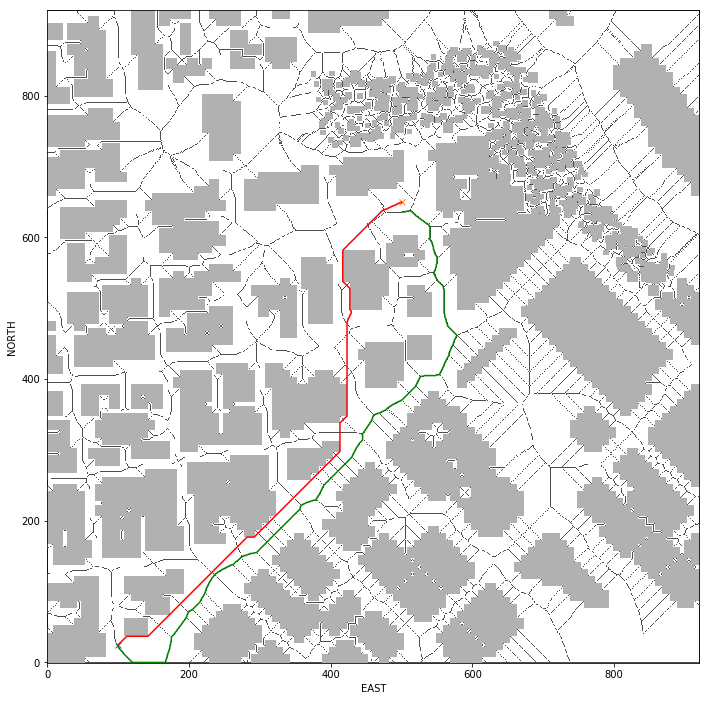

In [14]:
plt.imshow(grid, cmap='Greys', origin='lower')
plt.imshow(skeleton, cmap='Greys', origin='lower', alpha=0.7)
# For the purposes of the visual the east coordinate lay along
# the x-axis and the north coordinates long the y-axis.
plt.plot(start_ne[1], start_ne[0], 'x')
# Uncomment the following as needed
plt.plot(goal_ne[1], goal_ne[0], 'x')

pp = np.array(path)
plt.plot(pp[:, 1], pp[:, 0], 'g')
pp2 = np.array(path2)
plt.plot(pp2[:, 1], pp2[:, 0], 'r')

plt.xlabel('EAST')
plt.ylabel('NORTH')
plt.show()

[solution](/notebooks/Medial-Axis-Solution.ipynb)